In [37]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Define paths
base_path_30seeds = r'c:\Files\Degree\FYP\FYP_ver5\Results\30seeds_results'

# Models to include
models_filter = [
    'baseline_algo',
    'tcn_model_mb_precompute_pool',
    'tcn_model_fine_tune_mb_pool',
    'tcn_model_mb_precompute_pool_adam'
]

# Define sources with their specific datasets
sources = [
    {
        'path': base_path_30seeds,
        'datasets': ['Reddit', 'Twitter', 'RedditSNS', 'Twitter2']
    }
]

def get_model_info(folder_name):
    """
    Extracts Model Name, Group, and Optimizer from the folder name.
    """
    # Determine Optimizer
    is_adam = 'adam' in folder_name.lower()
    optimizer = 'Adam' if is_adam else 'SGD'
    
    # Determine Model Name and Group
    if 'baseline_algo' in folder_name:
        name = 'Baseline (AL-BTCN)'
        group = 'Baseline'
    else:
        name = 'MentalBERT '
        if 'pool' in folder_name:
            name += 'Pool'
        elif 'seqOut' in folder_name:
            name += 'Seq'
        else:
            name += 'Unknown'
            
        group = 'Fine-Tuning' if 'fine_tune' in folder_name else 'Precomputed'
        name = f"{name} ({group})"
    
    # Append Optimizer
    if group == 'Precomputed':
        if is_adam:
            name += " - Adam"
        else:
            name += " - SGD"
    
    return name, group, optimizer

all_data = []

for source in sources:
    base_path = source['path']
    target_datasets = source['datasets']
    
    for dataset in target_datasets:
        dataset_path = os.path.join(base_path, dataset)
        if not os.path.exists(dataset_path):
            print(f"Dataset path not found: {dataset_path}")
            continue
            
        # List all folders
        folders = [f for f in os.listdir(dataset_path) if os.path.isdir(os.path.join(dataset_path, f))]
        
        for folder in folders:
            # Filter for 30S folders (30 seeds)
            if not folder.startswith('30S'):
                continue
                
            # Apply model filter
            if not any(m in folder for m in models_filter):
                continue
                
            # Construct file path to the all_folds excel file
            file_path = os.path.join(dataset_path, folder, f"{folder}_all_folds.xlsx")
            
            if os.path.exists(file_path):
                print(f"Processing {file_path}...")
                try:
                    # Read all sheets (each sheet is a seed)
                    sheets = pd.read_excel(file_path, sheet_name=None)
                    
                    # Concatenate all sheets with Seed info
                    df_list = []
                    for seed_name, sheet_df in sheets.items():
                        # Only use sheet name as seed if 'Seed' column doesn't exist
                        if 'Seed' not in sheet_df.columns:
                            sheet_df['Seed'] = seed_name
                        df_list.append(sheet_df)
                    
                    df = pd.concat(df_list, ignore_index=True)
                    
                    # Get metadata
                    model_name, model_group, optimizer = get_model_info(folder)
                    
                    df['Model Name'] = model_name
                    df['Model Group'] = model_group
                    df['Optimizer'] = optimizer
                    df['Dataset'] = dataset
                    df['Source Folder'] = folder
                    
                    all_data.append(df)
                except Exception as e:
                    print(f"Error reading {file_path}: {e}")
            else:
                print(f"File not found: {file_path}")

if all_data:
    full_df = pd.concat(all_data, ignore_index=True)
    print("Data loaded successfully.")
    print(full_df.head())
    print(full_df.groupby(['Dataset', 'Model Name']).size())
else:
    print("No data loaded.")

Processing c:\Files\Degree\FYP\FYP_ver5\Results\30seeds_results\Reddit\30SR_baseline_algo\30SR_baseline_algo_all_folds.xlsx...
Processing c:\Files\Degree\FYP\FYP_ver5\Results\30seeds_results\Reddit\30SR_tcn_model_mb_precompute_pool_sgd\30SR_tcn_model_mb_precompute_pool_sgd_all_folds.xlsx...
Processing c:\Files\Degree\FYP\FYP_ver5\Results\30seeds_results\Twitter\30ST_baseline_algo\30ST_baseline_algo_all_folds.xlsx...
Processing c:\Files\Degree\FYP\FYP_ver5\Results\30seeds_results\Twitter\30ST_tcn_model_mb_precompute_pool_sgd\30ST_tcn_model_mb_precompute_pool_sgd_all_folds.xlsx...
Processing c:\Files\Degree\FYP\FYP_ver5\Results\30seeds_results\RedditSNS\30SRsns_baseline_algo\30SRsns_baseline_algo_all_folds.xlsx...
Processing c:\Files\Degree\FYP\FYP_ver5\Results\30seeds_results\RedditSNS\30SRsns_tcn_model_mb_precompute_pool_sgd\30SRsns_tcn_model_mb_precompute_pool_sgd_all_folds.xlsx...
Processing c:\Files\Degree\FYP\FYP_ver5\Results\30seeds_results\Twitter2\30ST2_baseline_algo\30ST2_basel

In [38]:
# Define Plotting Functions
import numpy as np

def plot_comparison_across_datasets(df, metric, order=None):
    """
    Plots a combined bar chart across all datasets.
    X-axis: Dataset
    Hue: Model Name
    """
    if df.empty: return
    if metric not in df.columns:
        print(f"Metric '{metric}' not found in dataframe.")
        return

    # Define Dataset Order
    dataset_order = ['Twitter', 'Reddit', 'Twitter2', 'RedditSNS']
    
    # Filter df to only include datasets in dataset_order (and present in df)
    available_datasets = [d for d in dataset_order if d in df['Dataset'].unique()]
    if not available_datasets:
        print("No matching datasets found.")
        return
        
    df_filtered = df[df['Dataset'].isin(available_datasets)]

    plt.figure(figsize=(16, 9))
    
    # Determine if higher is better
    higher_is_better = 'Time' not in metric and 'Memory' not in metric and 'Epochs' not in metric

    ax = sns.barplot(
        data=df_filtered,
        x="Dataset",
        y=metric,
        hue="Model Name",
        order=available_datasets,
        hue_order=order,
        errorbar='sd',
        capsize=.05,
        palette='viridis'
    )
    
    plt.title(f'{metric} Comparison Across Datasets', fontsize=16)
    plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0.)
    
    # Adjust Y-limits
    y_min = df_filtered[metric].min()
    y_max = df_filtered[metric].max()
    y_range = y_max - y_min
    
    lower_ylim = y_min - y_range * 0.2
    if not higher_is_better and 'Accuracy' not in metric and 'F1' not in metric and 'AUC' not in metric:
         lower_ylim = max(0, lower_ylim)
    if 'Accuracy' in metric or 'F1' in metric or 'AUC' in metric:
         lower_ylim = max(0, y_min - 0.1)

    upper_ylim = y_max + y_range * 0.2 # Increase upper limit for text
    plt.ylim(lower_ylim, upper_ylim)

    # --- Annotation Logic ---
    
    # Calculate stats
    stats = df_filtered.groupby(['Dataset', 'Model Name'])[metric].agg(['mean', 'std']).reset_index()
    
    # Find best model per dataset
    best_models = {}
    for dataset in available_datasets:
        d_stats = stats[stats['Dataset'] == dataset]
        if d_stats.empty: continue
        
        # Filter to only models in 'order' if provided
        if order:
            d_stats = d_stats[d_stats['Model Name'].isin(order)]
            
        if d_stats.empty: continue

        if higher_is_better:
            best_model = d_stats.loc[d_stats['mean'].idxmax(), 'Model Name']
        else:
            best_model = d_stats.loc[d_stats['mean'].idxmin(), 'Model Name']
        best_models[dataset] = best_model

    # Iterate through patches to add text
    # Seaborn barplot with hue draws patches in order of Hue, then X
    # i.e. Hue1-X1, Hue1-X2, ..., Hue2-X1, Hue2-X2, ...
    
    patches = ax.patches
    
    # We need to iterate in the same order seaborn draws them
    patch_idx = 0
    
    # Ensure we have the hue order used by seaborn
    hue_order_used = order if order else sorted(df_filtered['Model Name'].unique())
    
    for model_name in hue_order_used:
        for dataset_name in available_datasets:
            if patch_idx >= len(patches):
                break
            
            patch = patches[patch_idx]
            patch_idx += 1
            
            # Get stats for this combination
            subset = stats[(stats['Dataset'] == dataset_name) & (stats['Model Name'] == model_name)]
            
            if subset.empty:
                continue
                
            mean_val = subset['mean'].values[0]
            std_val = subset['std'].values[0]
            
            # Skip if patch height is NaN or 0 (if data was missing but group existed)
            if np.isnan(patch.get_height()):
                continue

            # Determine if this is the best model for this dataset
            is_best = (model_name == best_models.get(dataset_name))
            font_weight = 'bold' if is_best else 'normal'
            
            # Text content
            text = f"{mean_val:.4f}\n±{std_val:.4f}"
            
            # Position
            x = patch.get_x() + patch.get_width() / 2
            y = patch.get_height()
            
            # Place text above the error bar (approximate)
            text_y = y + std_val + (upper_ylim - lower_ylim) * 0.01
            
            ax.text(
                x, 
                text_y, 
                text, 
                ha='center', 
                va='bottom', 
                fontsize=12, 
                fontweight=font_weight, 
                color='black',
                rotation=0
            )

    plt.tight_layout()
    plt.show()

def plot_boxplot_across_datasets(df, metric, order=None):
    """
    Plots a combined box plot across all datasets.
    """
    if df.empty: return
    if metric not in df.columns: return

    # Define Dataset Order
    dataset_order = ['Twitter', 'Reddit', 'Twitter2', 'RedditSNS']
    
    # Filter df
    available_datasets = [d for d in dataset_order if d in df['Dataset'].unique()]
    if not available_datasets: return
    
    df_filtered = df[df['Dataset'].isin(available_datasets)]

    plt.figure(figsize=(16, 9))
    ax = sns.boxplot(
        data=df_filtered,
        x="Dataset",
        y=metric,
        hue="Model Name",
        order=available_datasets,
        hue_order=order,
        palette='viridis'
    )
    
    # Add points
    sns.stripplot(
        data=df_filtered,
        x="Dataset",
        y=metric,
        hue="Model Name",
        order=available_datasets,
        hue_order=order,
        dodge=True,
        color='blue',
        alpha=0.5,
        size=3, # Adjusted dot size
        jitter=True,
        ax=ax
    )
    
    plt.title(f'{metric} Distribution Across Datasets', fontsize=16)
    
    # Fix legend to only show boxplot entries
    handles, labels = ax.get_legend_handles_labels()
    n_models = len(order) if order else df_filtered['Model Name'].nunique()
    plt.legend(handles=handles[:n_models], labels=labels[:n_models], bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0.)
    
    plt.tight_layout()
    plt.show()

=== Accuracy ===


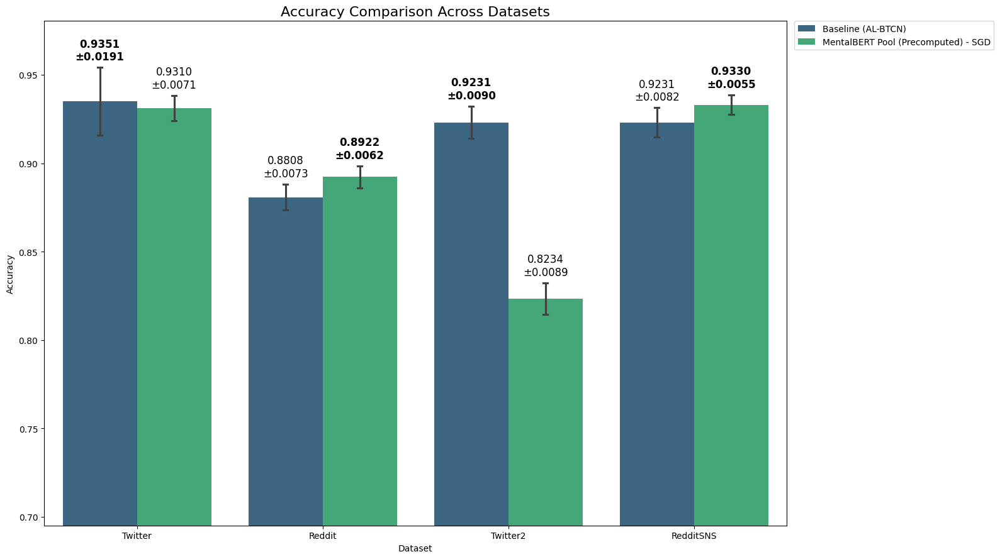

C:\Users\User\AppData\Local\Temp\ipykernel_26416\2288344247.py:173: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:blue'` for the same effect.

  sns.stripplot(


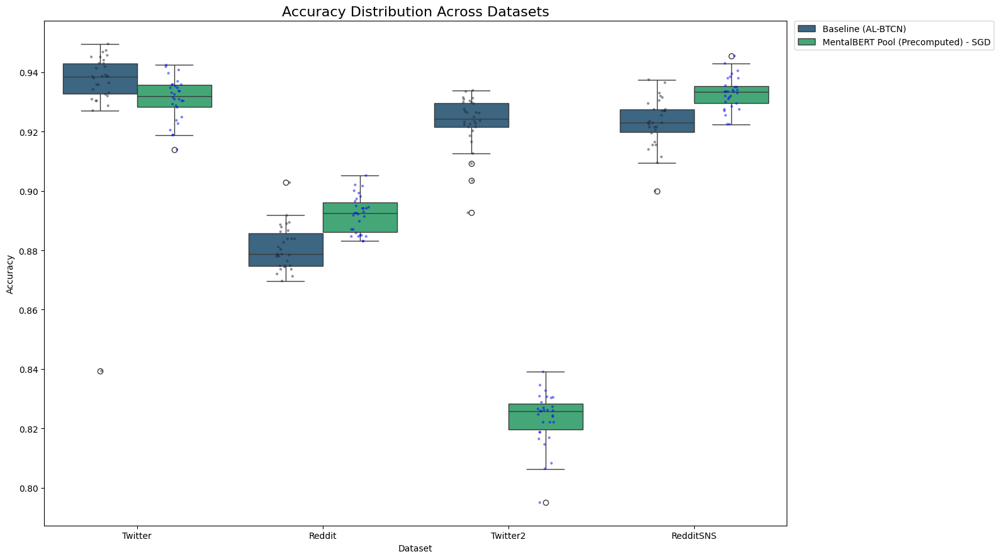

=== Precision ===


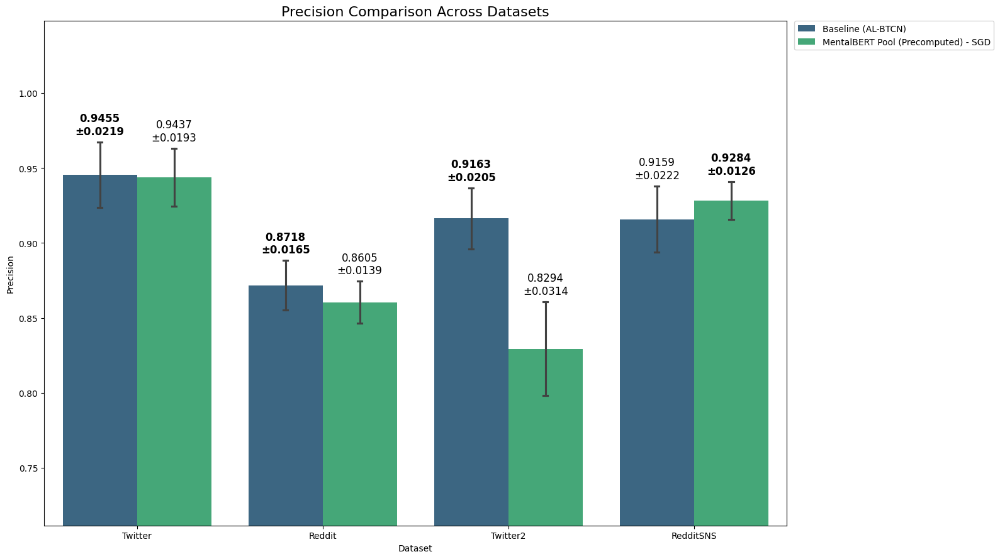

C:\Users\User\AppData\Local\Temp\ipykernel_26416\2288344247.py:173: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:blue'` for the same effect.

  sns.stripplot(


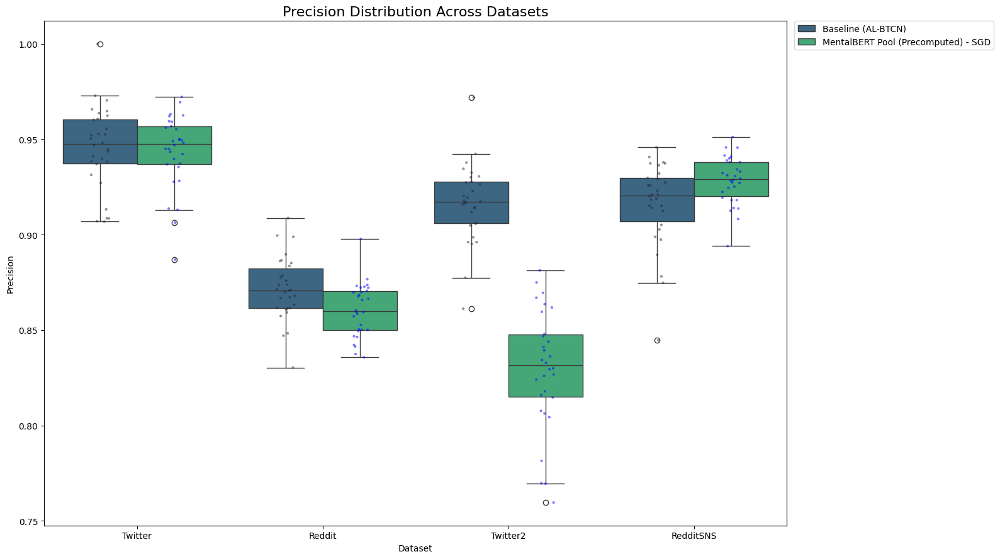

=== Recall ===


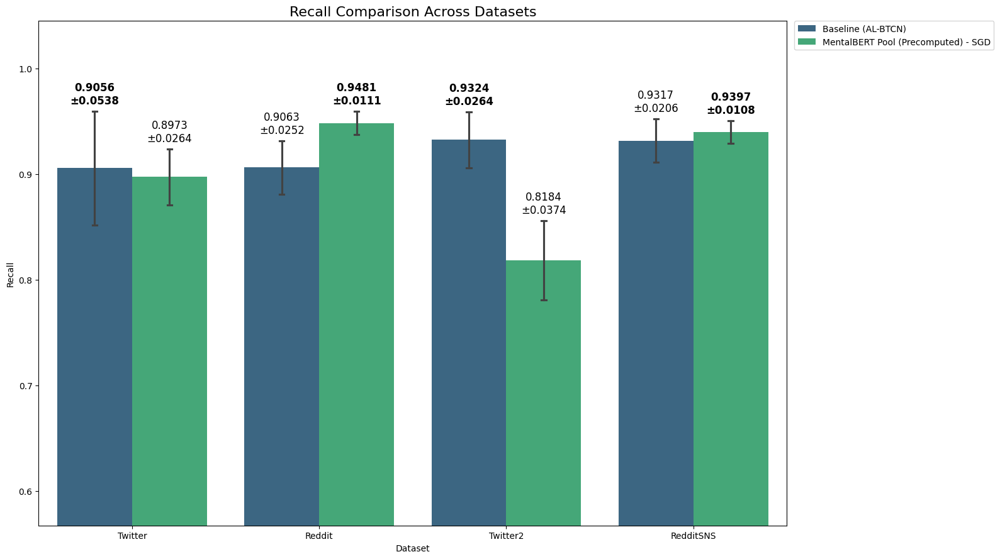

C:\Users\User\AppData\Local\Temp\ipykernel_26416\2288344247.py:173: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:blue'` for the same effect.

  sns.stripplot(


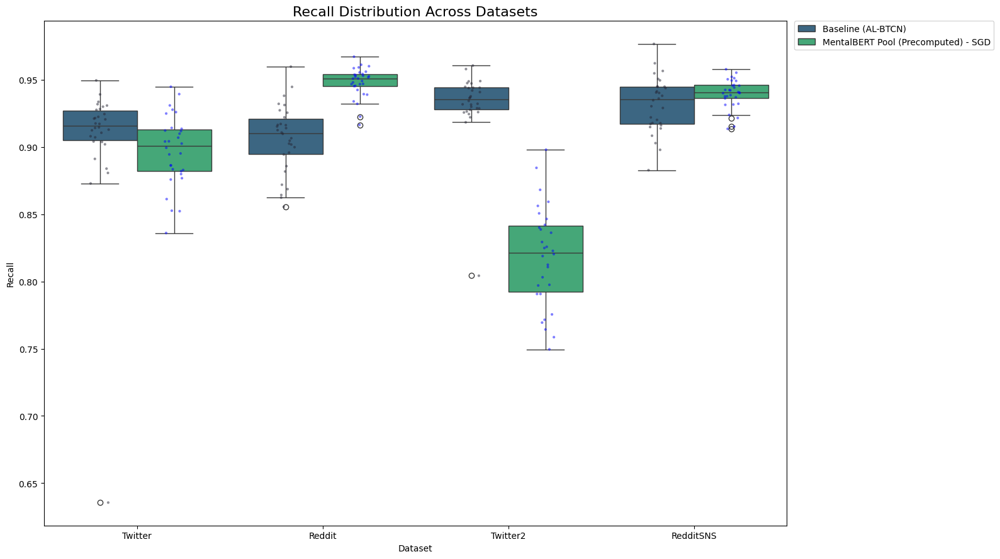

=== F1-Score ===


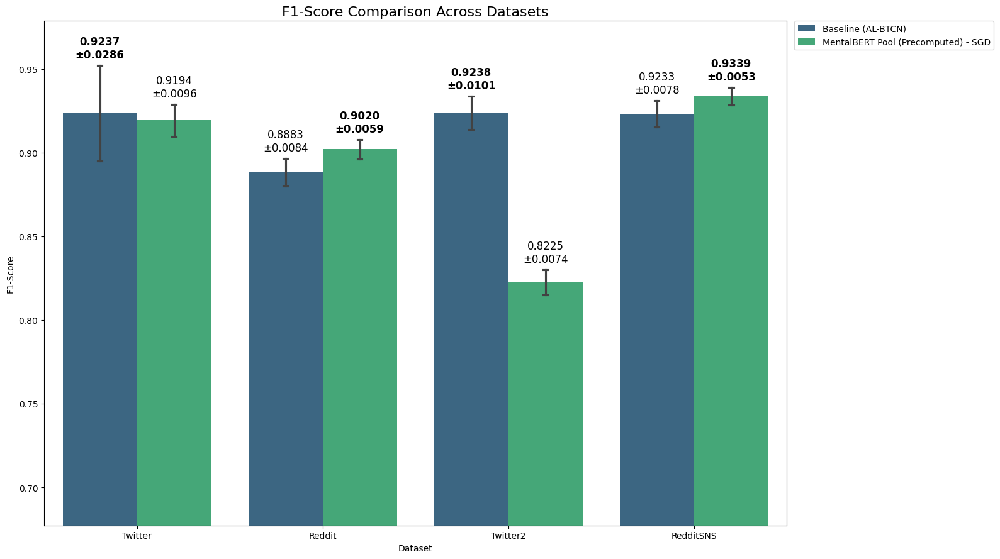

C:\Users\User\AppData\Local\Temp\ipykernel_26416\2288344247.py:173: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:blue'` for the same effect.

  sns.stripplot(


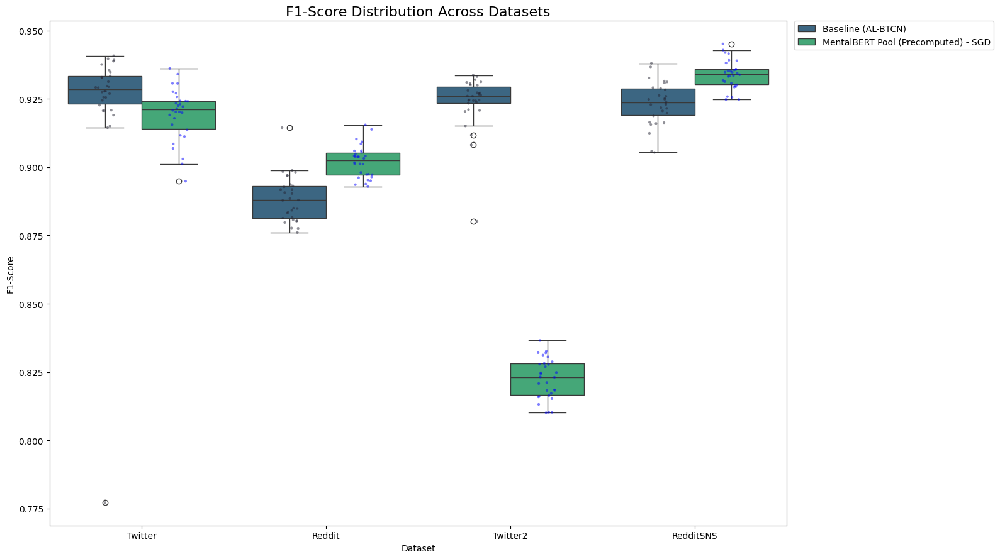

=== ROC-AUC ===


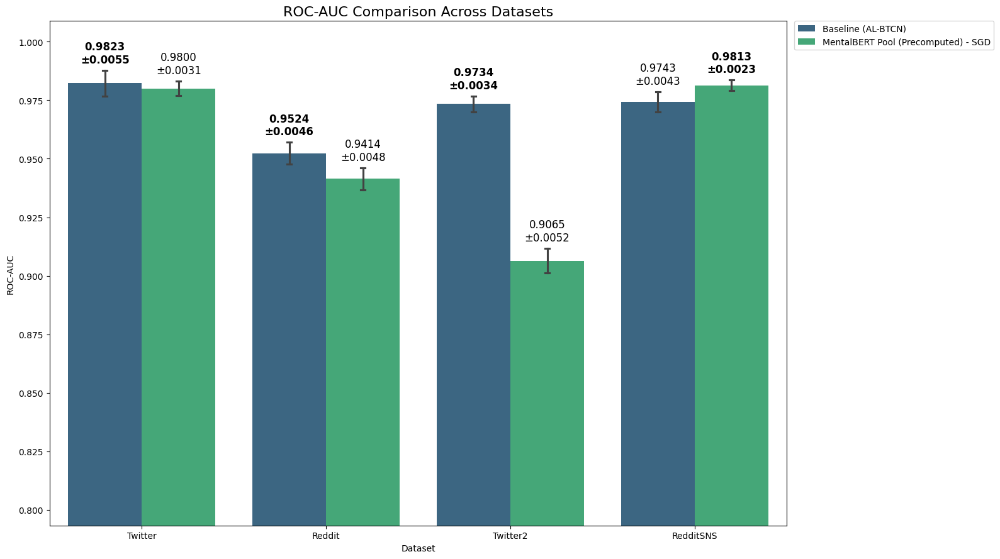

C:\Users\User\AppData\Local\Temp\ipykernel_26416\2288344247.py:173: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:blue'` for the same effect.

  sns.stripplot(


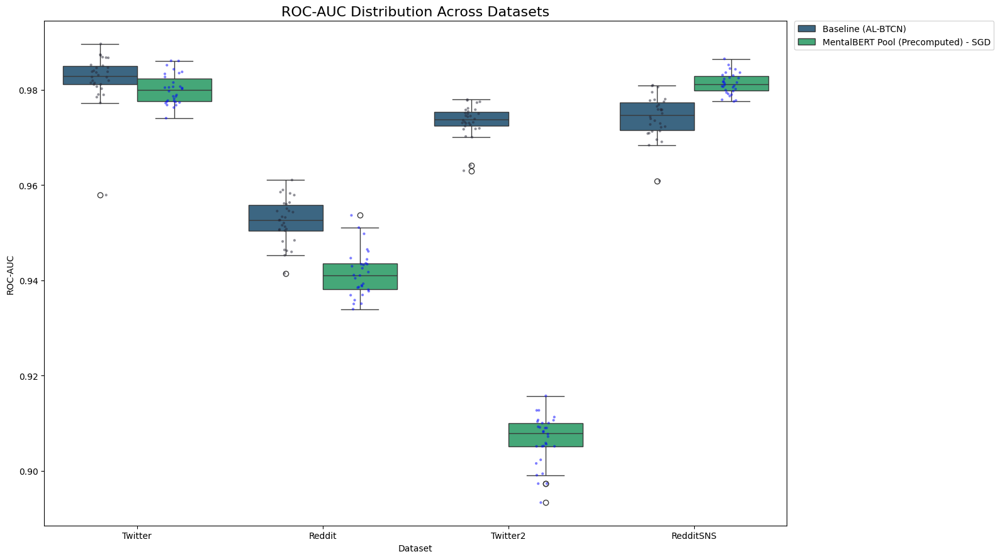

=== Training Time (s) ===


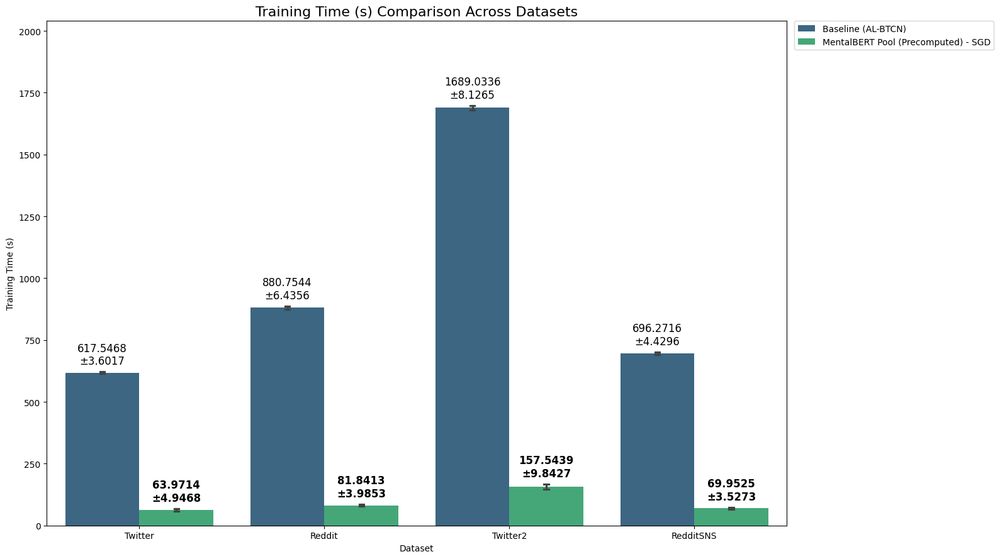

C:\Users\User\AppData\Local\Temp\ipykernel_26416\2288344247.py:173: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:blue'` for the same effect.

  sns.stripplot(


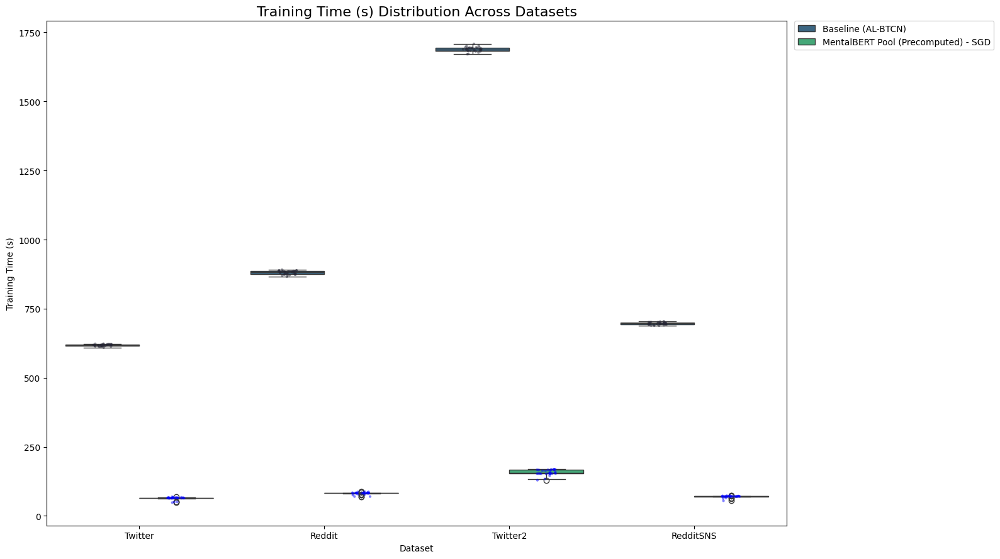

=== Max GPU Memory (MB) ===


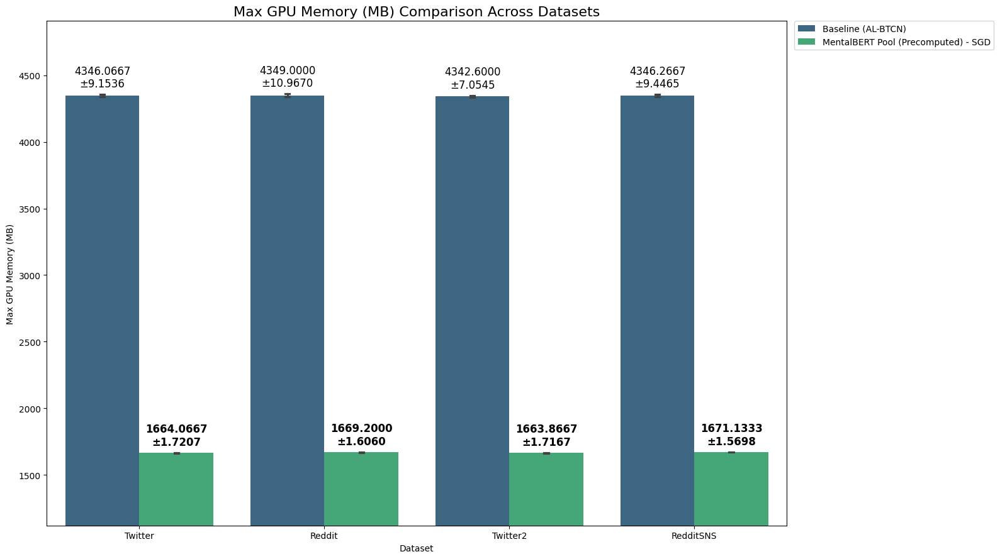

C:\Users\User\AppData\Local\Temp\ipykernel_26416\2288344247.py:173: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:blue'` for the same effect.

  sns.stripplot(


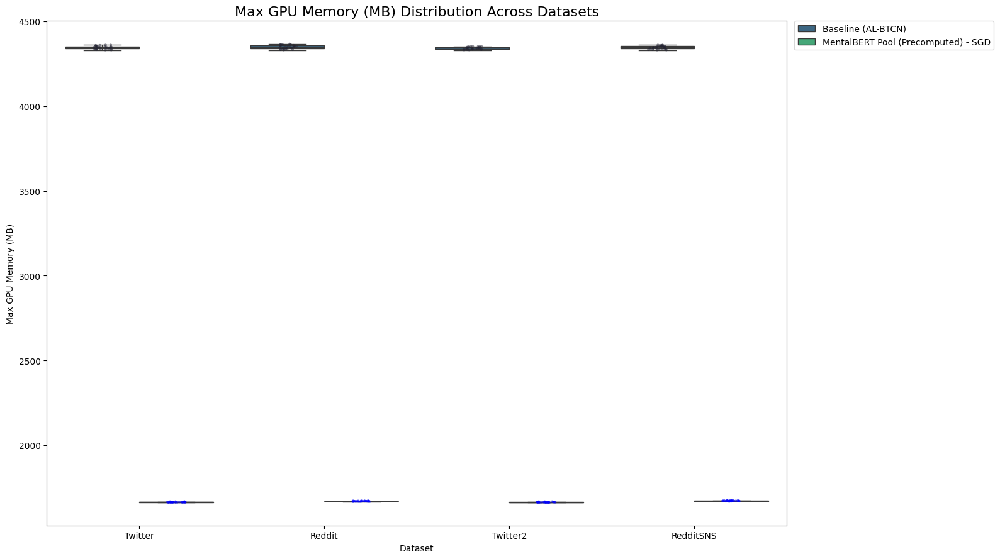

=== Avg GPU Memory (MB) ===


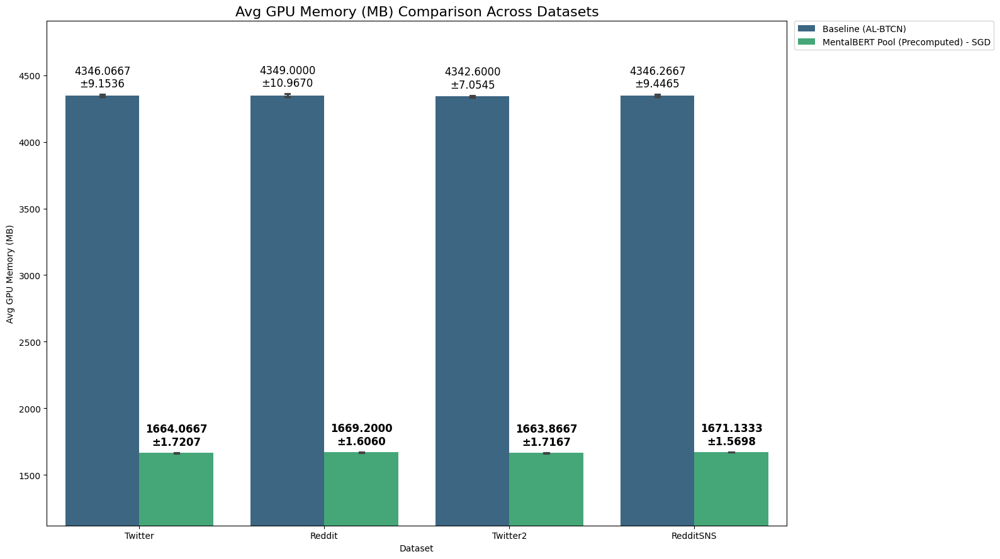

C:\Users\User\AppData\Local\Temp\ipykernel_26416\2288344247.py:173: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:blue'` for the same effect.

  sns.stripplot(


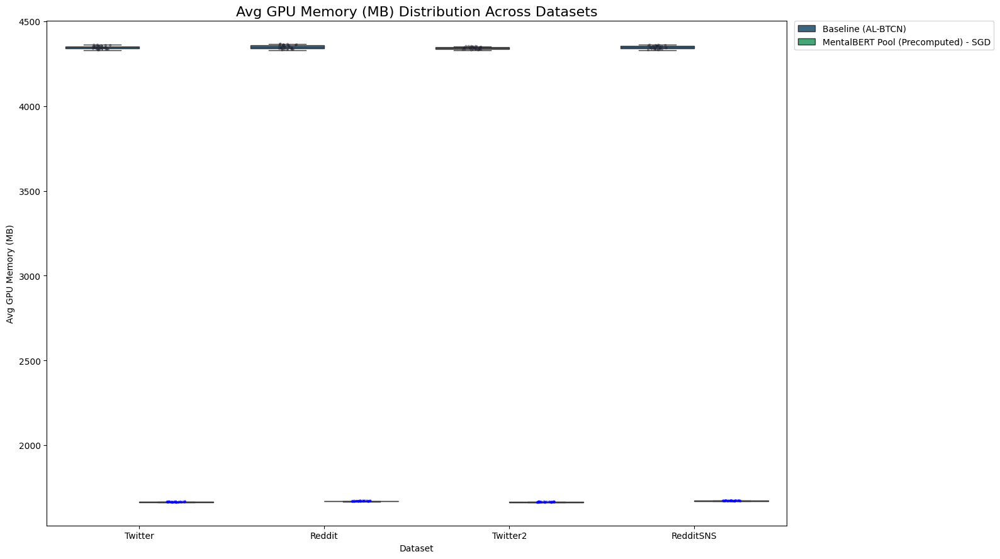

=== Epochs Run ===


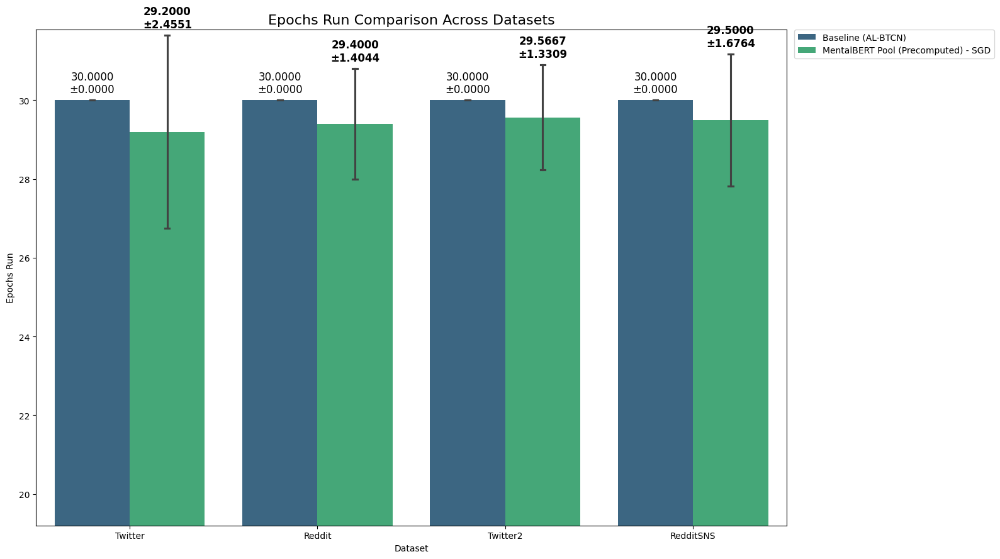

C:\Users\User\AppData\Local\Temp\ipykernel_26416\2288344247.py:173: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:blue'` for the same effect.

  sns.stripplot(


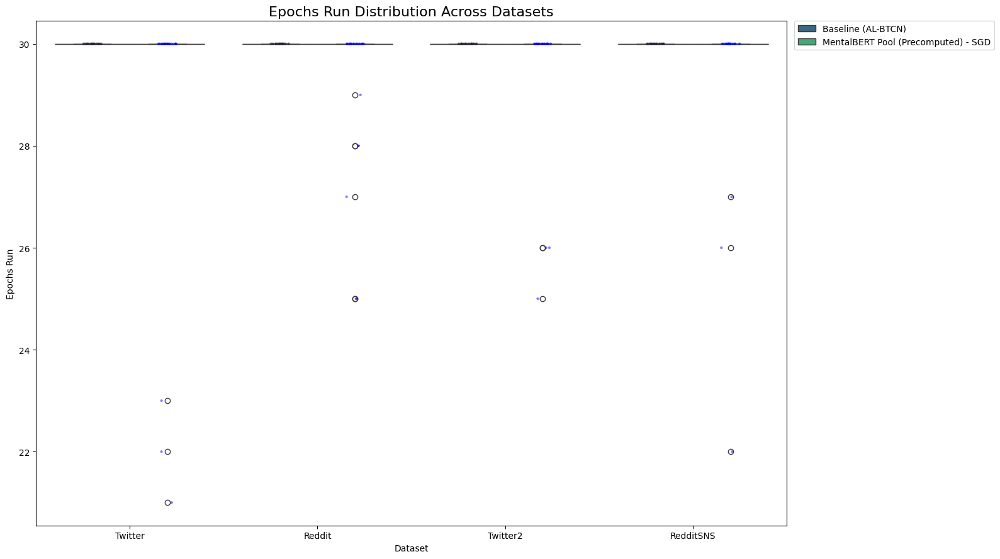

=== Avg Time/Epoch (s) ===


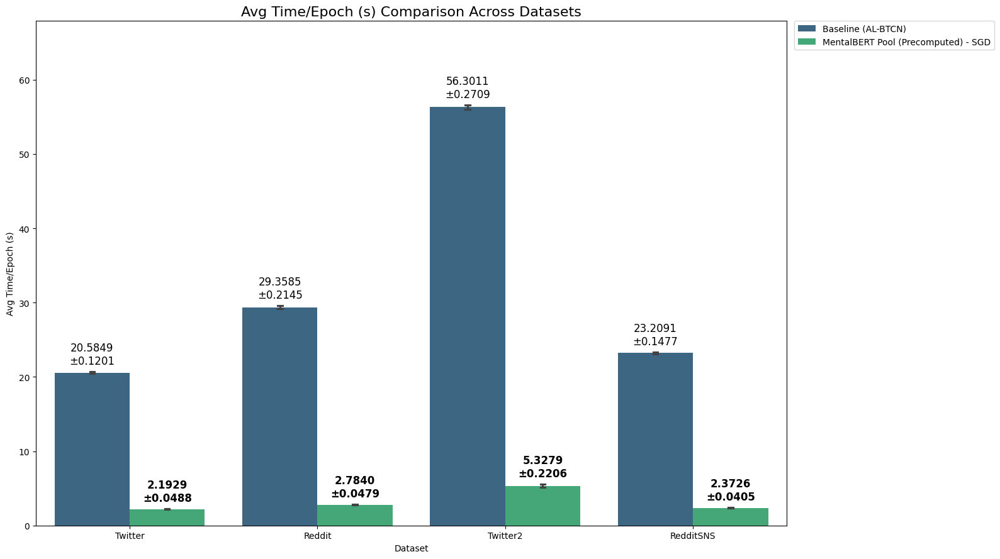

C:\Users\User\AppData\Local\Temp\ipykernel_26416\2288344247.py:173: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:blue'` for the same effect.

  sns.stripplot(


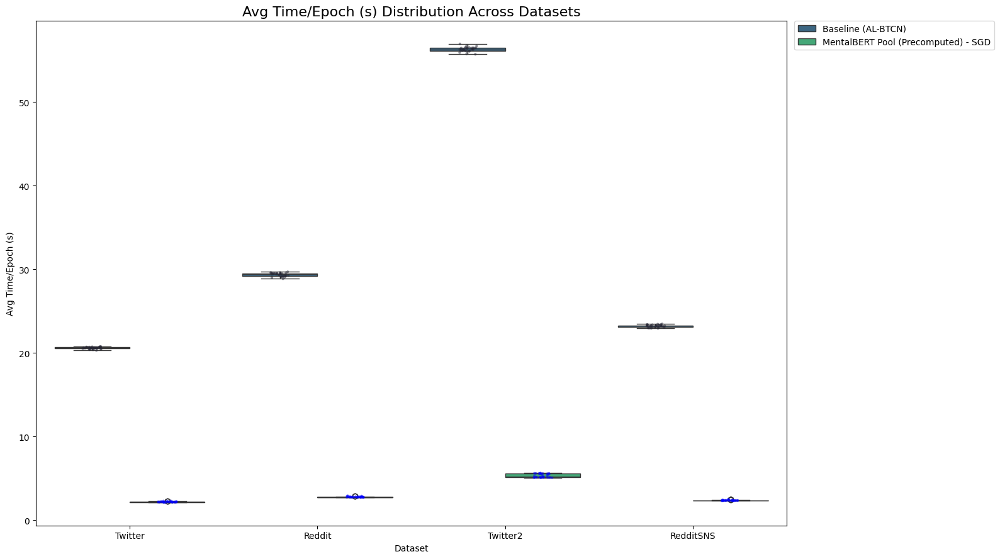

In [39]:
# Define Metrics and Order
metrics_to_plot = [
    'Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC',
    'Training Time (s)', 'Max GPU Memory (MB)', 'Avg GPU Memory (MB)', 
    'Epochs Run', 'Avg Time/Epoch (s)'
]

model_order = [
    'Baseline (AL-BTCN)',
    'MentalBERT Pool (Precomputed) - SGD'
]

# Generate Plots
for metric in metrics_to_plot:
    print(f"=== {metric} ===")
    plot_comparison_across_datasets(full_df, metric, order=model_order)
    plot_boxplot_across_datasets(full_df, metric, order=model_order)

In [40]:
# Define Plotting Functions

def plot_barchart_dataset(df, dataset_name, metric, order=None):
    """
    Plots a bar chart for a specific dataset and metric.
    """
    # Determine if higher is better based on metric name
    higher_is_better = 'Time' not in metric and 'Memory' not in metric and 'Epochs' not in metric
    
    # Metrics to exclude from group-wise bolding
    exclude_from_group_bolding = ['Training Time (s)', 'Max GPU Memory (MB)', 'Avg GPU Memory (MB)', 'Epochs Run', 'Avg Time/Epoch (s)']
    use_group_bolding = metric not in exclude_from_group_bolding
    
    # Filter for dataset
    data = df[df['Dataset'] == dataset_name]
    
    if data.empty:
        print(f"No data for {dataset_name}")
        return

    plt.figure(figsize=(11, 7))
    ax = sns.barplot(
        data=data,
        x="Model Name",
        y=metric,
        order=order,
        errorbar='sd', # Show standard deviation
        capsize=.1
    )
    
    # Adjust y-axis limits
    y_min = df[metric].min()
    y_max = df[metric].max()
    y_range = y_max - y_min
    
    lower_ylim = y_min - y_range * 0.2
    if not higher_is_better and 'Accuracy' not in metric and 'F1' not in metric: # For time/memory, start from 0 usually, unless range is small
         lower_ylim = max(0, lower_ylim)
    
    # For accuracy/f1, we might want to zoom in, but let's keep it dynamic
    if 'Accuracy' in metric or 'F1' in metric or 'Precision' in metric or 'Recall' in metric:
         lower_ylim = max(0, y_min - 0.05) # Zoom in a bit for metrics
         
    upper_ylim = y_max + y_range * 0.2
    
    plt.ylim(lower_ylim, upper_ylim)
    
    plt.title(f'{metric} - {dataset_name}', fontsize=16)
    plt.xticks(rotation=45, ha='right')
    
    # Add annotations
    
    best_models = []
    
    if use_group_bolding:
        # Find best in 'Precomputed' and 'Fine-Tuning' groups
        if 'Model Group' in data.columns:
            for group in ['Precomputed', 'Fine-Tuning']:
                group_df = data[data['Model Group'] == group]
                if group_df.empty: continue
                
                means = group_df.groupby('Model Name')[metric].mean()
                if means.empty: continue
                
                if higher_is_better:
                    best_model = means.idxmax()
                else:
                    best_model = means.idxmin()
                best_models.append(best_model)
        else:
             # Fallback
             means = data.groupby('Model Name')[metric].mean()
             if not means.empty:
                if higher_is_better:
                    best_models.append(means.idxmax())
                else:
                    best_models.append(means.idxmin())
    else:
        # Original logic: global best
        means = data.groupby('Model Name')[metric].mean()
        if not means.empty:
            if higher_is_better:
                best_models.append(means.idxmax())
            else:
                best_models.append(means.idxmin())

    # Add text to bars
    if order:
        x_models = order
    else:
        x_models = sorted(data['Model Name'].unique())
        
    for i, patch in enumerate(ax.patches):
        if i >= len(x_models):
            continue
            
        model_name = x_models[i]
        
        subset = data[data['Model Name'] == model_name]
        
        if not subset.empty:
            mean_val = subset[metric].mean()
            std_val = subset[metric].std()
            
            x = patch.get_x() + patch.get_width() / 2
            y = patch.get_height()
            
            text = f"{mean_val:.4f}\n±{std_val:.4f}"
            
            is_best = (model_name in best_models)
            font_weight = 'bold' if is_best else 'normal'
            
            # Position text above the error bar
            text_y = y + std_val + (upper_ylim - lower_ylim)*0.02
            
            ax.text(
                x, 
                text_y, 
                text, 
                ha='center', 
                va='bottom', 
                fontsize=9, 
                color='black',
                fontweight=font_weight
            )
            
            if is_best:
                # Bold x-axis label
                xticklabels = ax.get_xticklabels()
                for label in xticklabels:
                    if label.get_text() == model_name:
                        label.set_fontweight('bold')
            
            # Apply Color
            model_group = subset['Model Group'].iloc[0] if 'Model Group' in subset.columns else 'Unknown'
            
            color = '#7f7f7f' # Default grey (Baseline)
            if dataset_name == 'Twitter' or dataset_name == 'Twitter2':
                if model_group == 'Fine-Tuning': color = '#1f77b4' # Blue
                elif model_group == 'Precomputed': color = '#aec7e8' # Light Blue
            elif dataset_name == 'Reddit' or dataset_name == 'RedditSNS':
                if model_group == 'Fine-Tuning': color = '#d62728' # Red
                elif model_group == 'Precomputed': color = '#ff9896' # Light Red
            
            patch.set_facecolor(color)

    plt.tight_layout()
    plt.show()

def plot_boxplot_comparison(df, dataset_name, metric, order=None):
    """
    Plots a boxplot comparison for a specific dataset.
    """
    data = df[df['Dataset'] == dataset_name]
    
    if data.empty:
        return

    plt.figure(figsize=(14, 7))
    ax = sns.boxplot(
        data=data,
        x="Model Name",
        y=metric,
        order=order
    )
    
    # Add points
    sns.stripplot(
        data=data,
        x="Model Name",
        y=metric,
        order=order,
        color='cyan',
        alpha=0.5,
        jitter=True,
        ax=ax
    )
    
    plt.title(f'{metric} Distribution - {dataset_name}', fontsize=16)
    plt.xticks(rotation=45, ha='right')
    
    # Apply colors
    x_models = [label.get_text() for label in ax.get_xticklabels()]
    boxes = ax.artists if ax.artists else ax.patches
    
    for i, box in enumerate(boxes):
        if i >= len(x_models):
            continue
            
        model_name = x_models[i]
        subset = data[data['Model Name'] == model_name]
        
        if not subset.empty:
            # Determine Color
            model_group = subset['Model Group'].iloc[0] if 'Model Group' in subset.columns else 'Unknown'
            
            color = '#7f7f7f' # Default grey (Baseline)
            if dataset_name == 'Twitter' or dataset_name == 'Twitter2':
                if model_group == 'Fine-Tuning': color = '#1f77b4' # Blue
                elif model_group == 'Precomputed': color = '#aec7e8' # Light Blue
            elif dataset_name == 'Reddit' or dataset_name == 'RedditSNS':
                if model_group == 'Fine-Tuning': color = '#d62728' # Red
                elif model_group == 'Precomputed': color = '#ff9896' # Light Red
            
            box.set_facecolor(color)

    plt.tight_layout()
    plt.show()

In [41]:
# Define Metrics and Order
metrics_to_plot = [
    'Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC',
    'Training Time (s)', 'Max GPU Memory (MB)', 'Avg GPU Memory (MB)', 
    'Epochs Run', 'Avg Time/Epoch (s)'
]

# Define a logical order for models
model_order_v2 = [
    'Baseline (AL-BTCN)',
    'MentalBERT Pool (Precomputed) - SGD',
    'MentalBERT Pool (Fine-Tuning)',
    'MentalBERT Pool (Precomputed) - Adam'
]

# Use full_df directly
full_df_v2 = full_df

print("Updated Model Names:", full_df_v2['Model Name'].unique())
print("Datasets:", full_df_v2['Dataset'].unique())

Updated Model Names: ['Baseline (AL-BTCN)' 'MentalBERT Pool (Precomputed) - SGD']
Datasets: ['Reddit' 'Twitter' 'RedditSNS' 'Twitter2']


=== Accuracy ===
--- Reddit ---


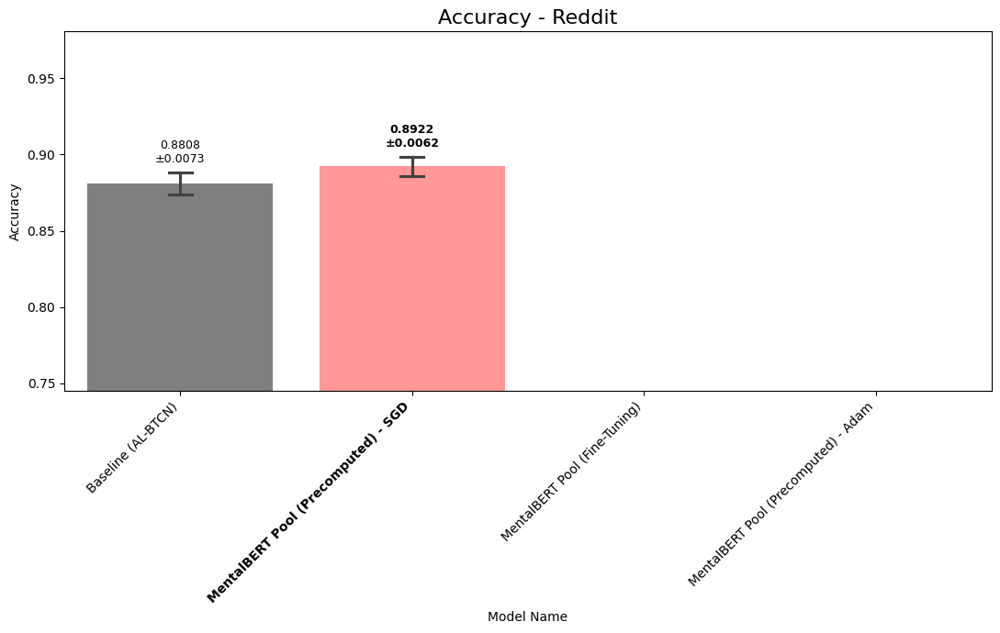

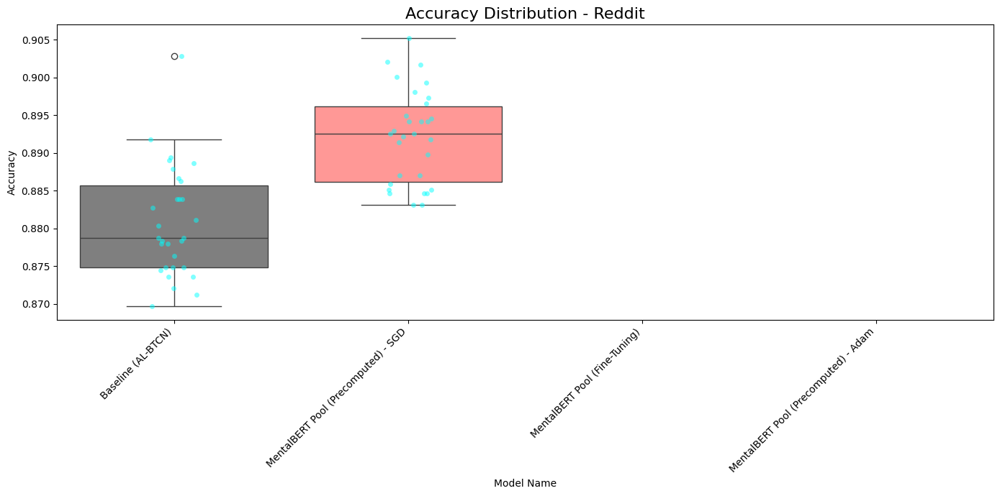

--- Twitter ---


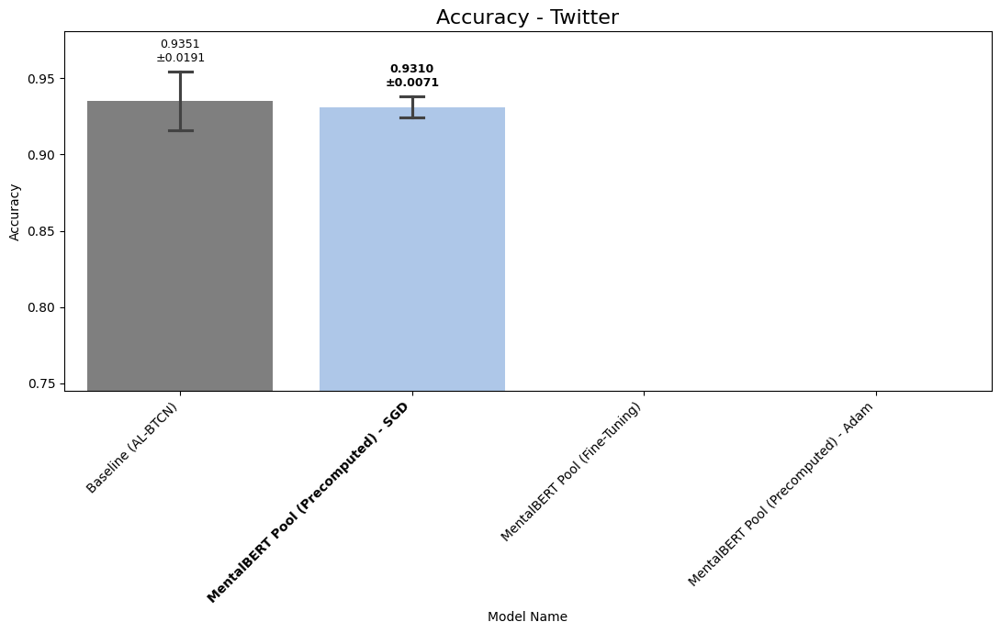

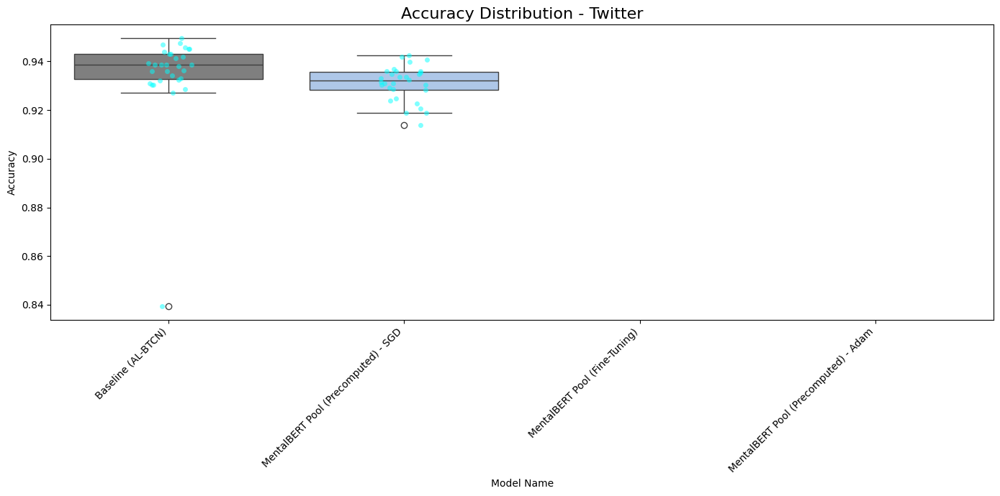

--- RedditSNS ---


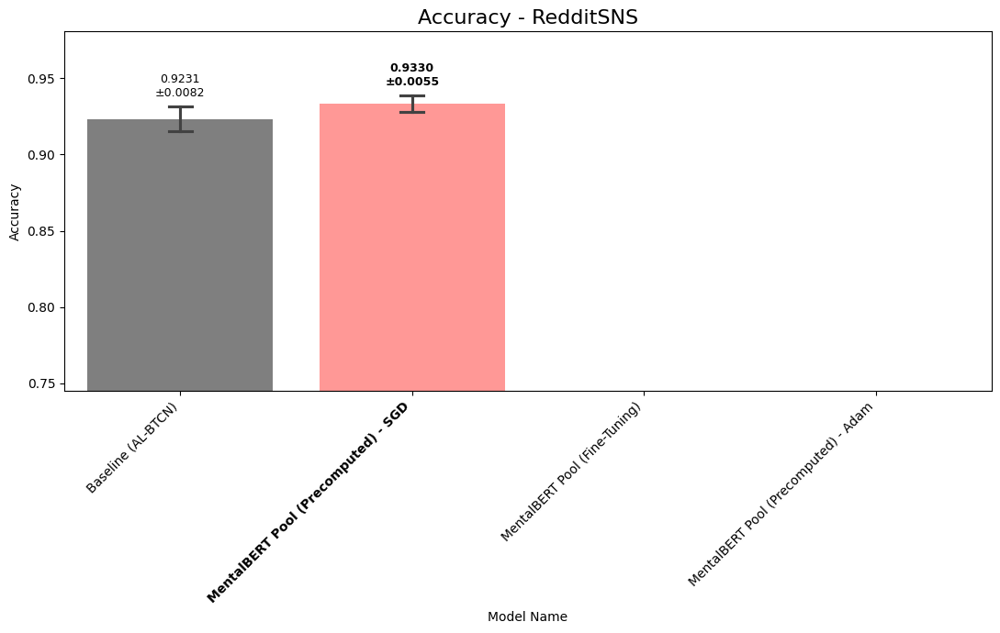

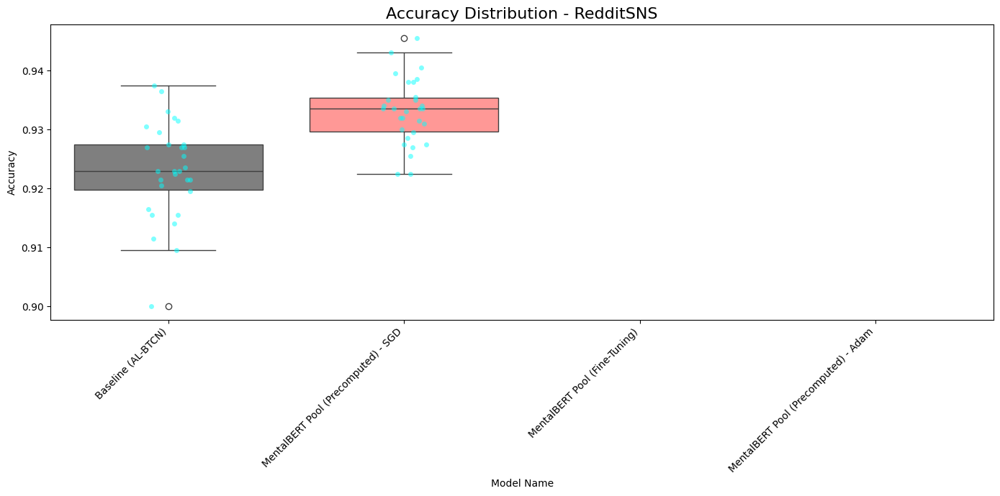

--- Twitter2 ---


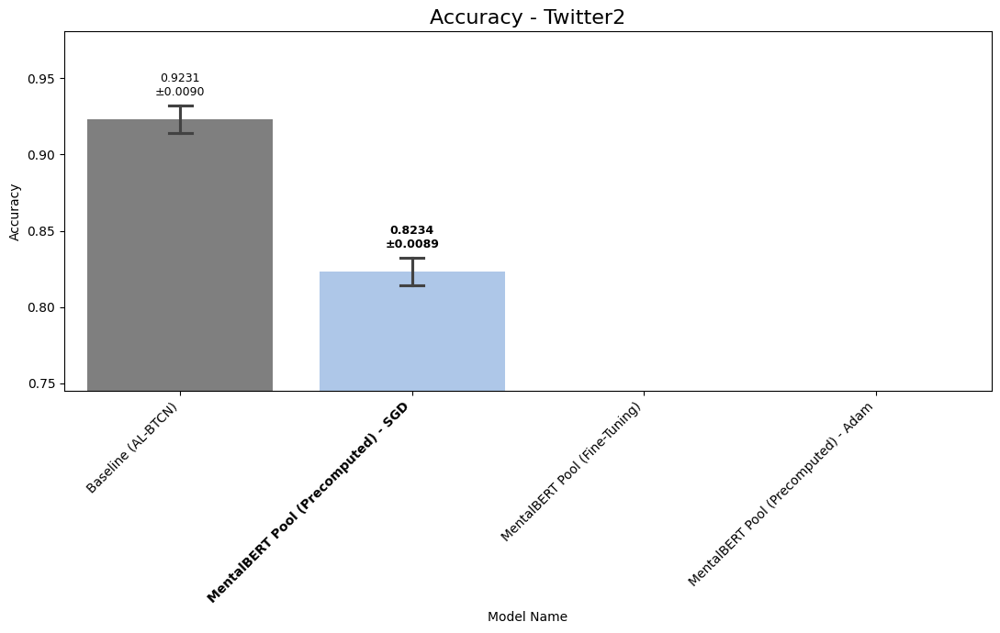

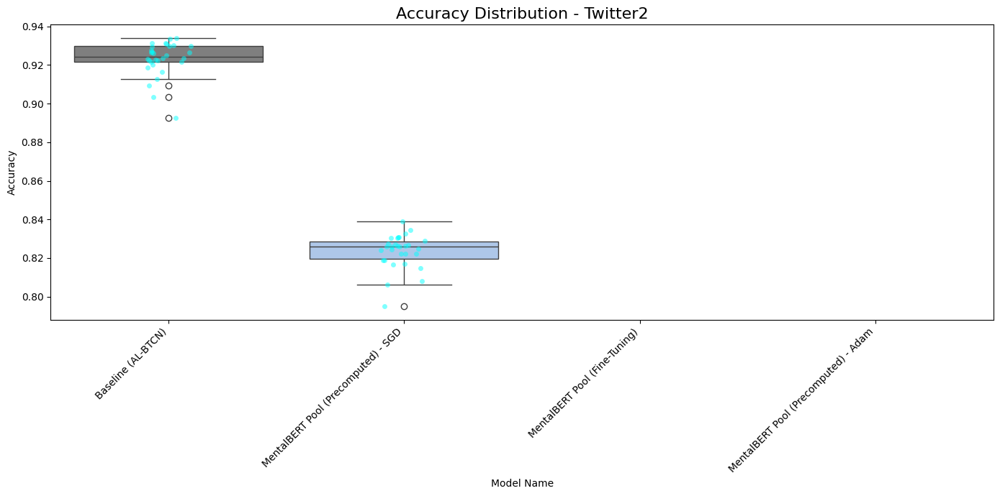

=== Precision ===
--- Reddit ---


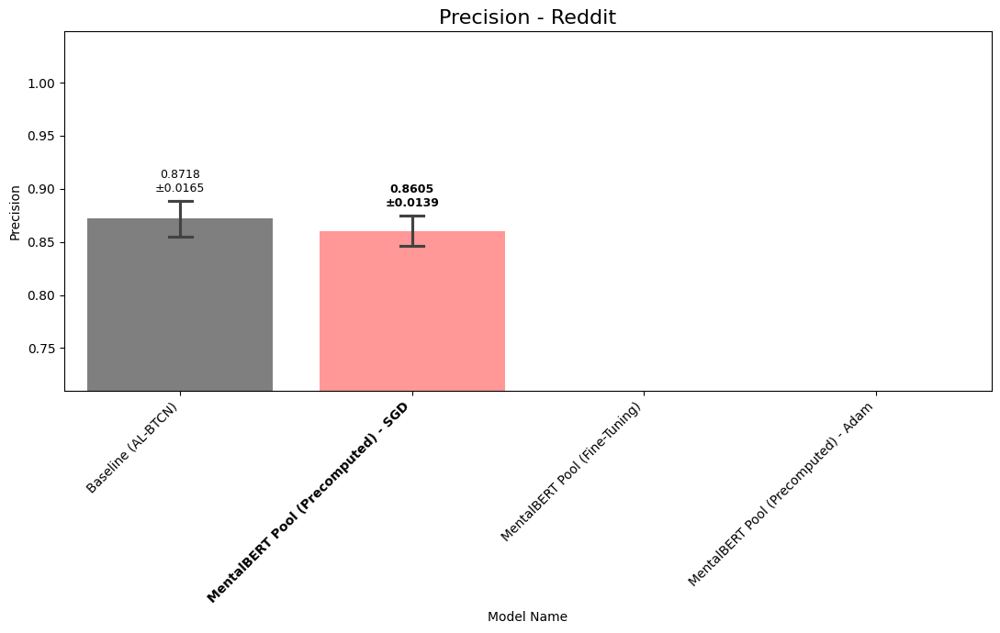

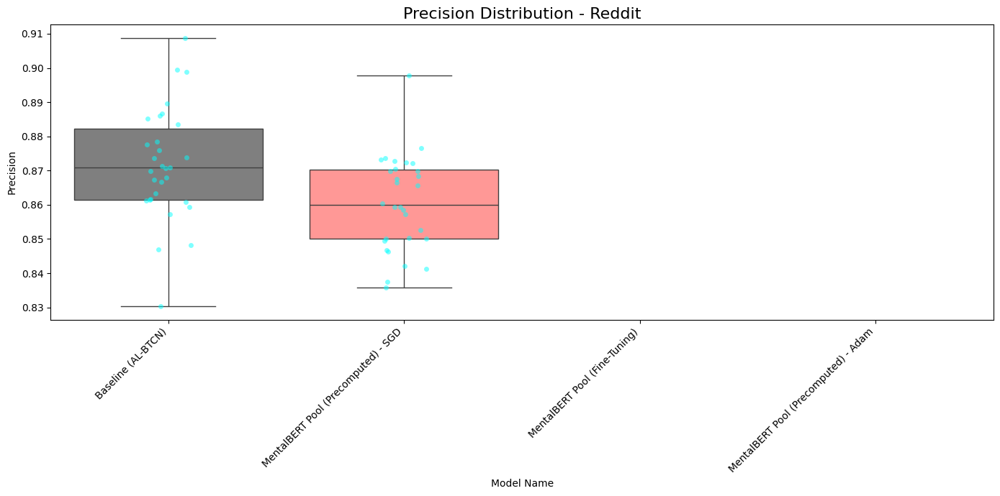

--- Twitter ---


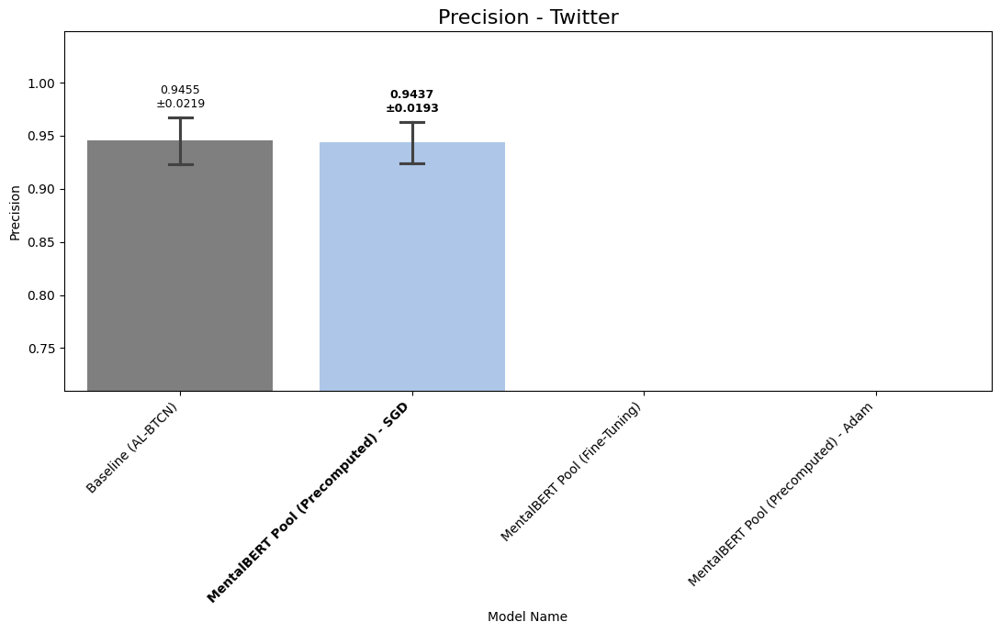

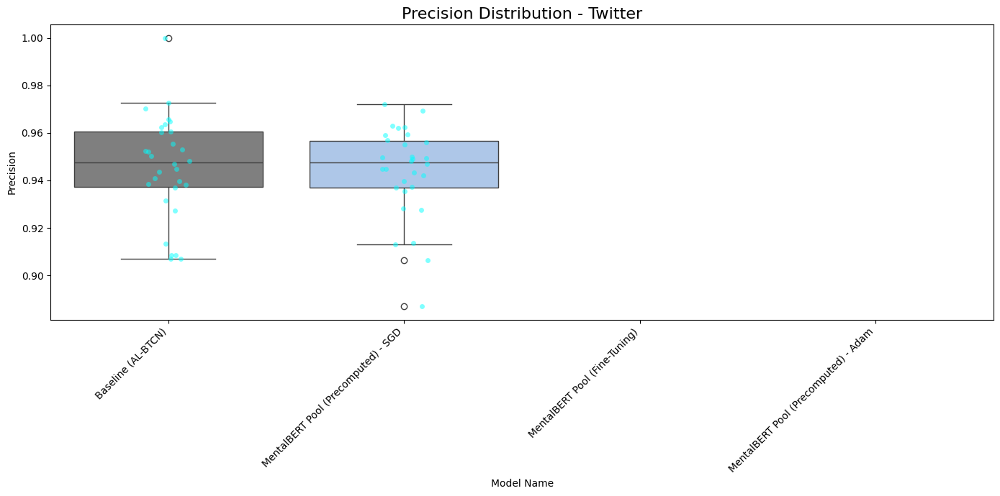

--- RedditSNS ---


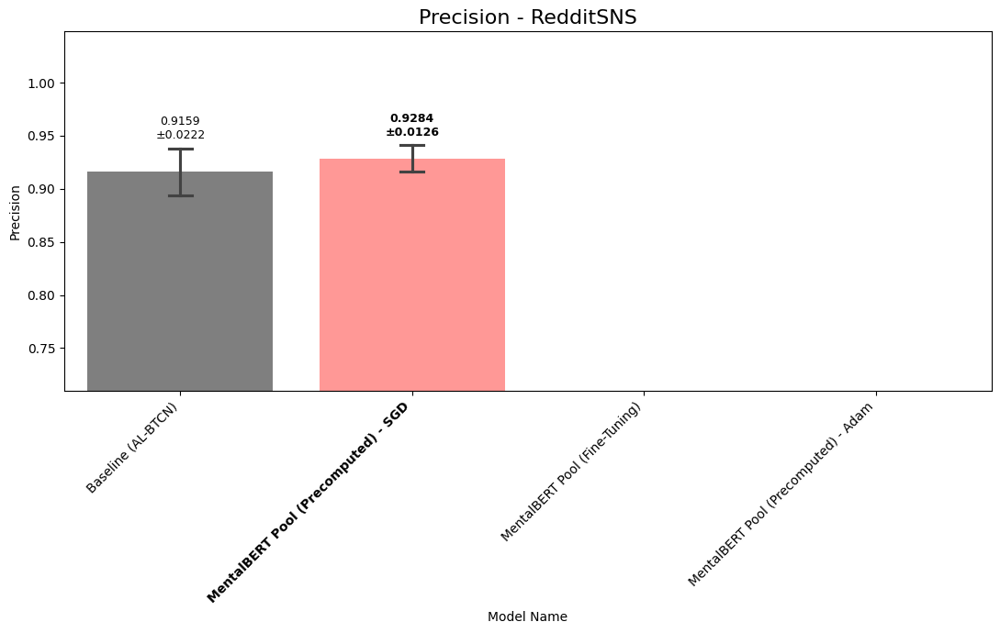

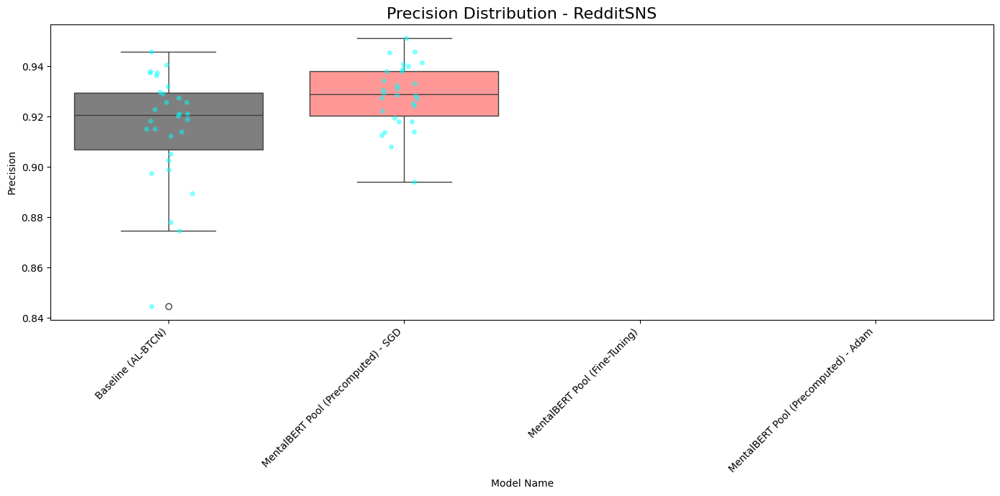

--- Twitter2 ---


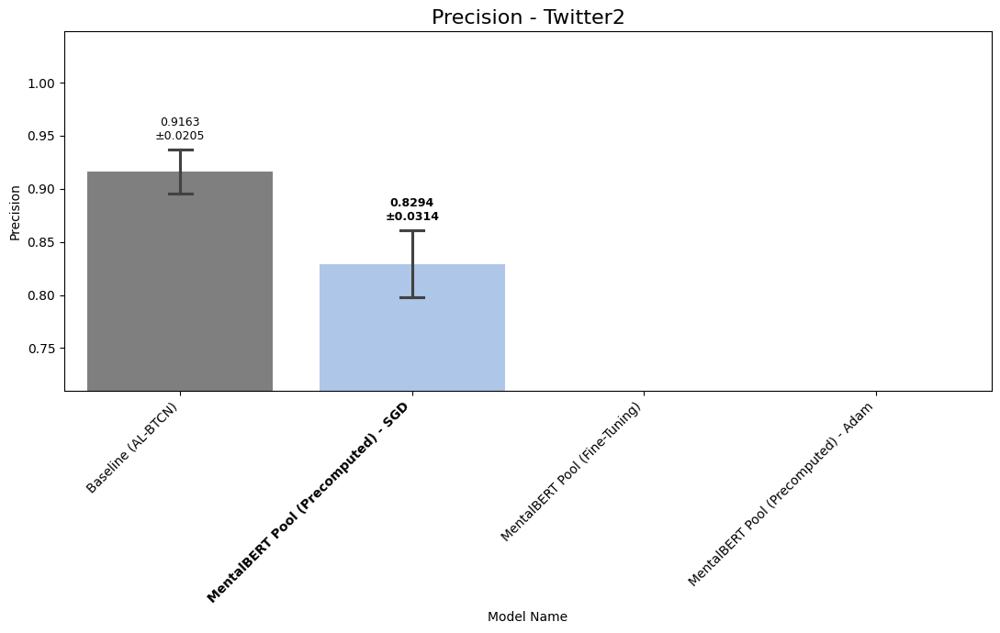

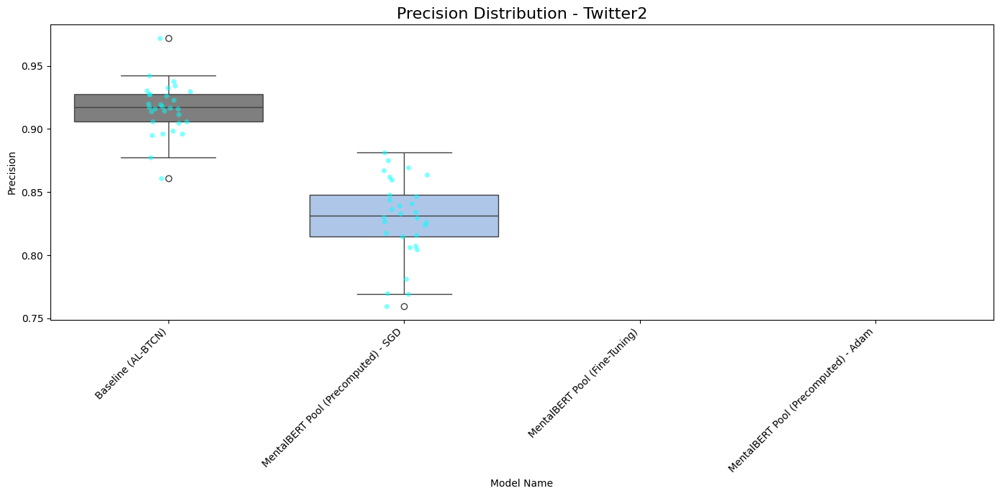

=== Recall ===
--- Reddit ---


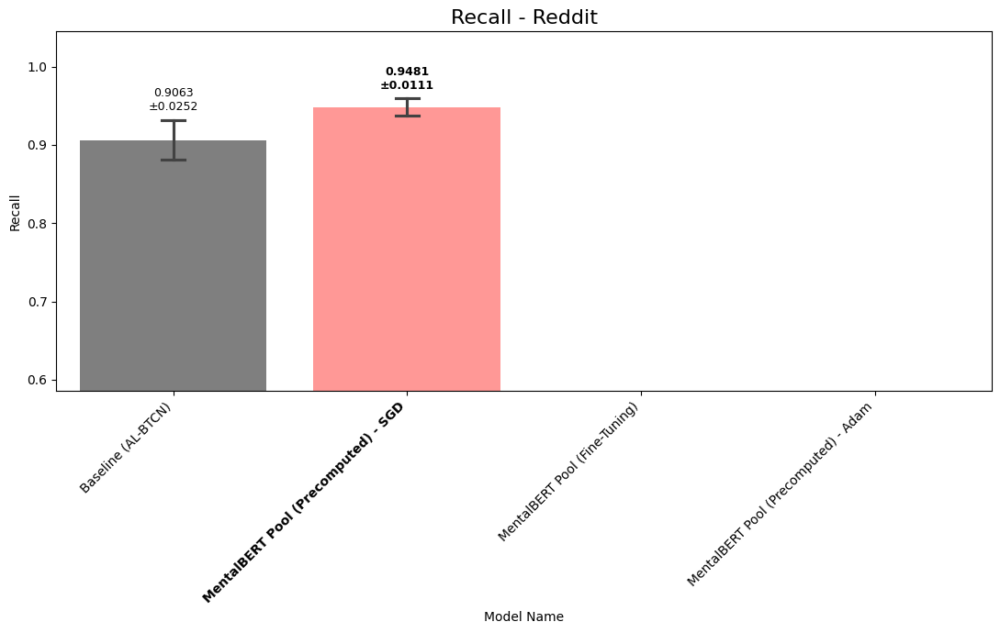

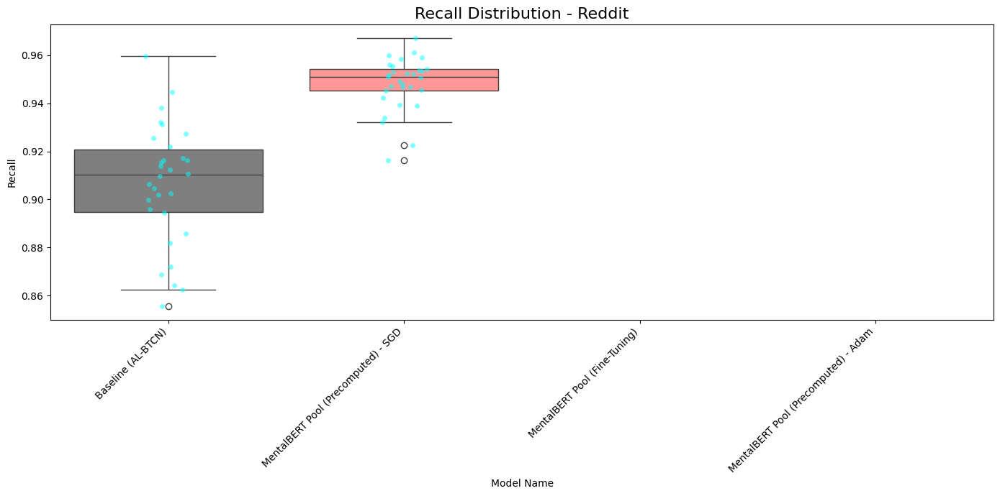

--- Twitter ---


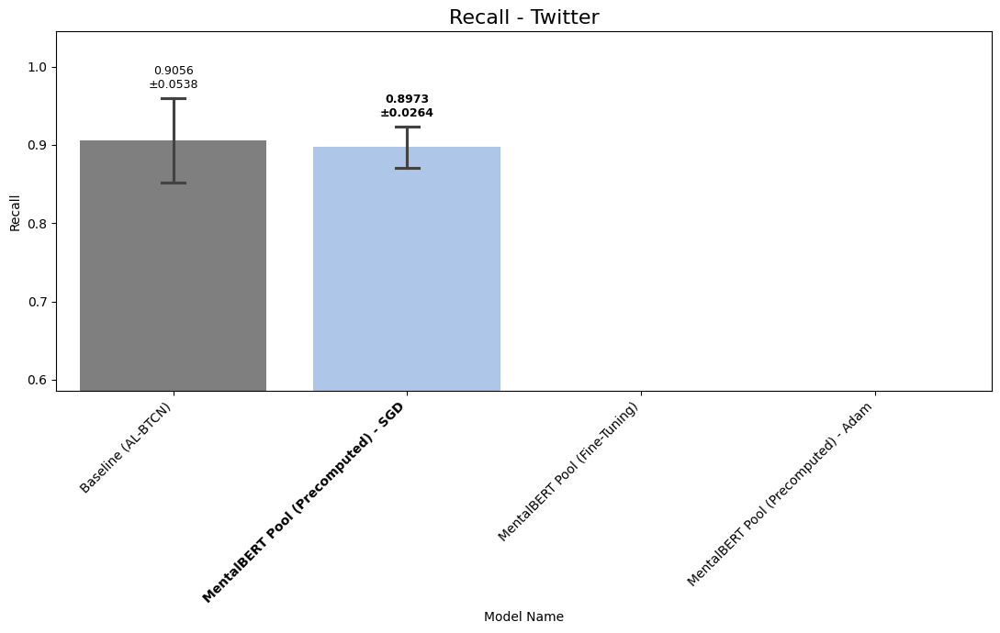

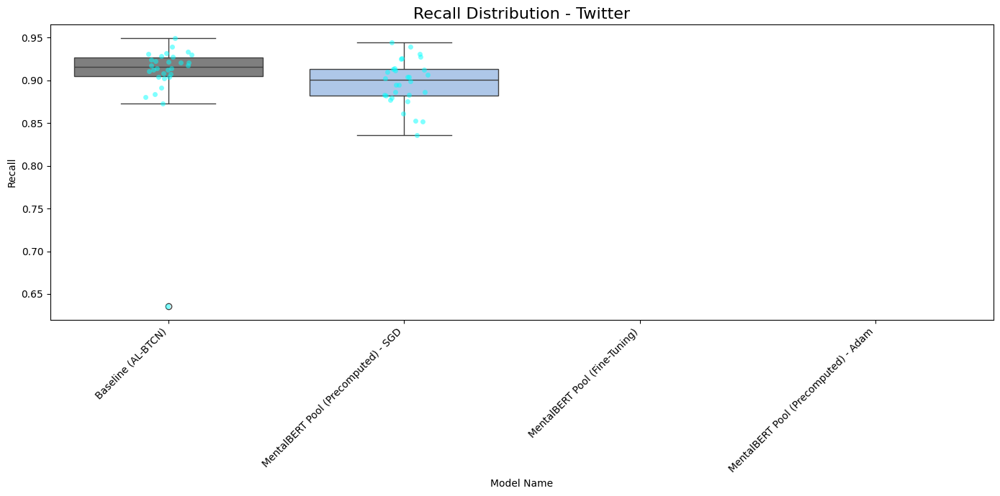

--- RedditSNS ---


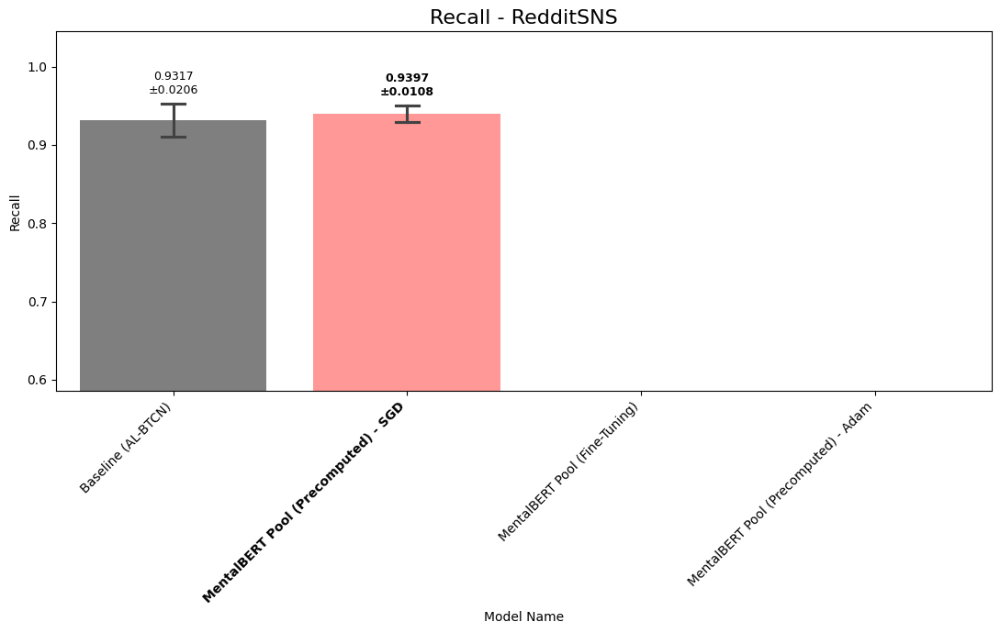

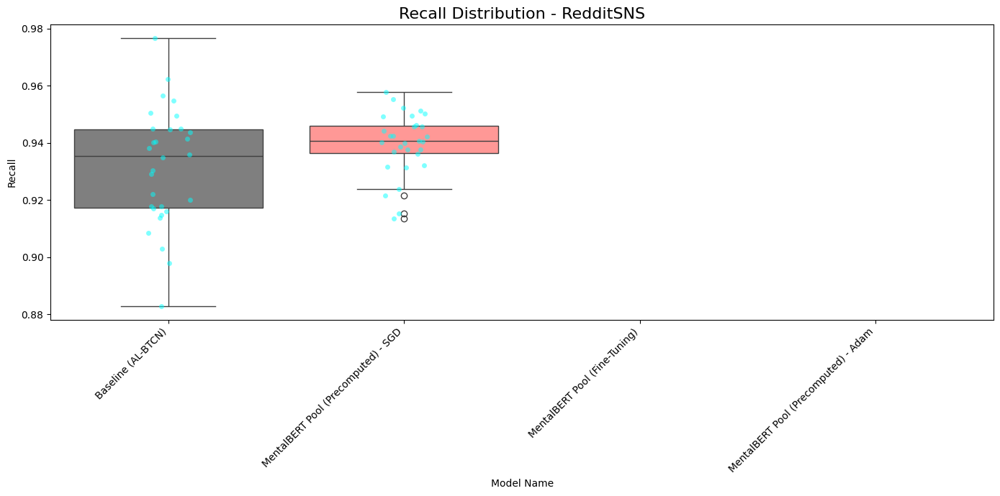

--- Twitter2 ---


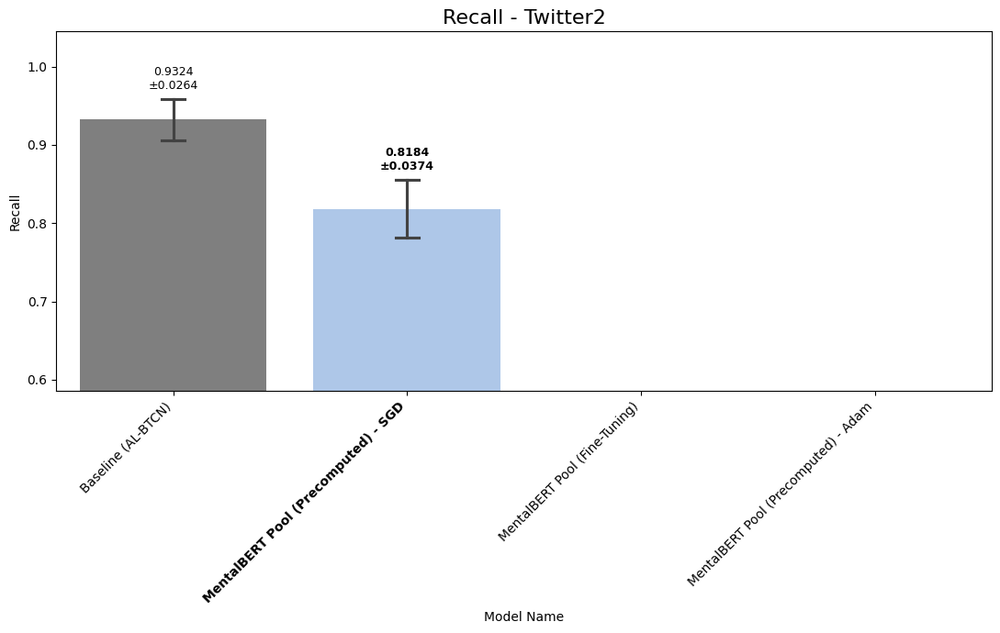

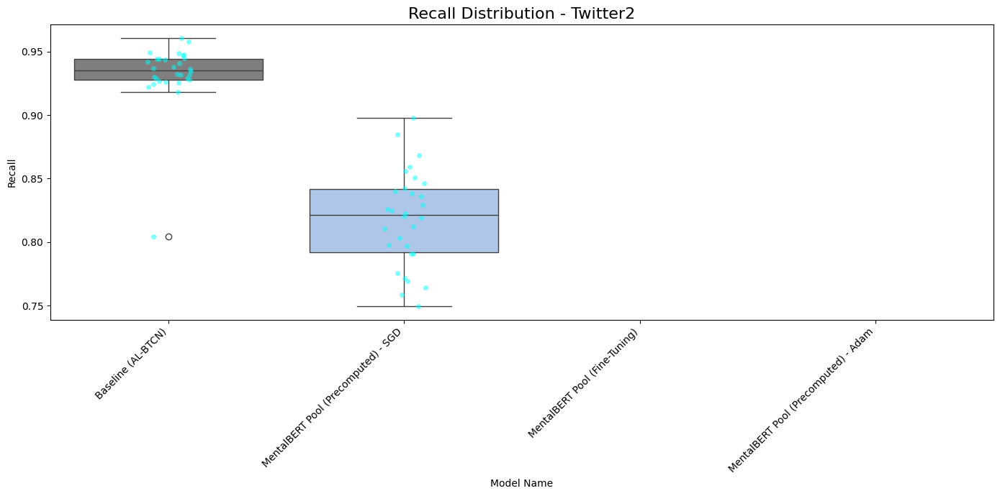

=== F1-Score ===
--- Reddit ---


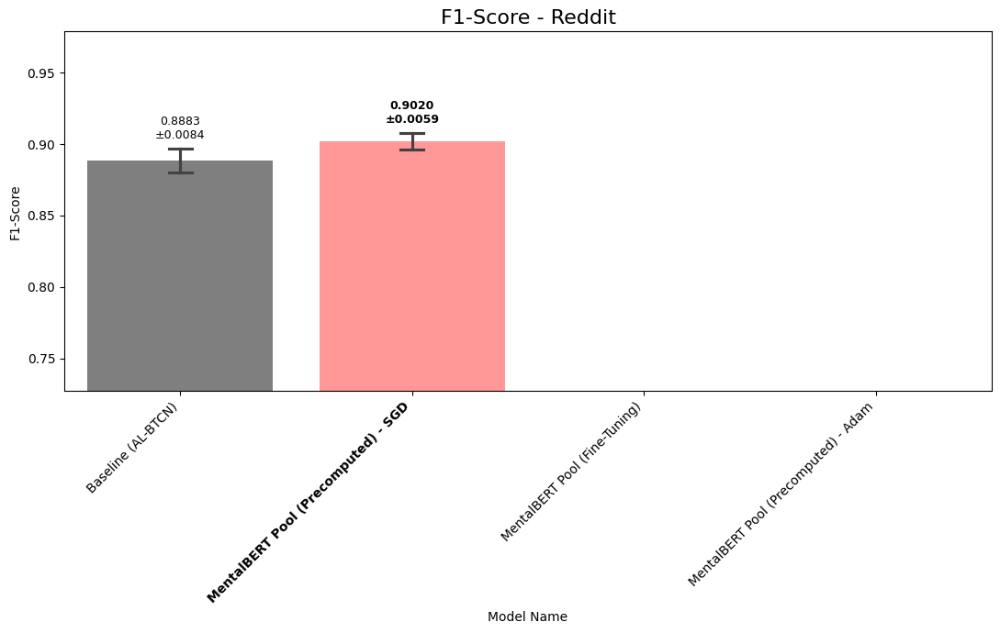

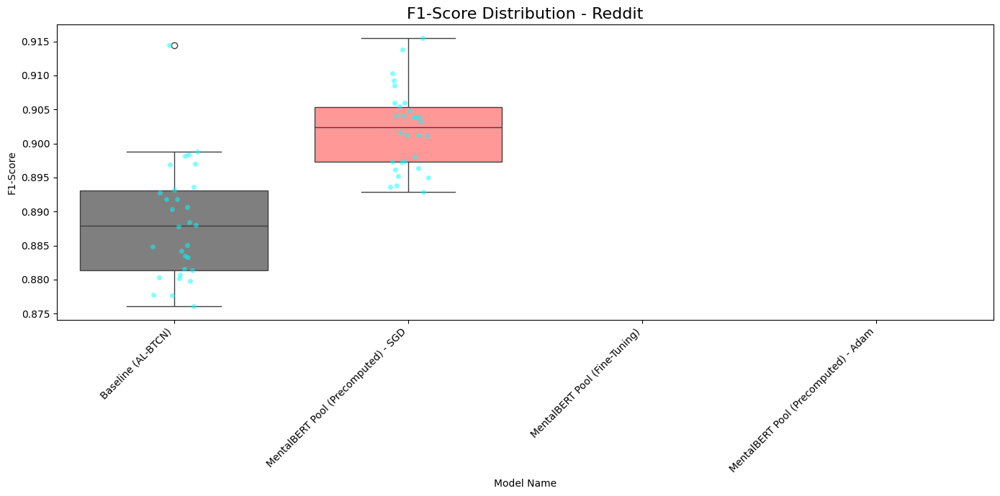

--- Twitter ---


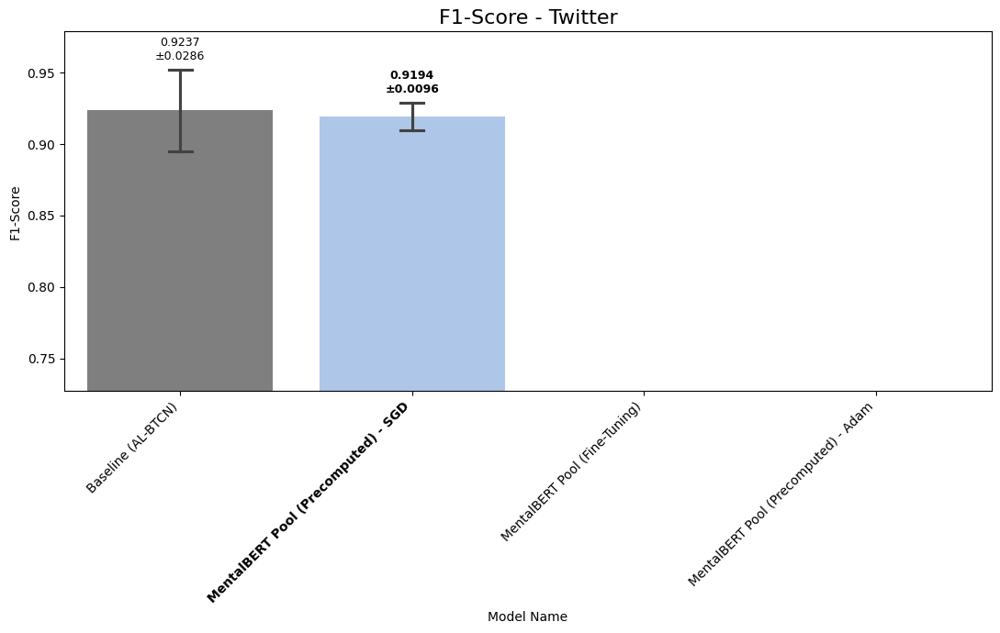

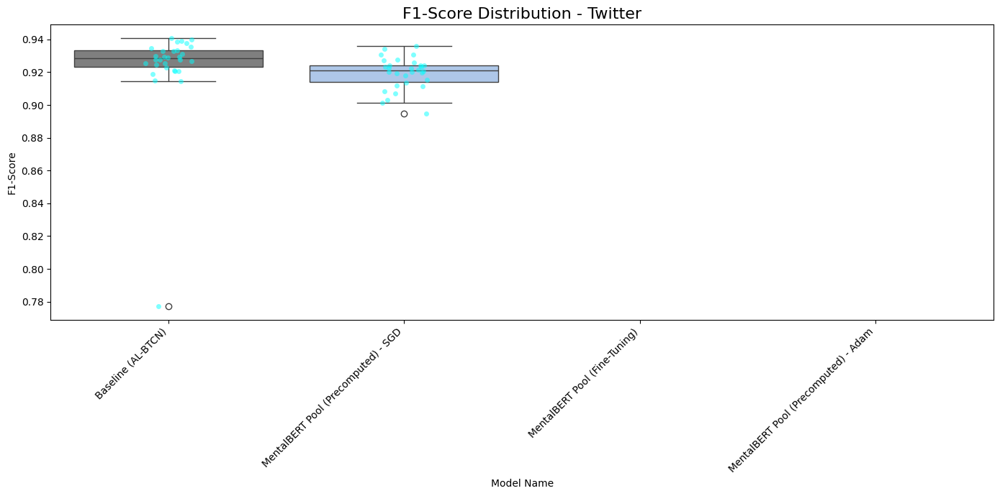

--- RedditSNS ---


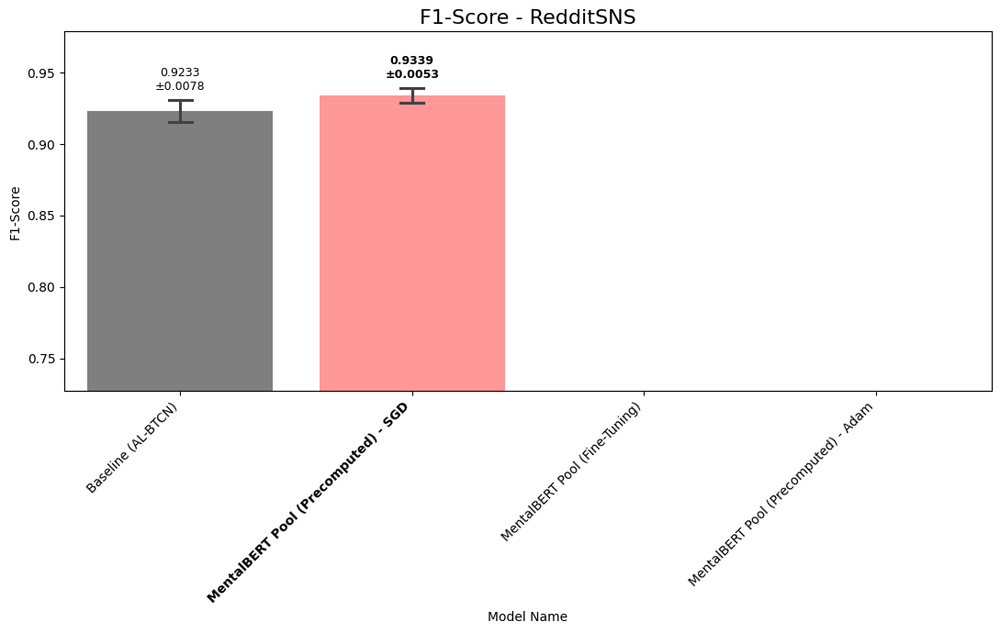

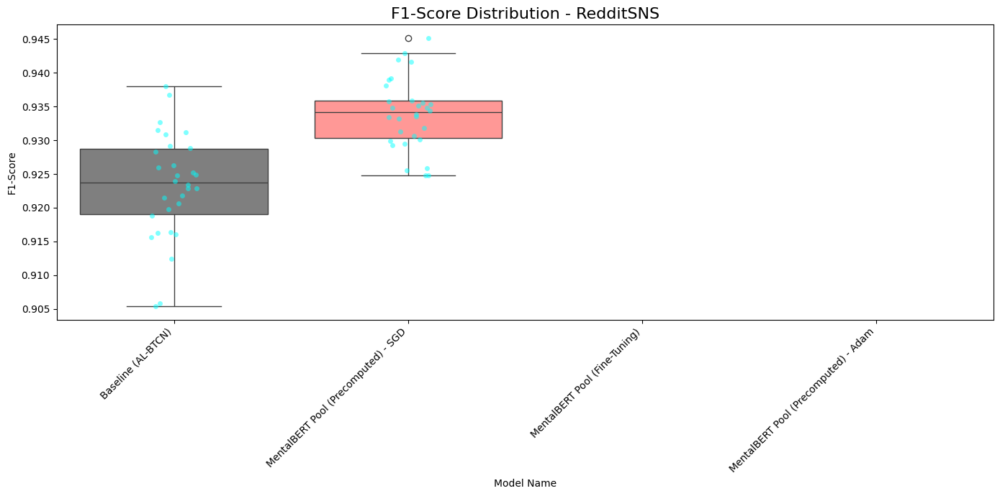

--- Twitter2 ---


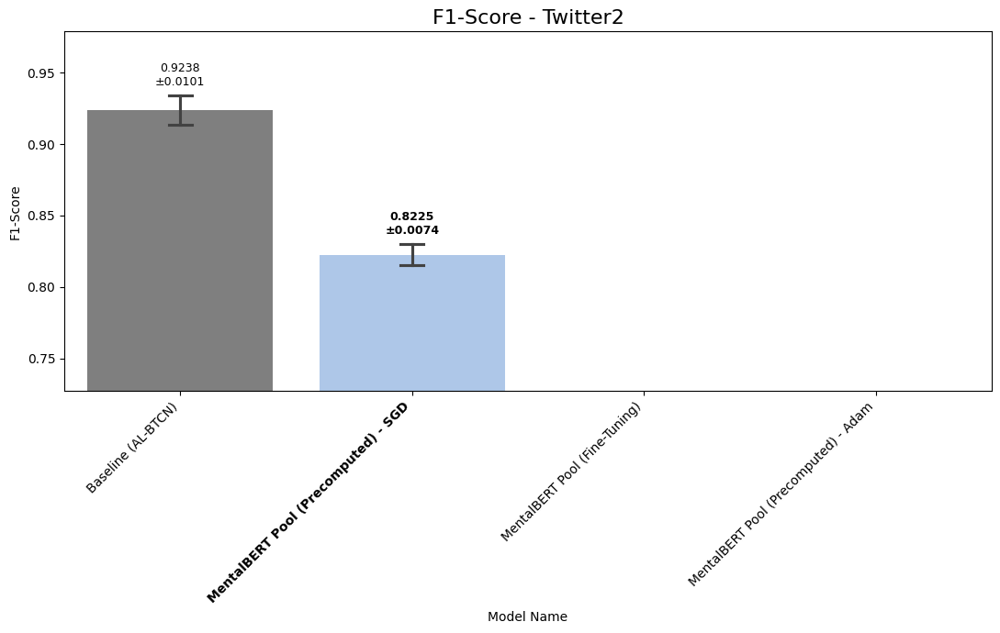

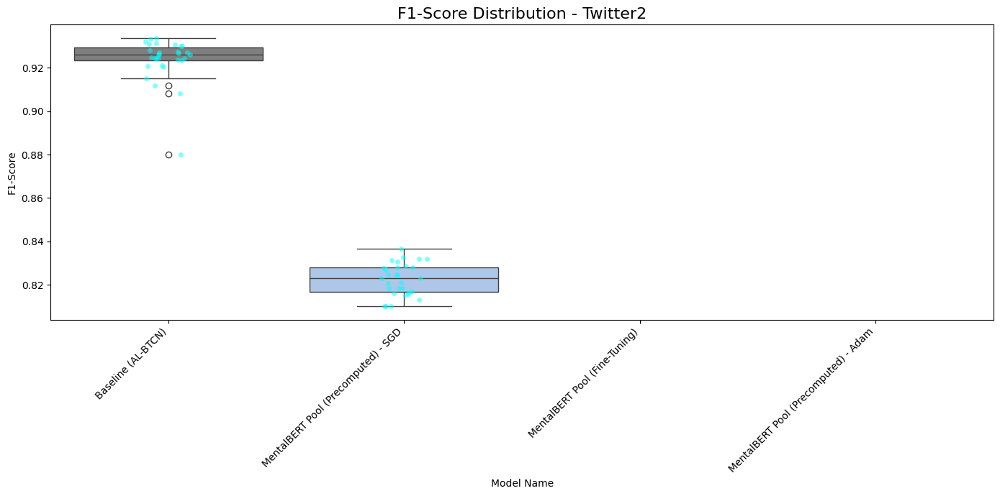

=== ROC-AUC ===
--- Reddit ---


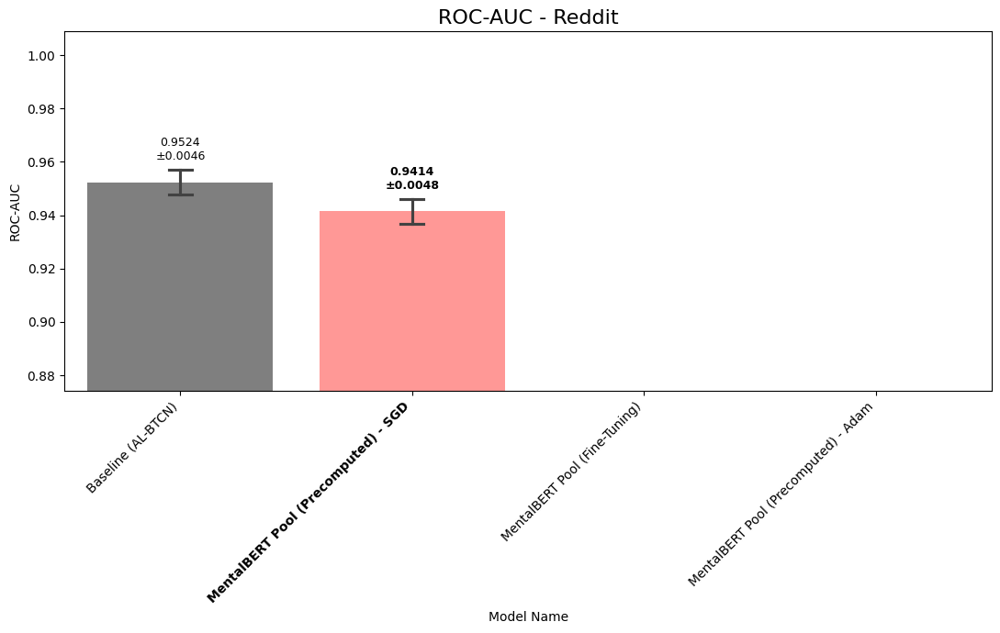

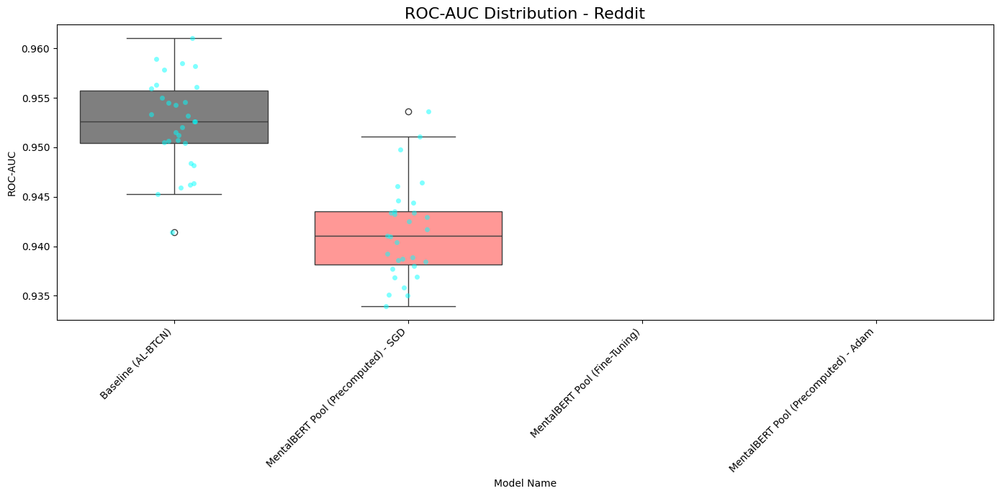

--- Twitter ---


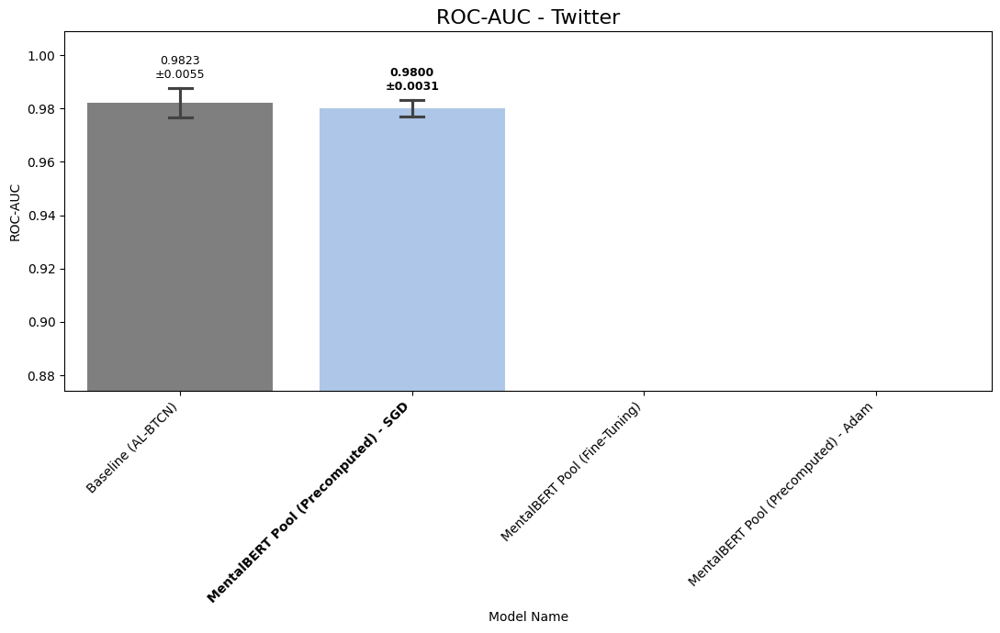

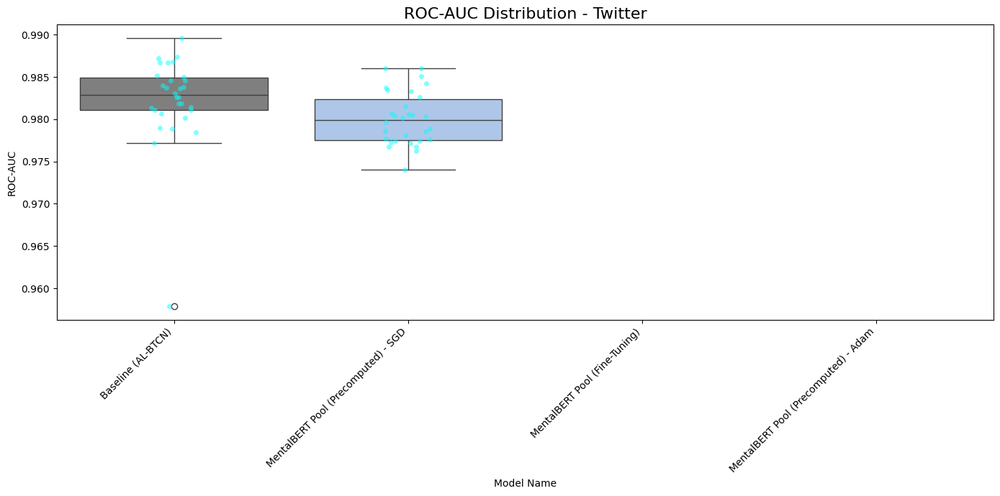

--- RedditSNS ---


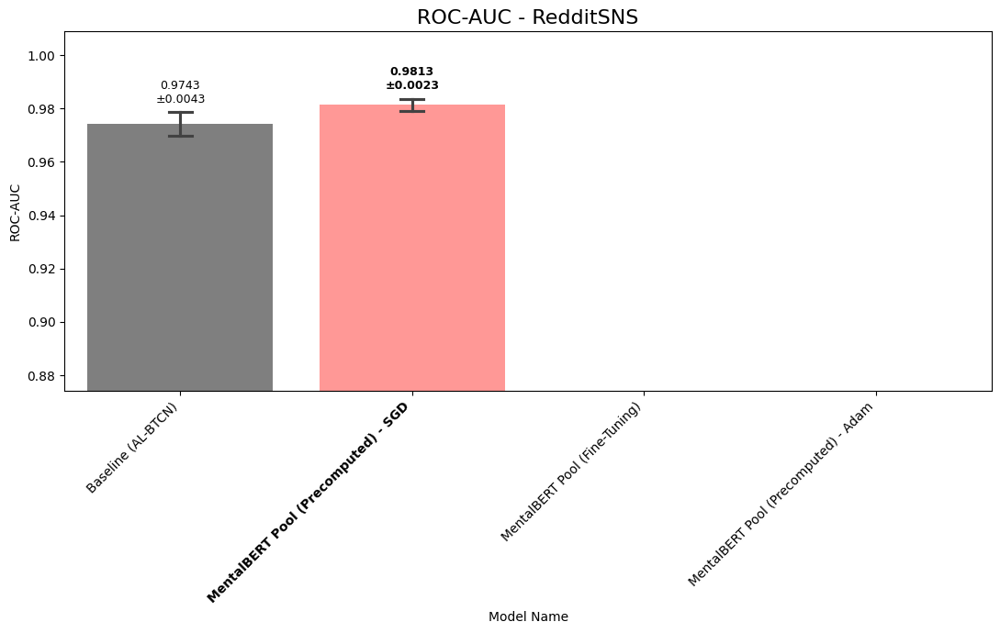

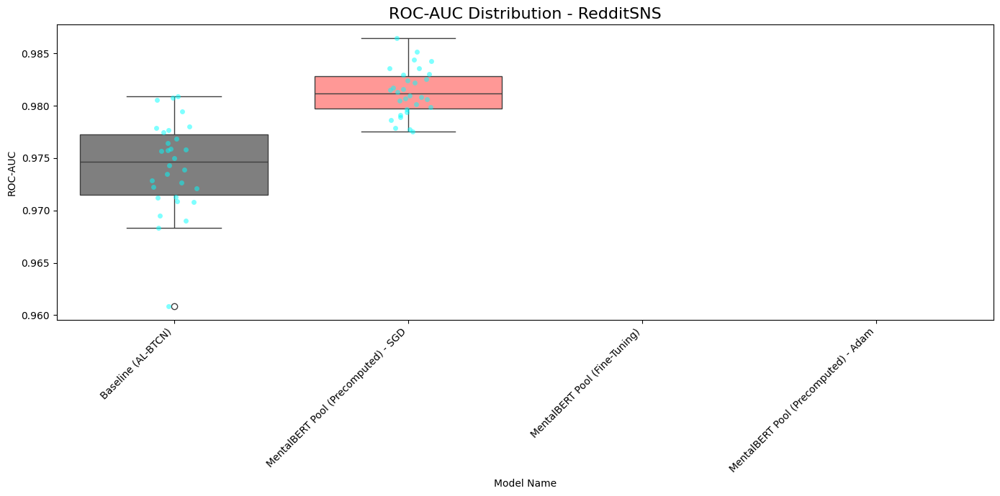

--- Twitter2 ---


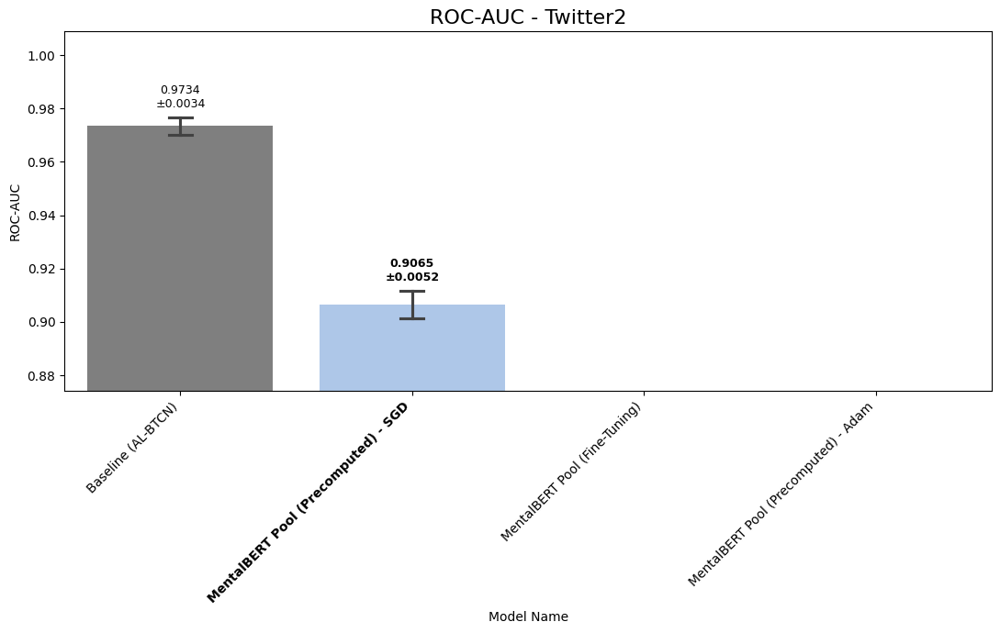

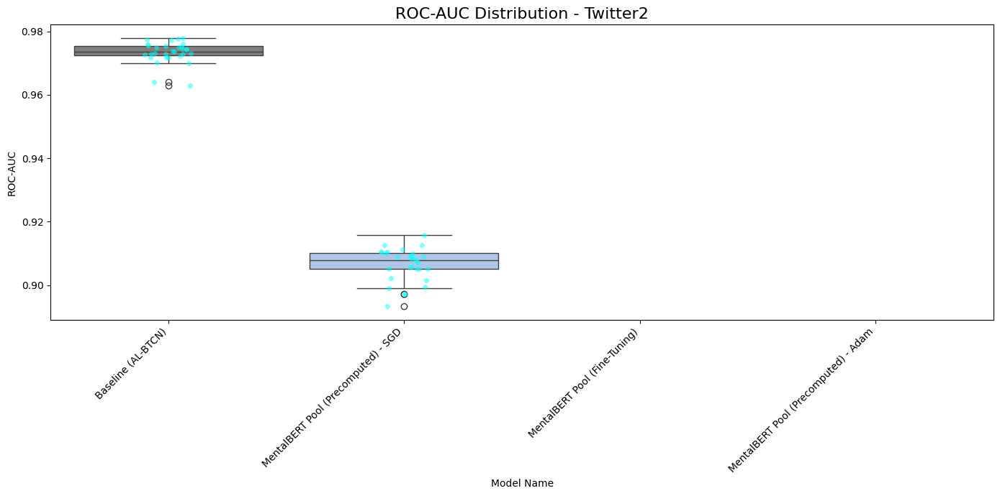

=== Training Time (s) ===
--- Reddit ---


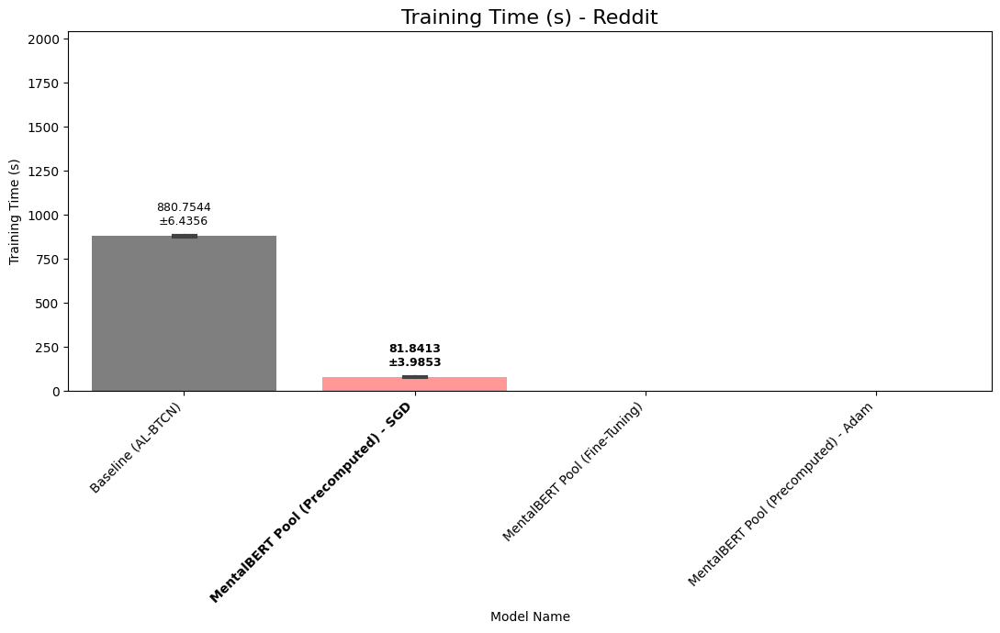

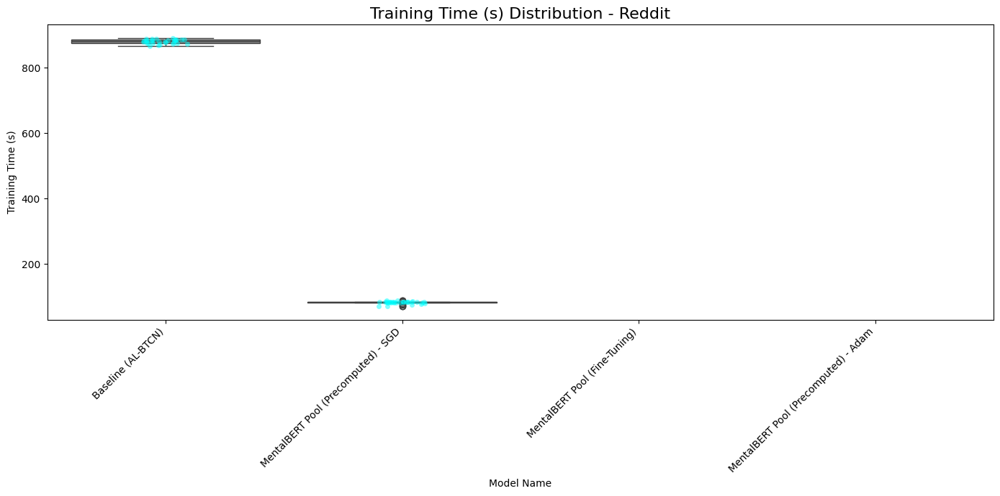

--- Twitter ---


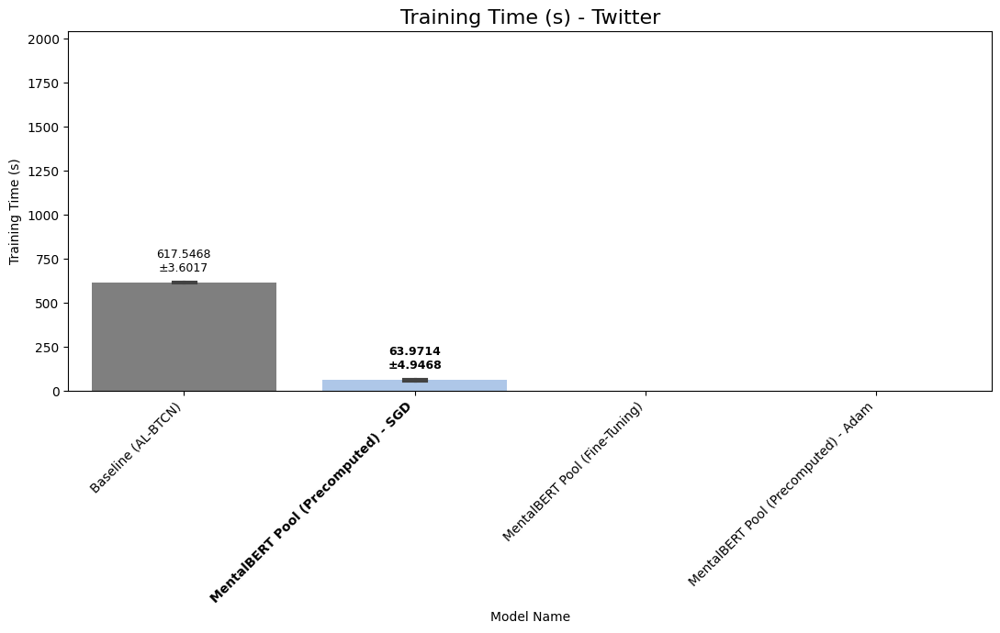

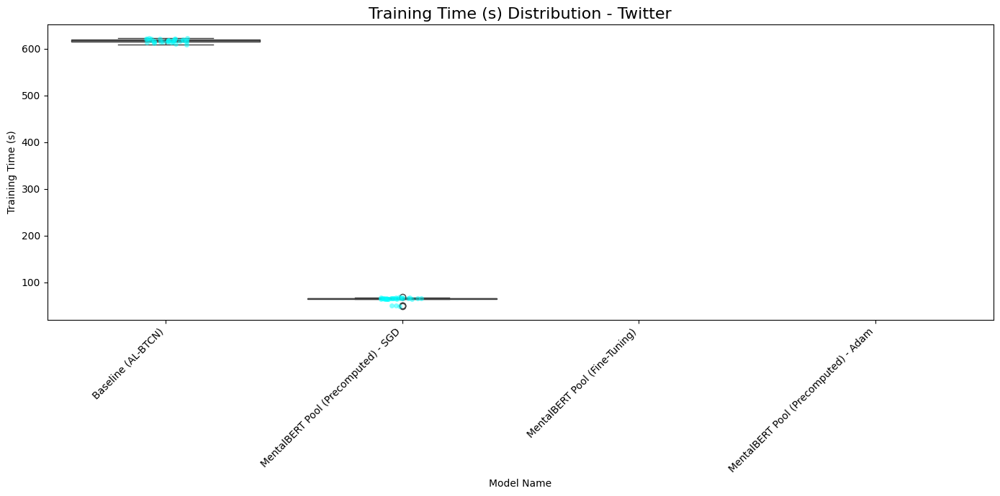

--- RedditSNS ---


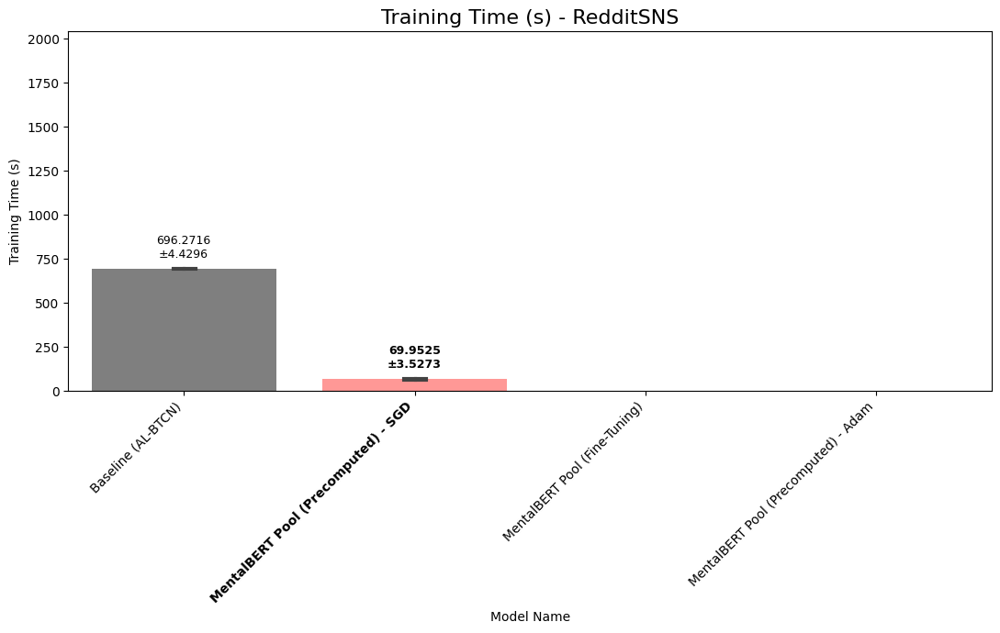

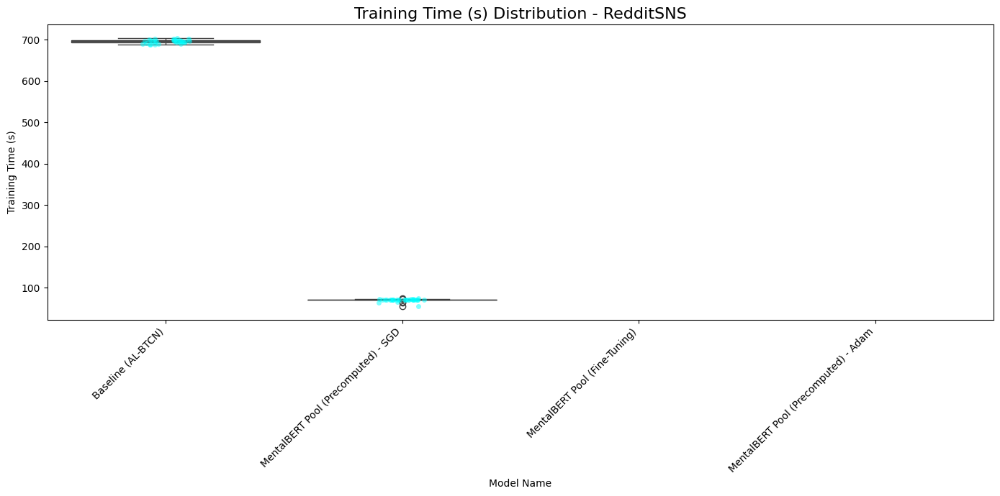

--- Twitter2 ---


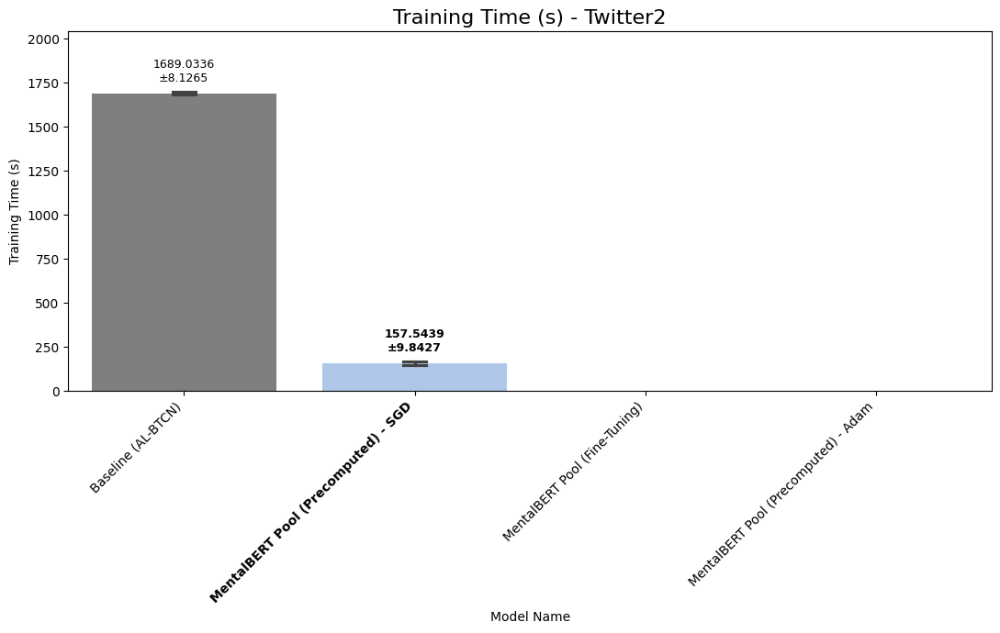

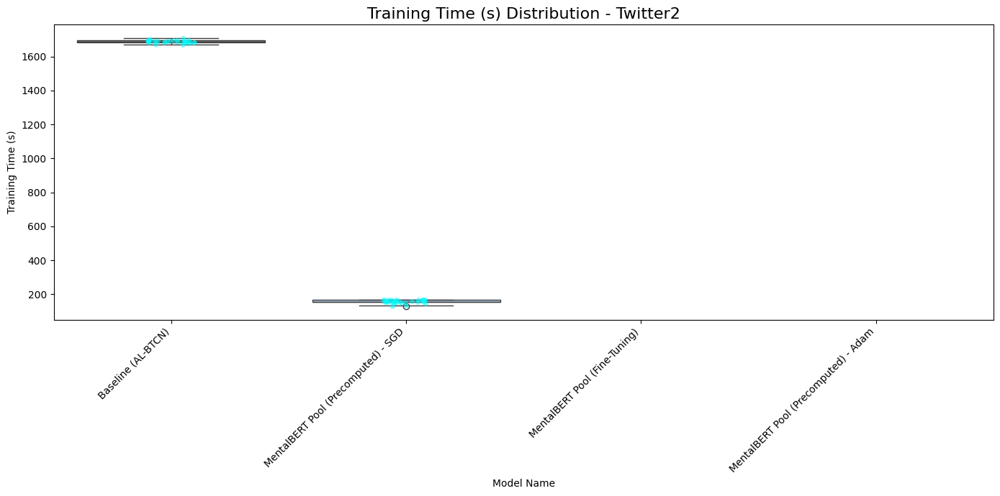

=== Max GPU Memory (MB) ===
--- Reddit ---


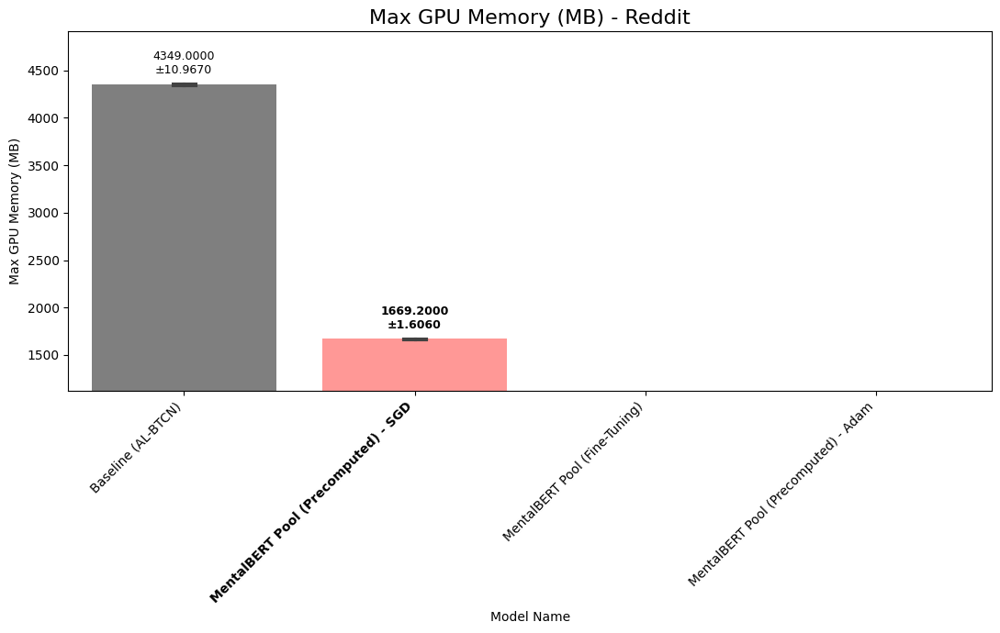

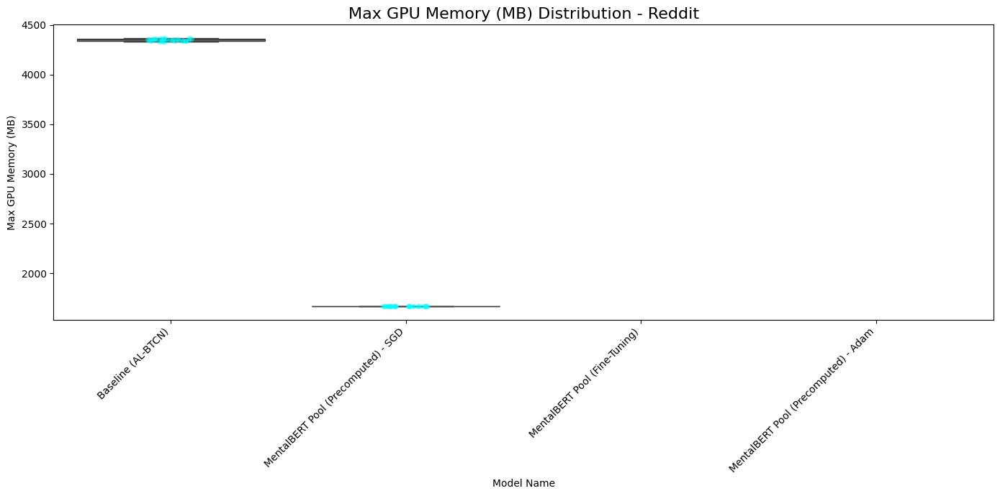

--- Twitter ---


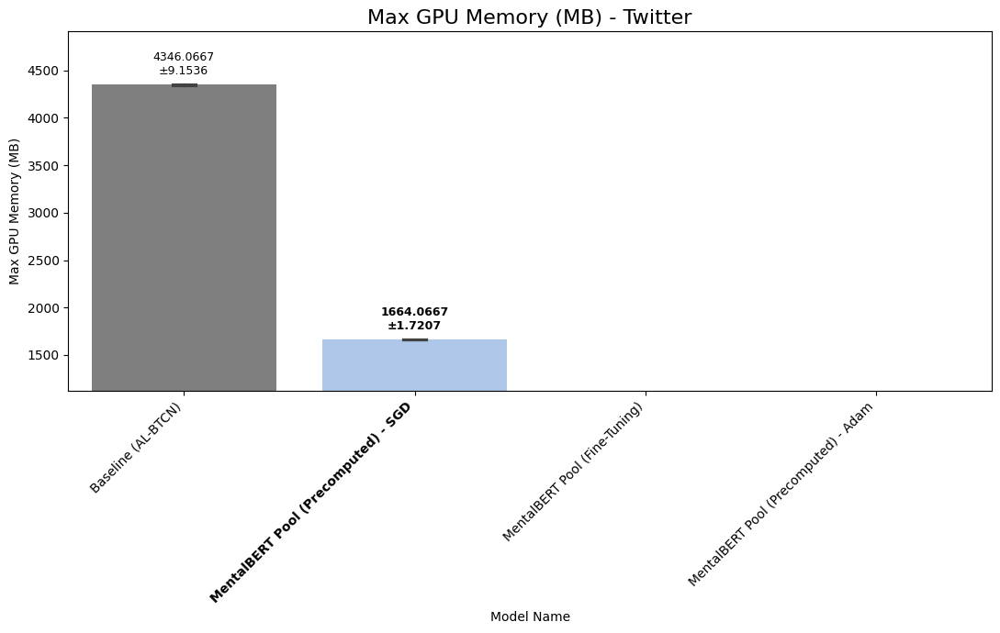

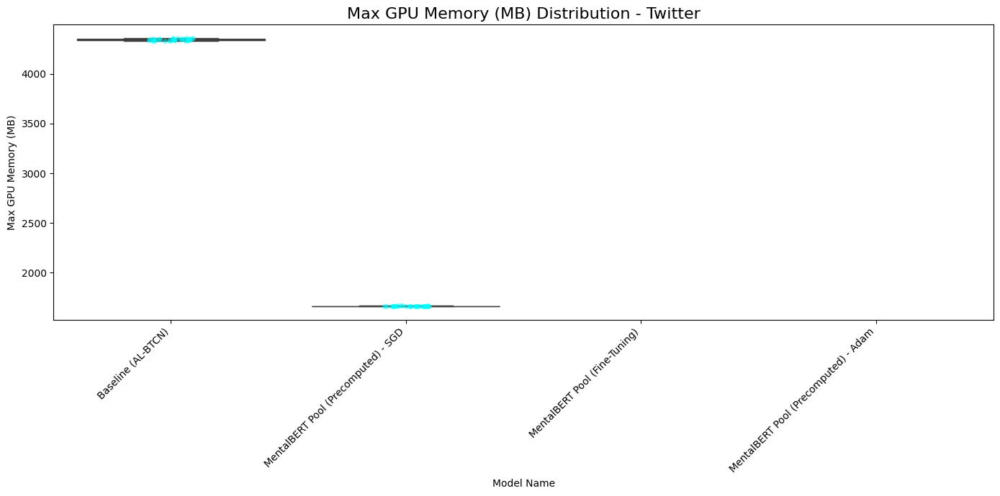

--- RedditSNS ---


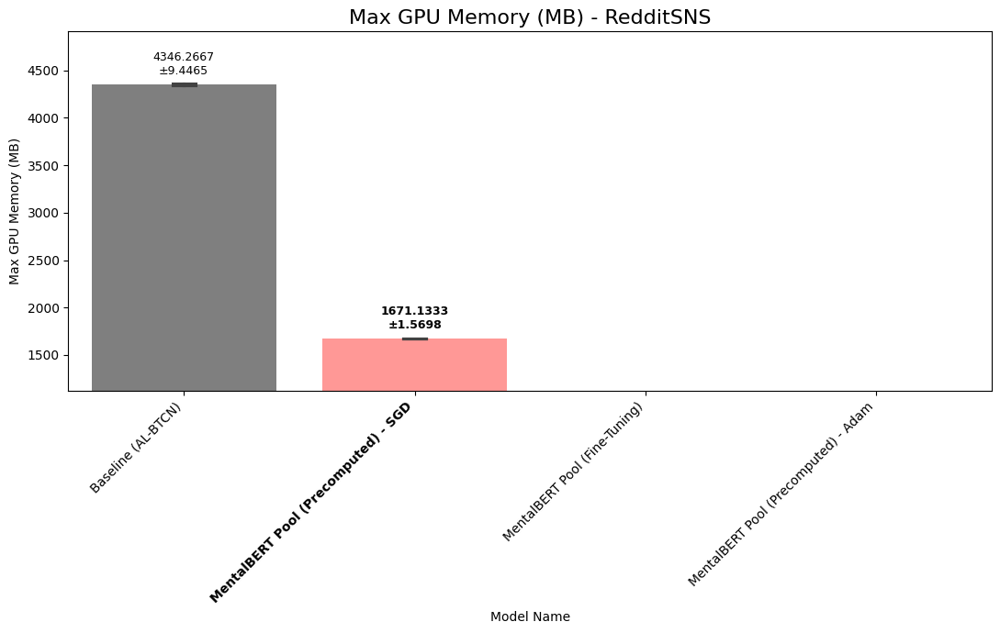

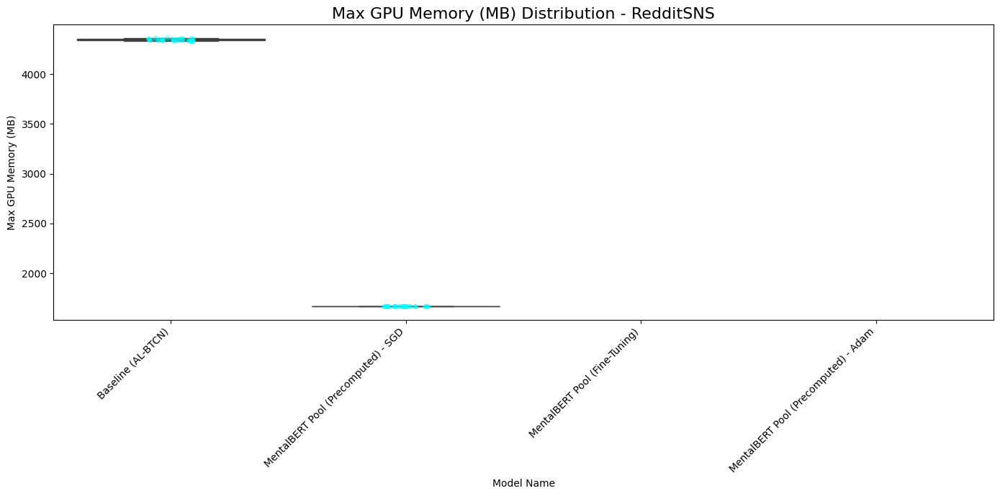

--- Twitter2 ---


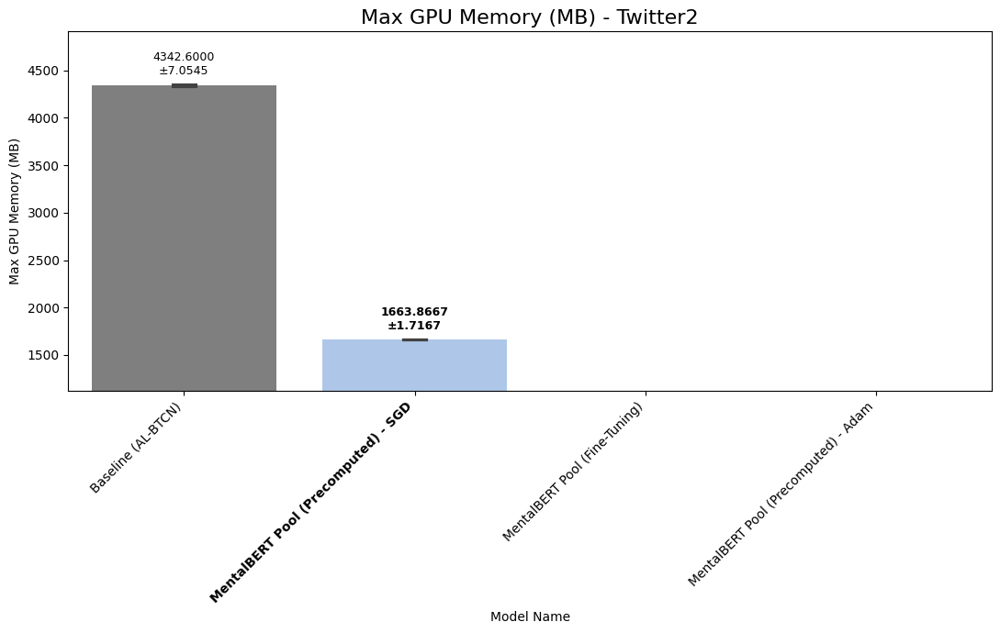

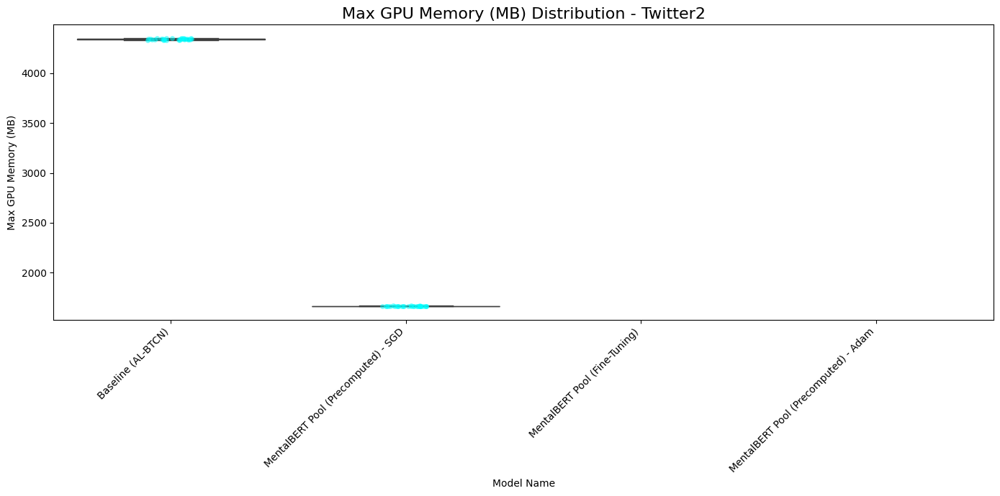

=== Avg GPU Memory (MB) ===
--- Reddit ---


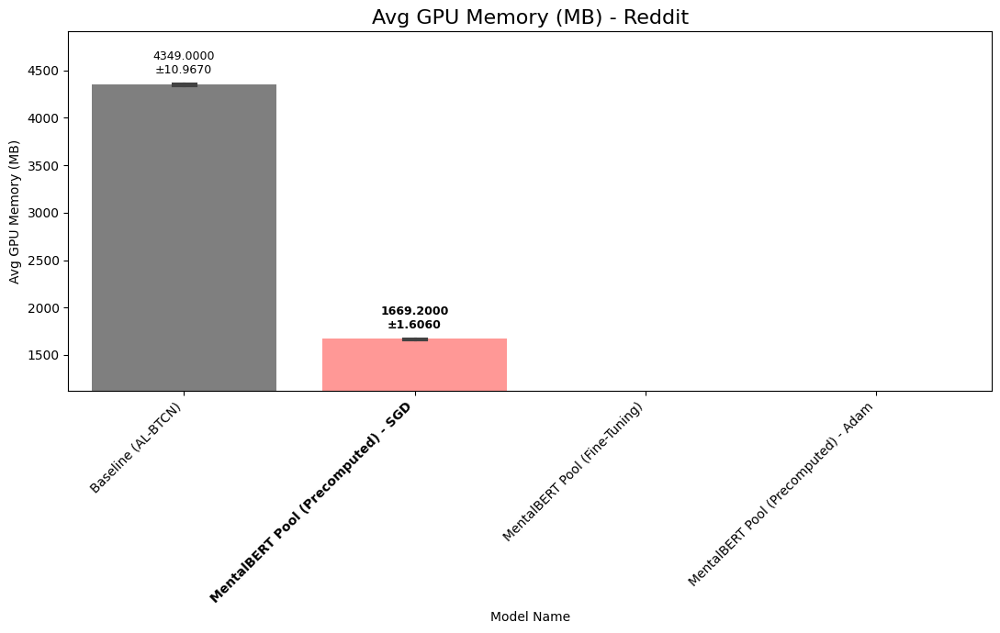

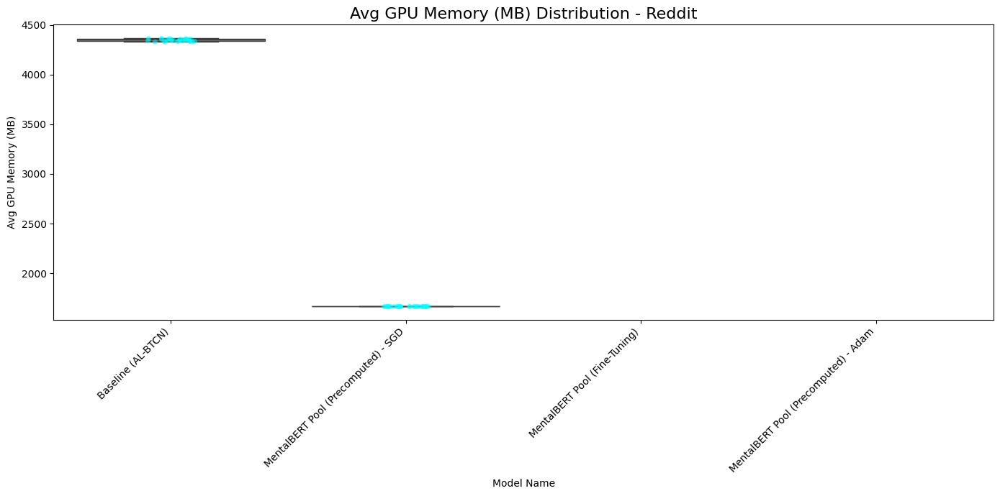

--- Twitter ---


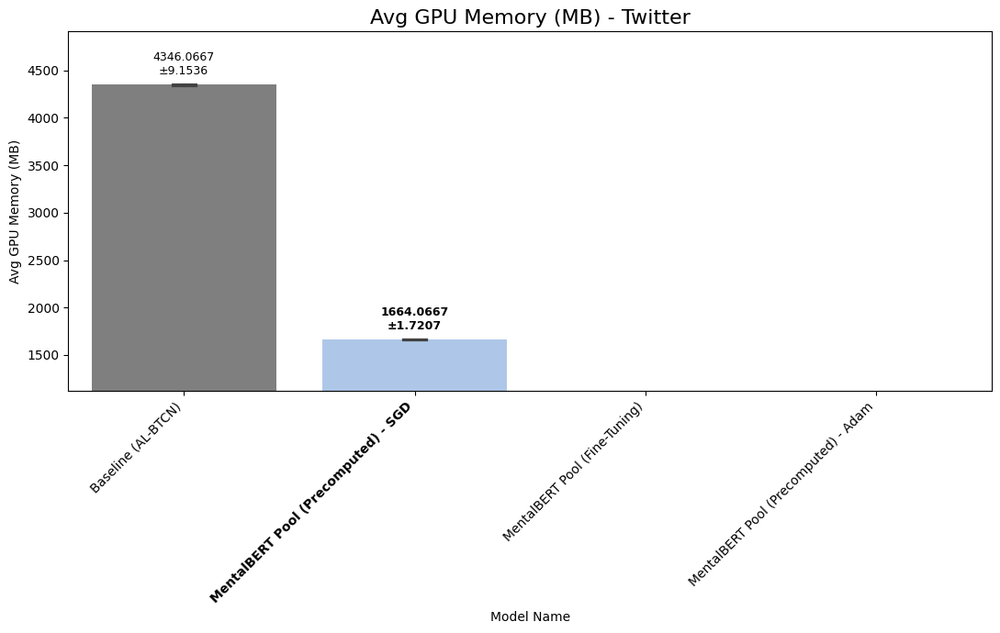

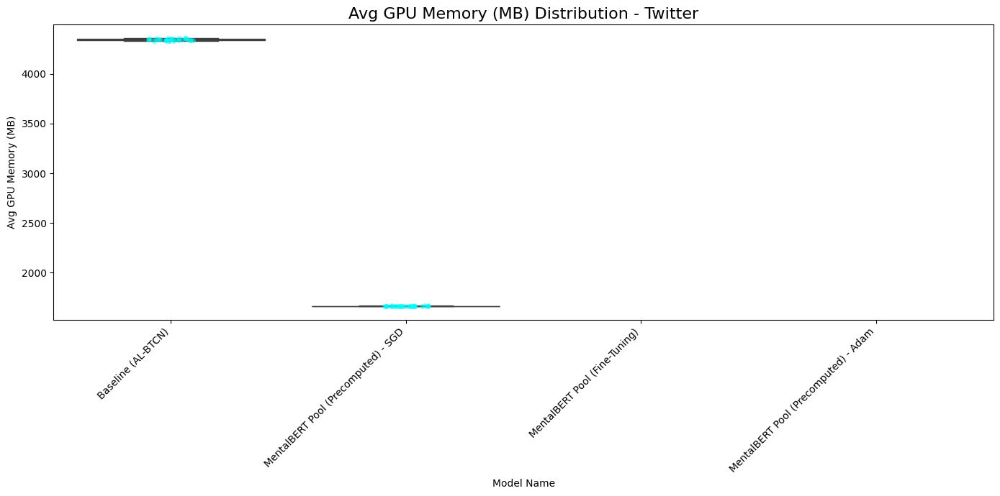

--- RedditSNS ---


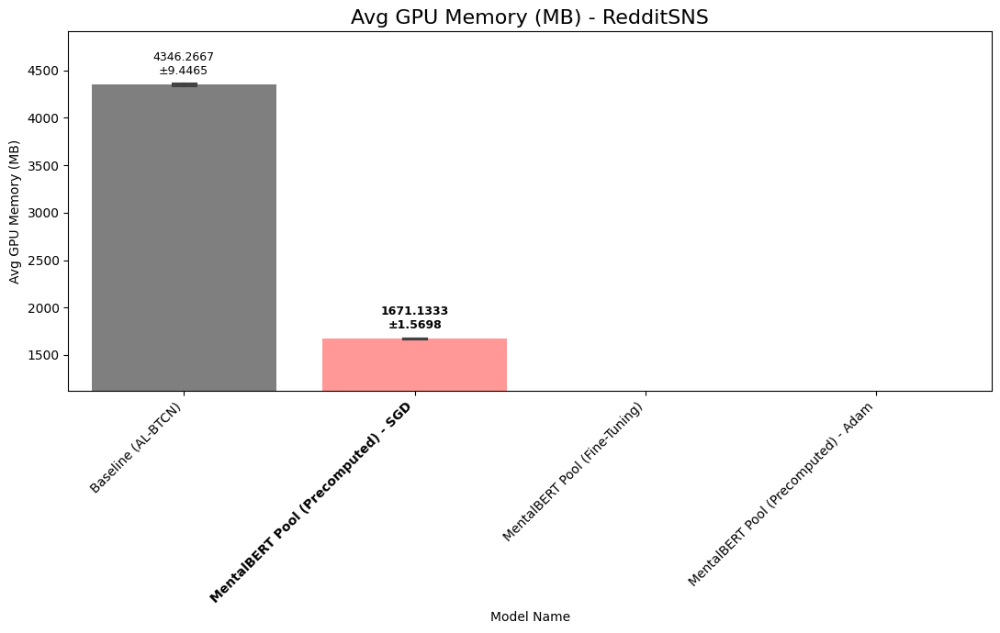

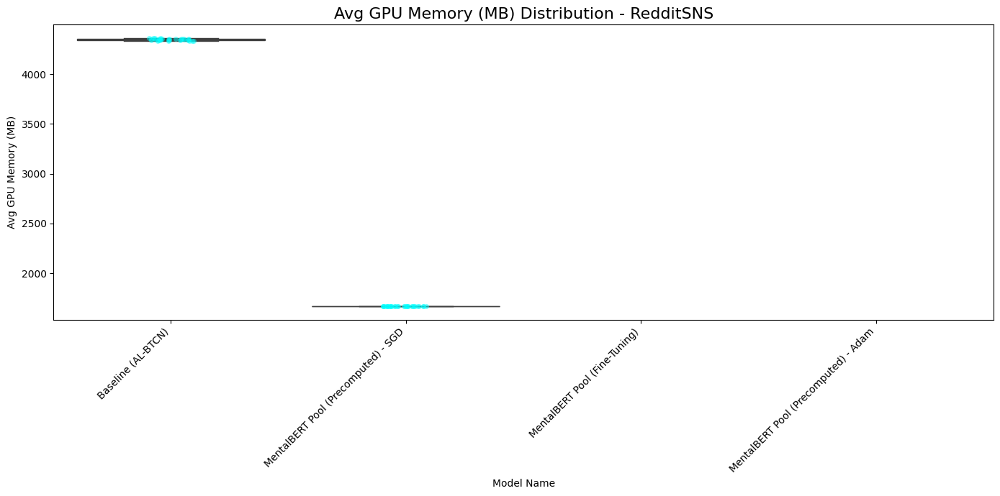

--- Twitter2 ---


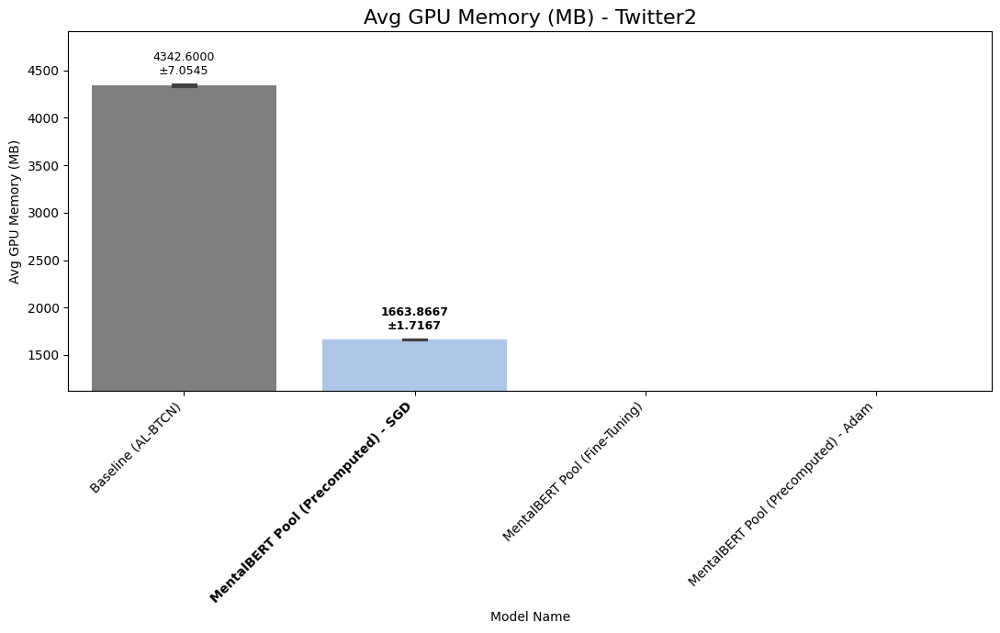

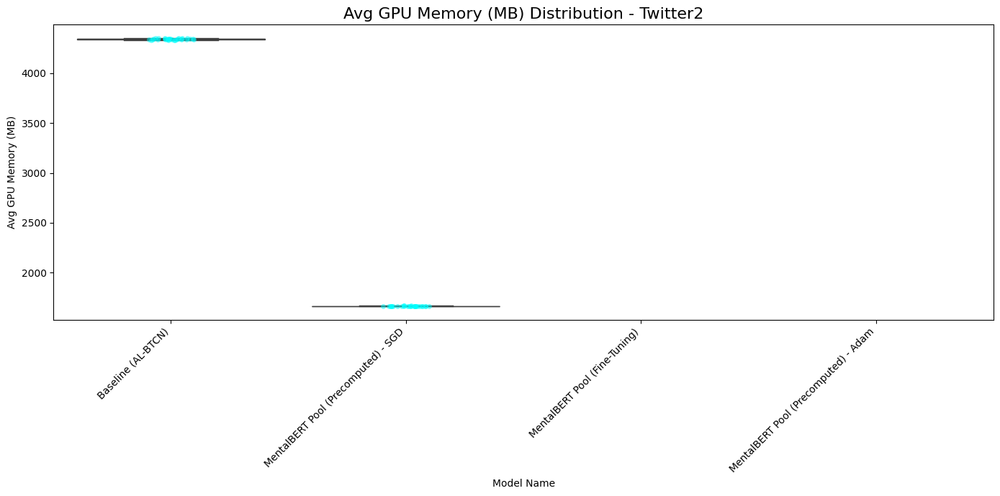

=== Epochs Run ===
--- Reddit ---


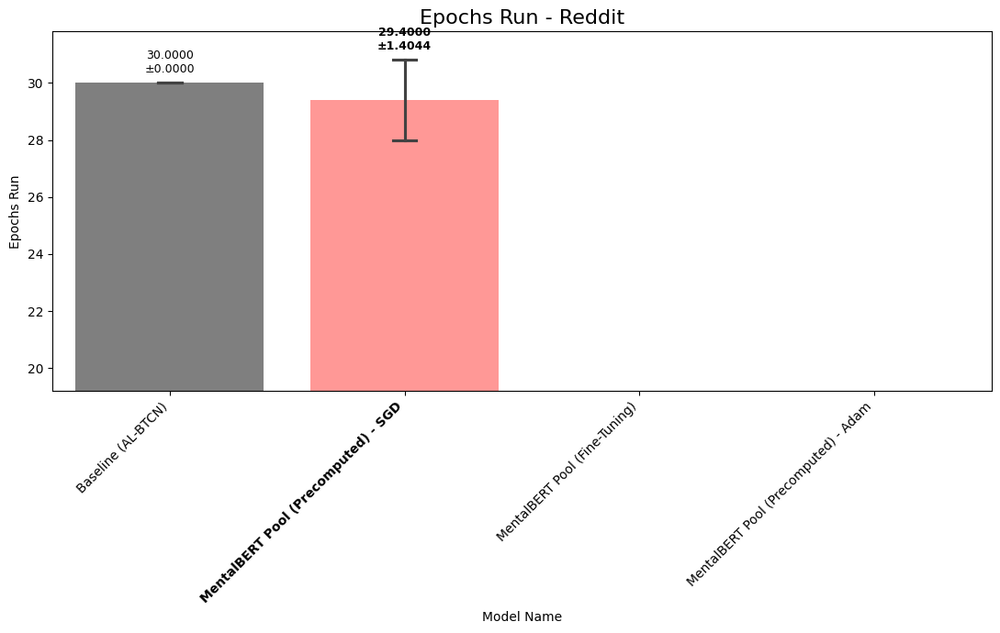

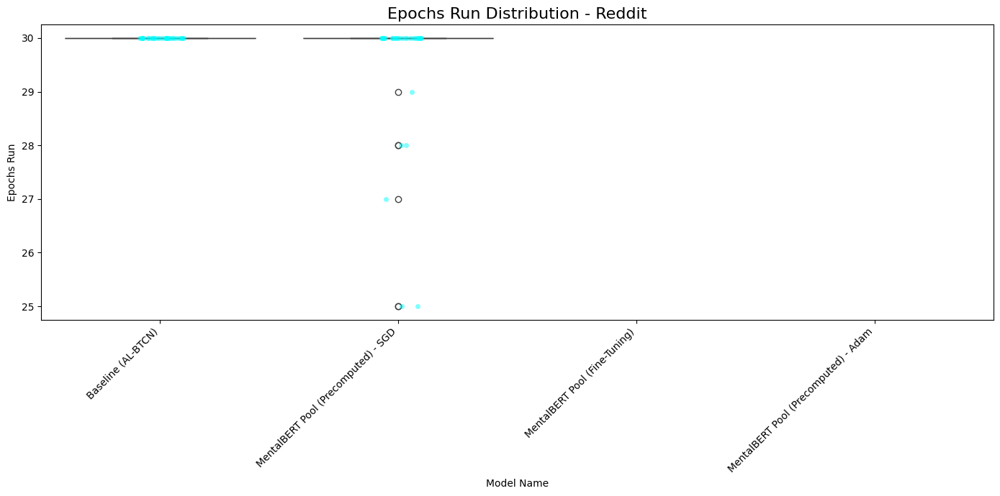

--- Twitter ---


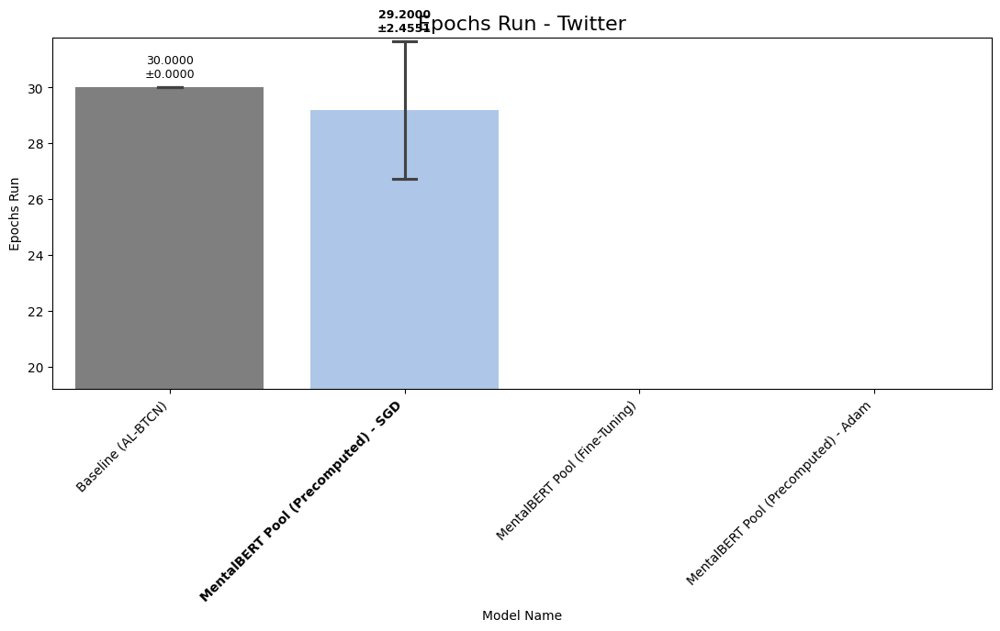

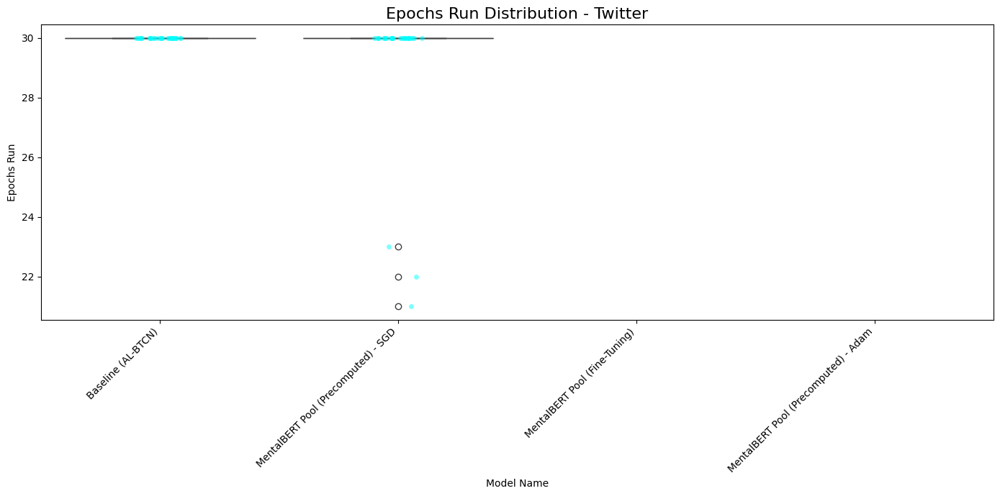

--- RedditSNS ---


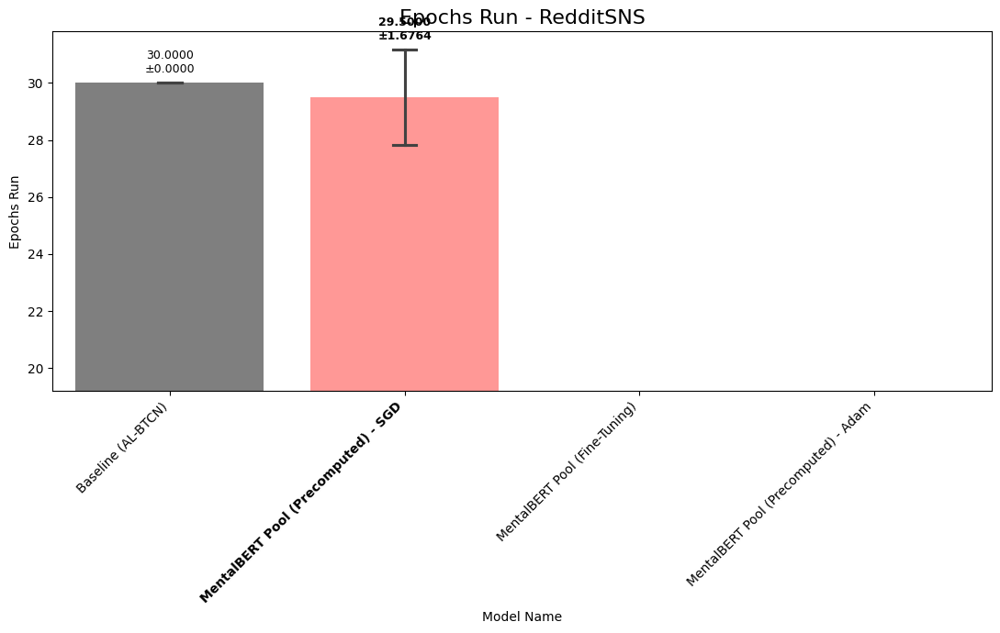

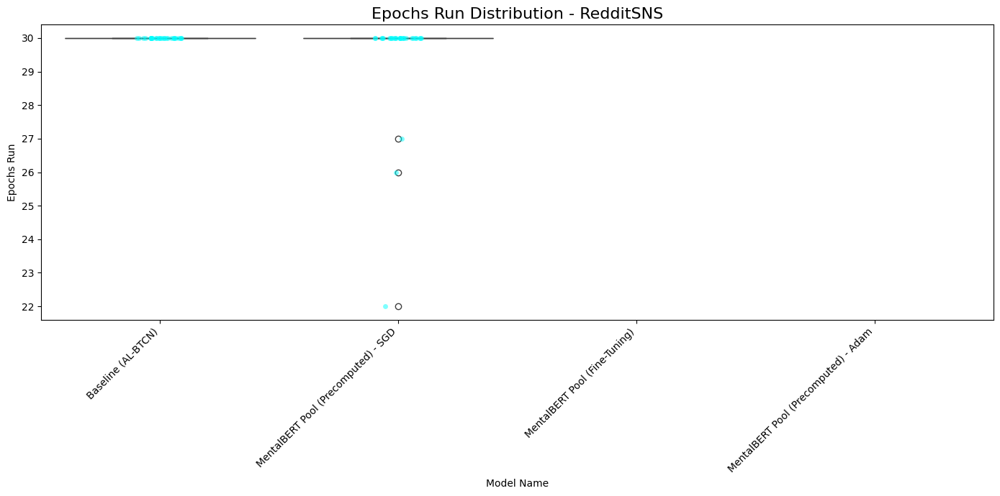

--- Twitter2 ---


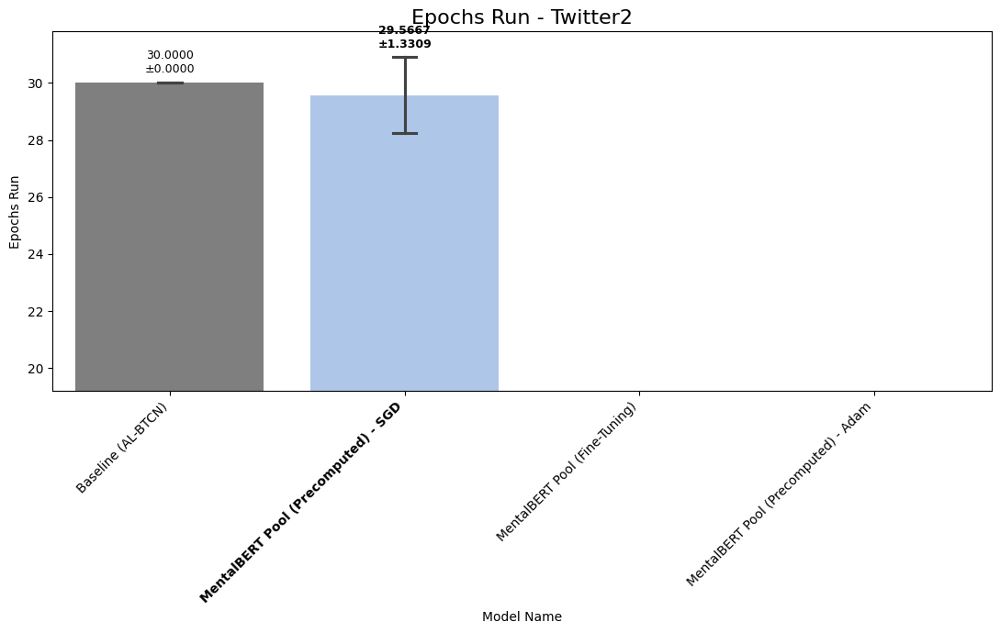

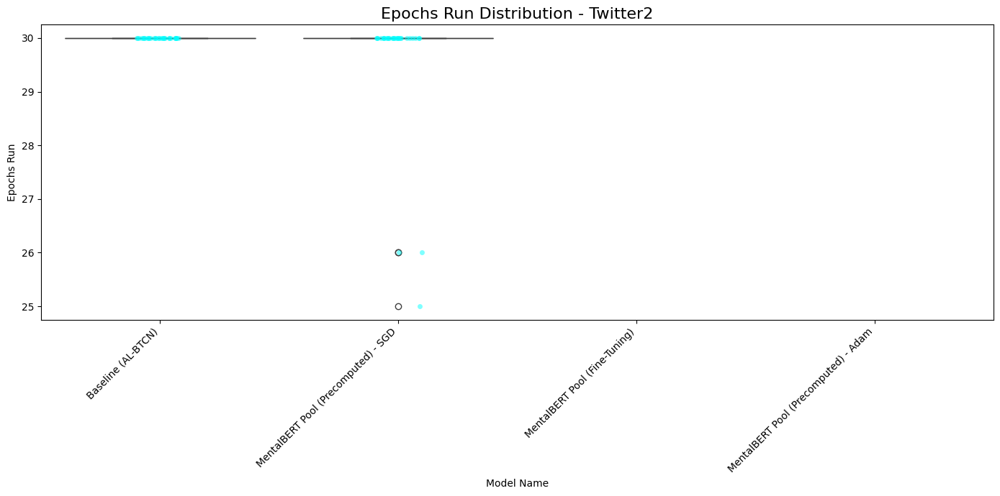

=== Avg Time/Epoch (s) ===
--- Reddit ---


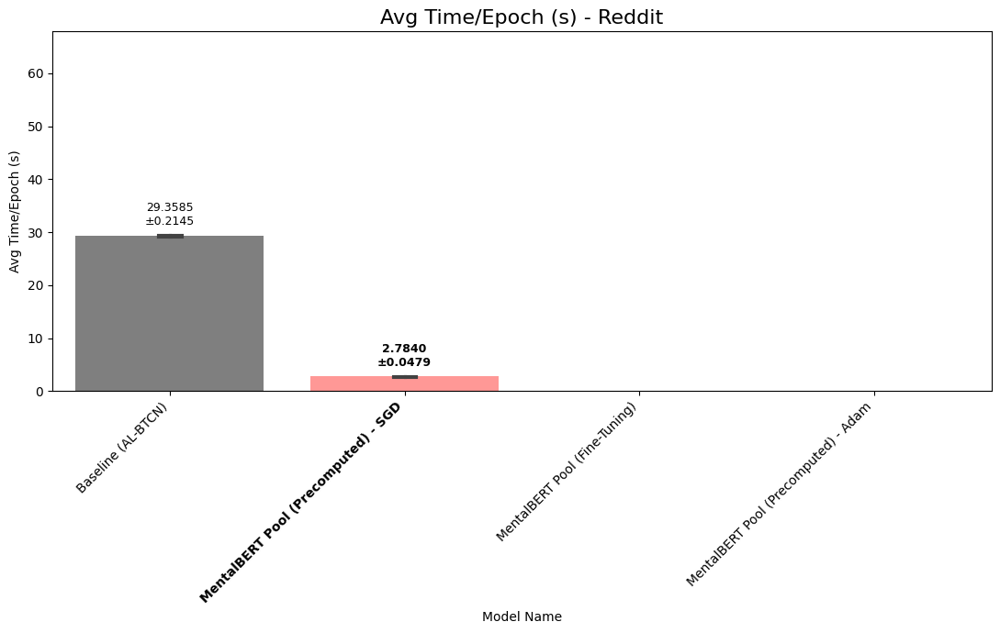

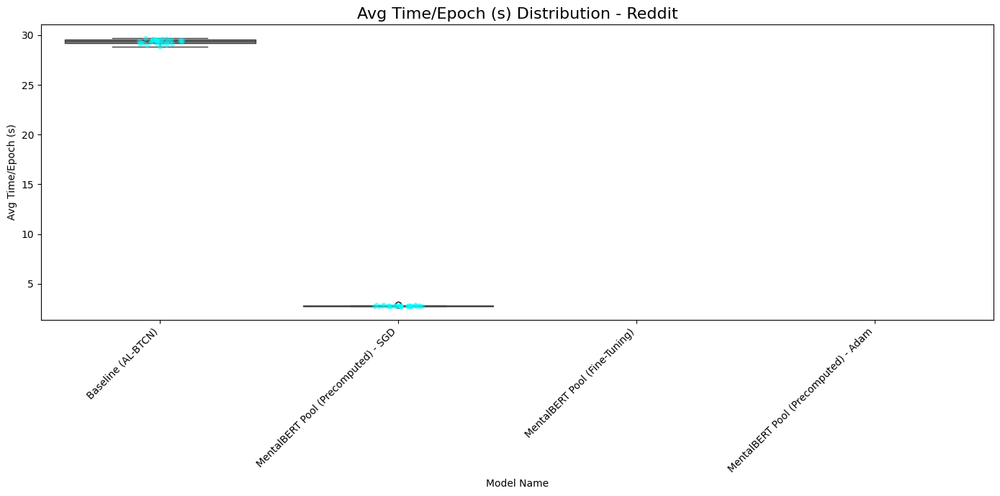

--- Twitter ---


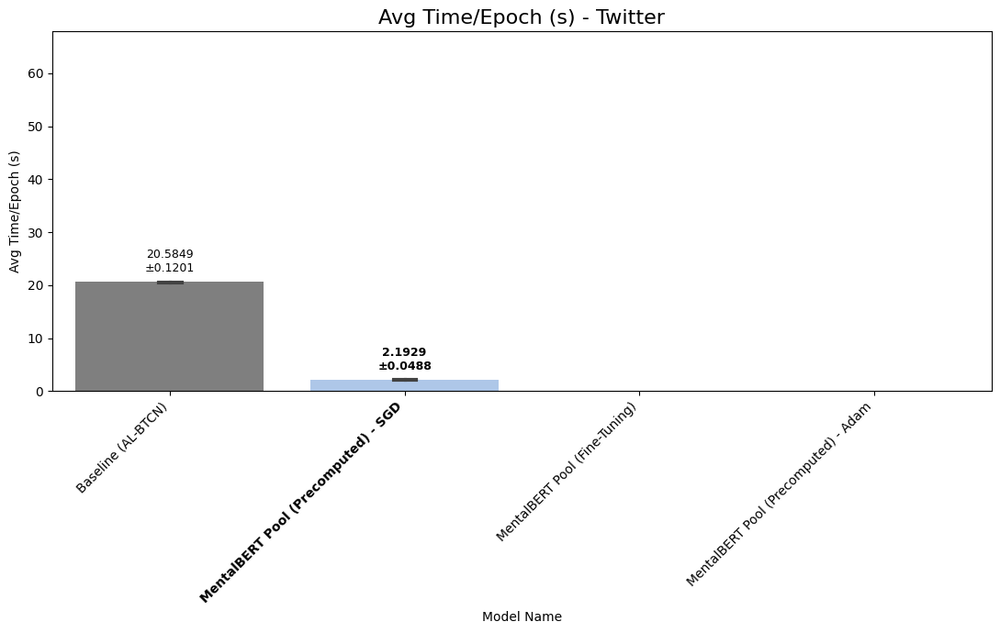

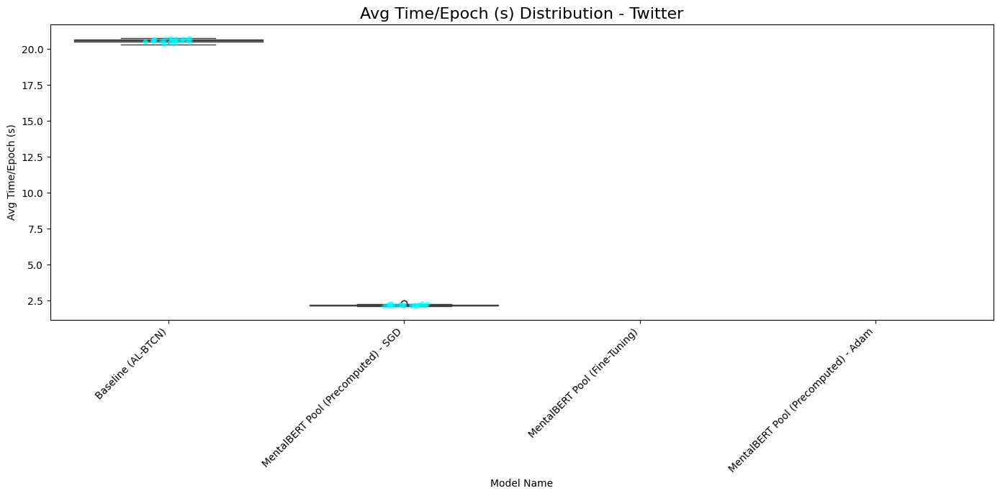

--- RedditSNS ---


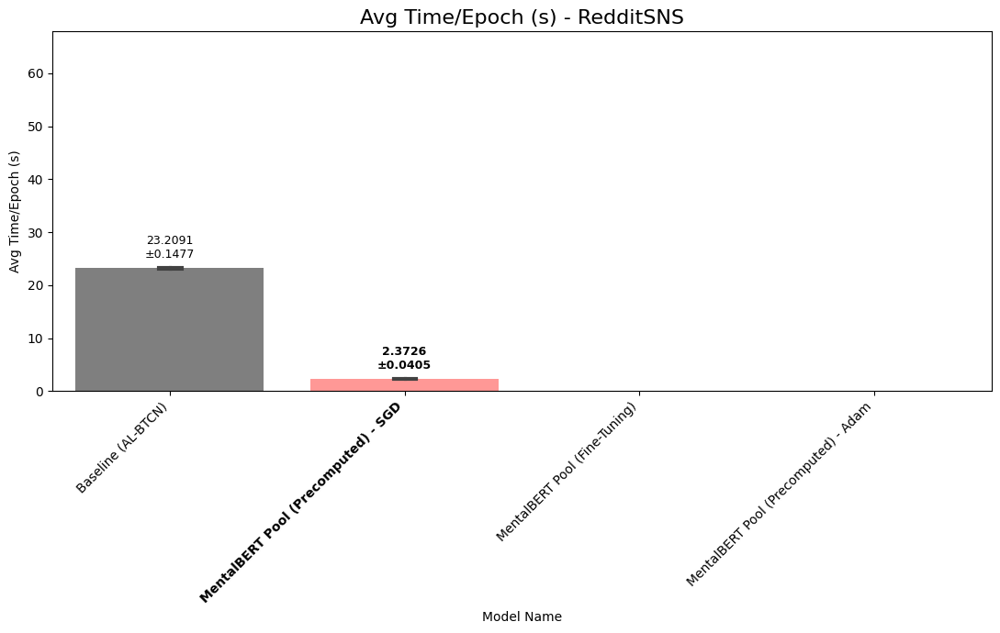

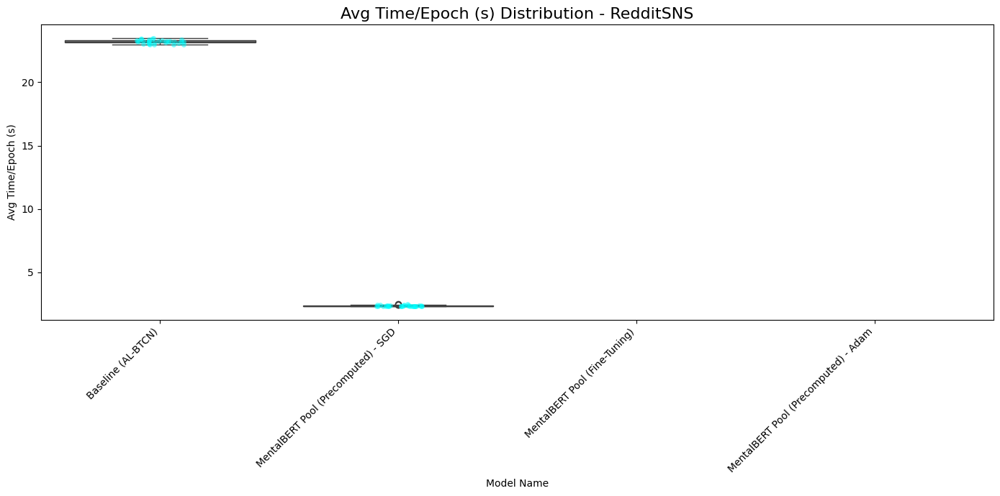

--- Twitter2 ---


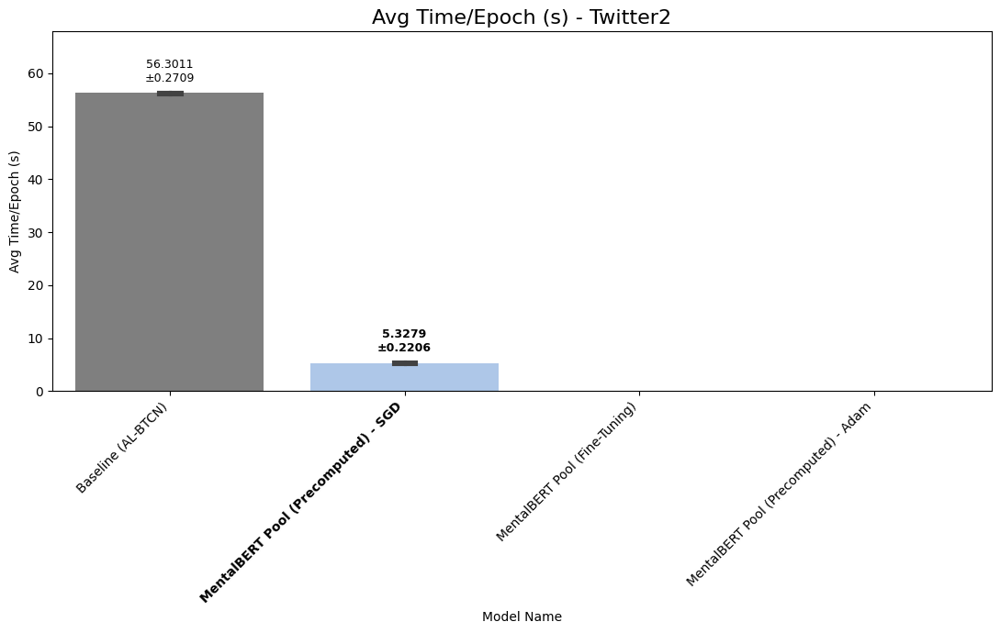

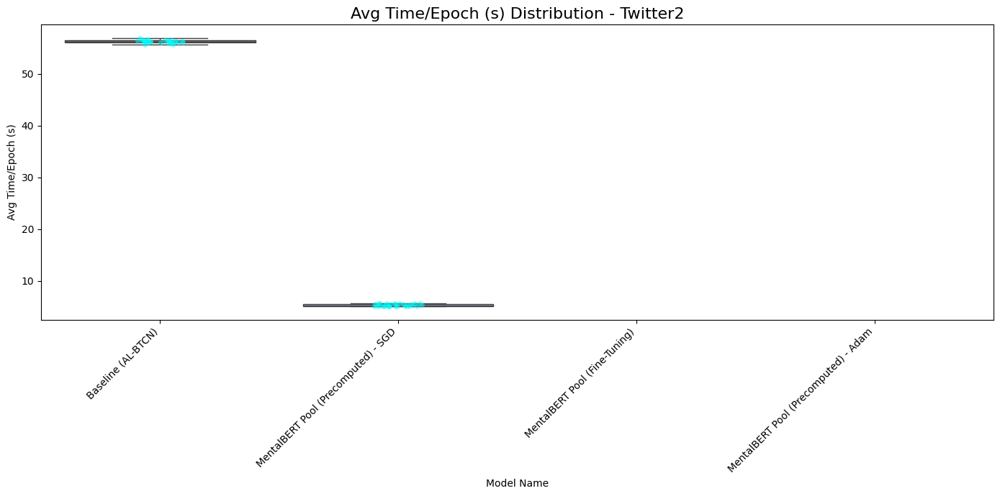

In [42]:
# Generate Plots per Dataset
datasets = full_df_v2['Dataset'].unique()

for metric in metrics_to_plot:
    print(f"=== {metric} ===")
    for dataset in datasets:
        print(f"--- {dataset} ---")
        # Bar Chart
        plot_barchart_dataset(full_df_v2, dataset, metric, order=model_order_v2)
        # Box Plot
        plot_boxplot_comparison(full_df_v2, dataset, metric, order=model_order_v2)


=== Trade-off Analysis for Reddit ===


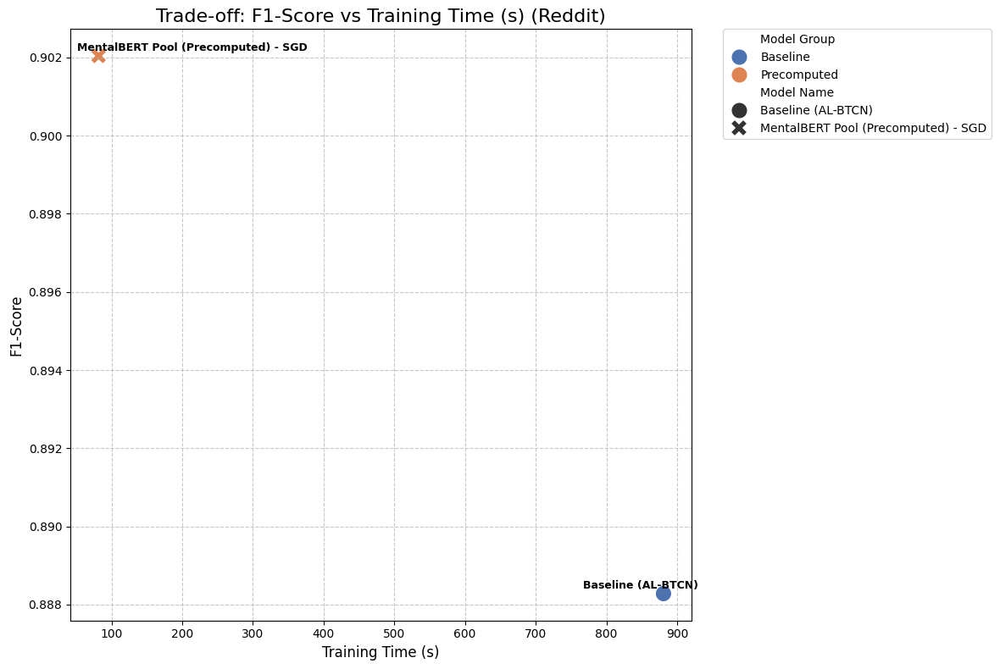

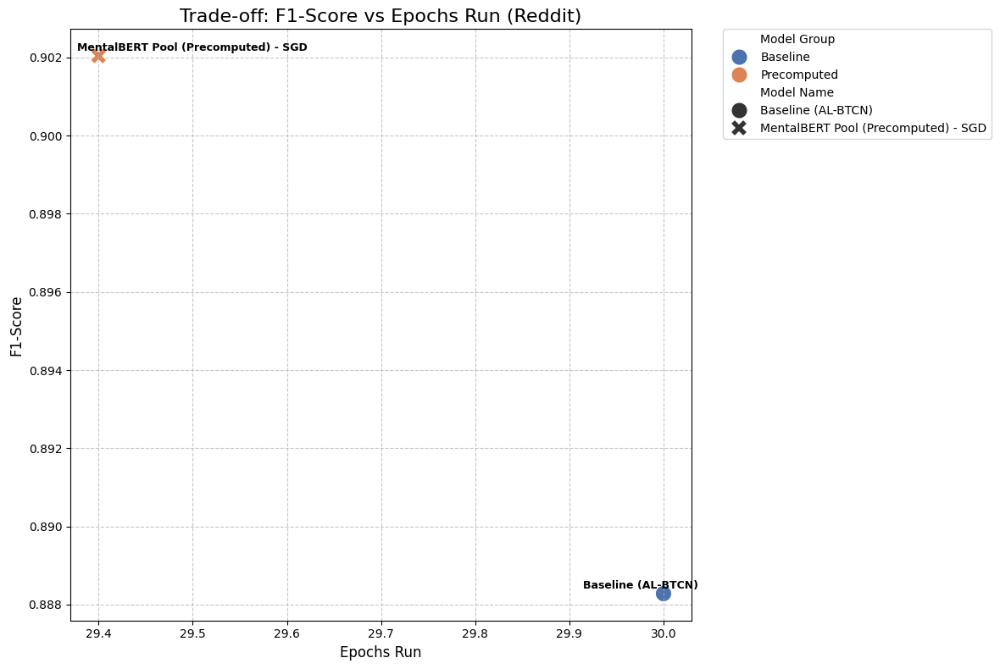

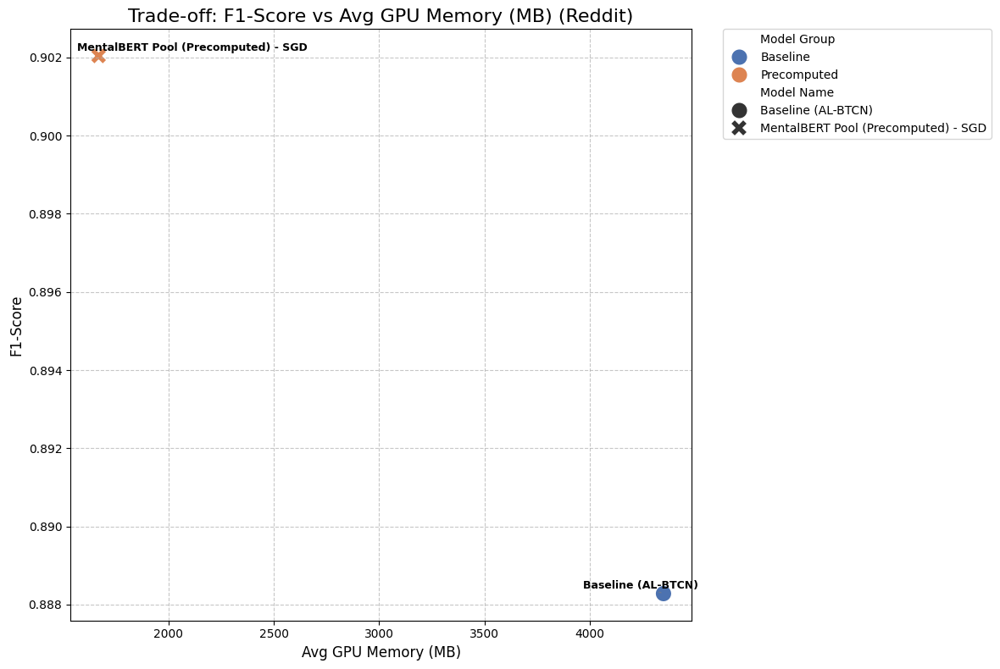

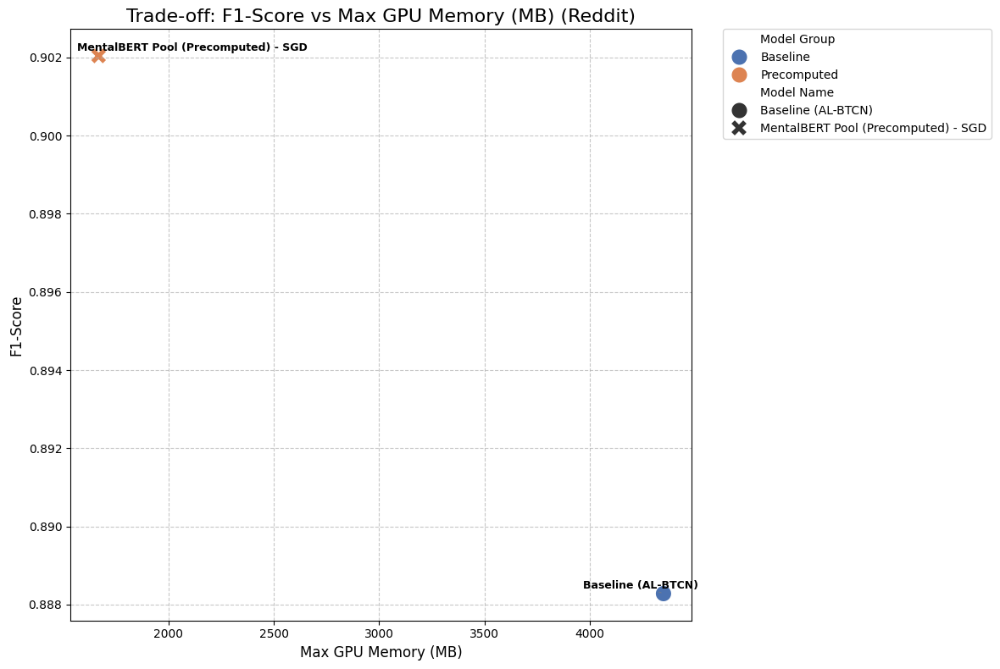

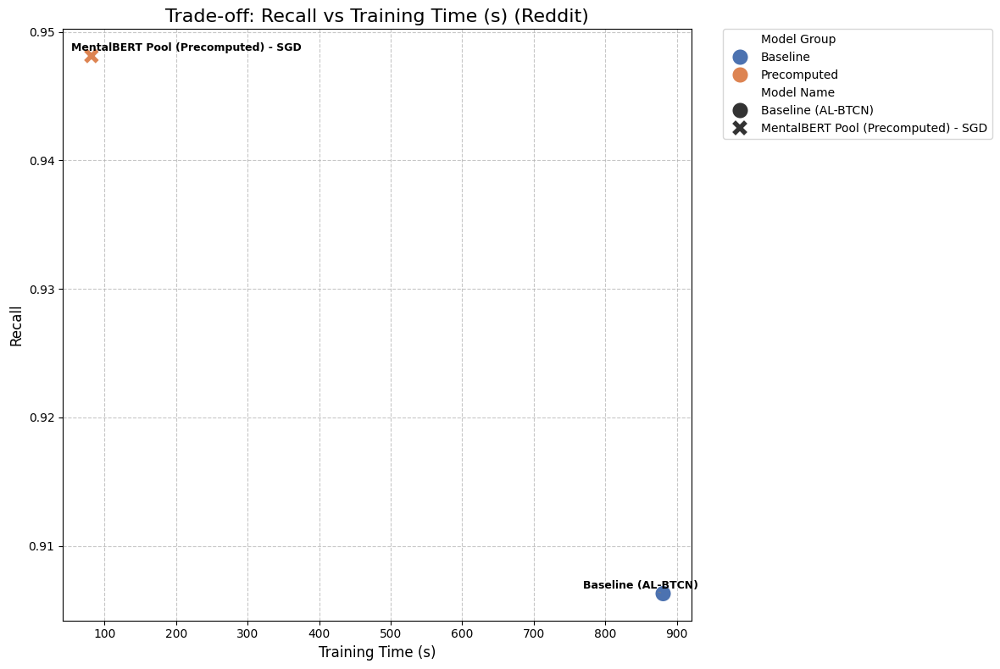

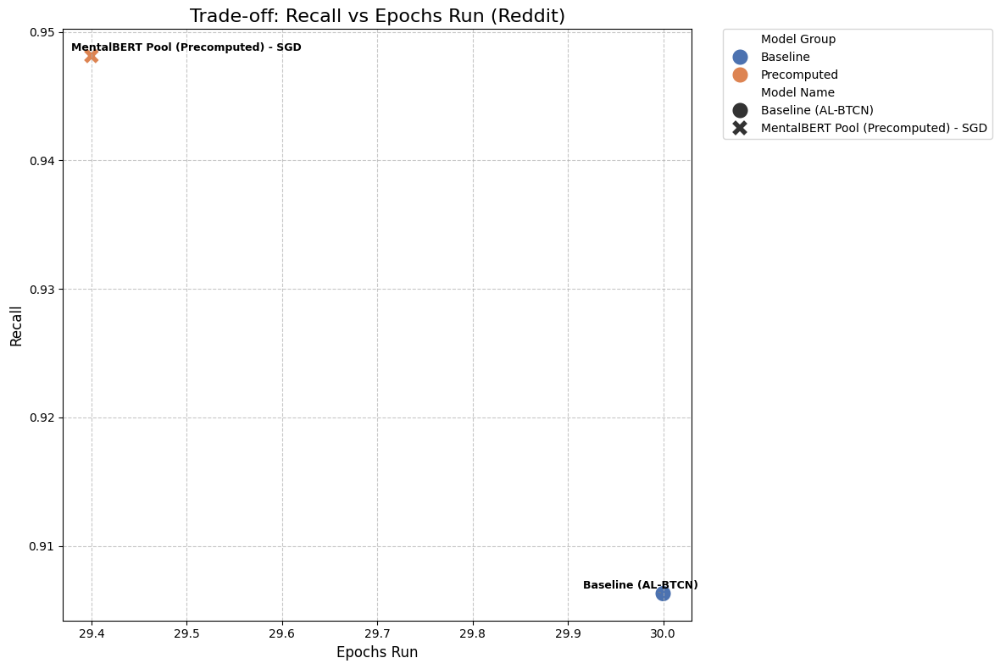

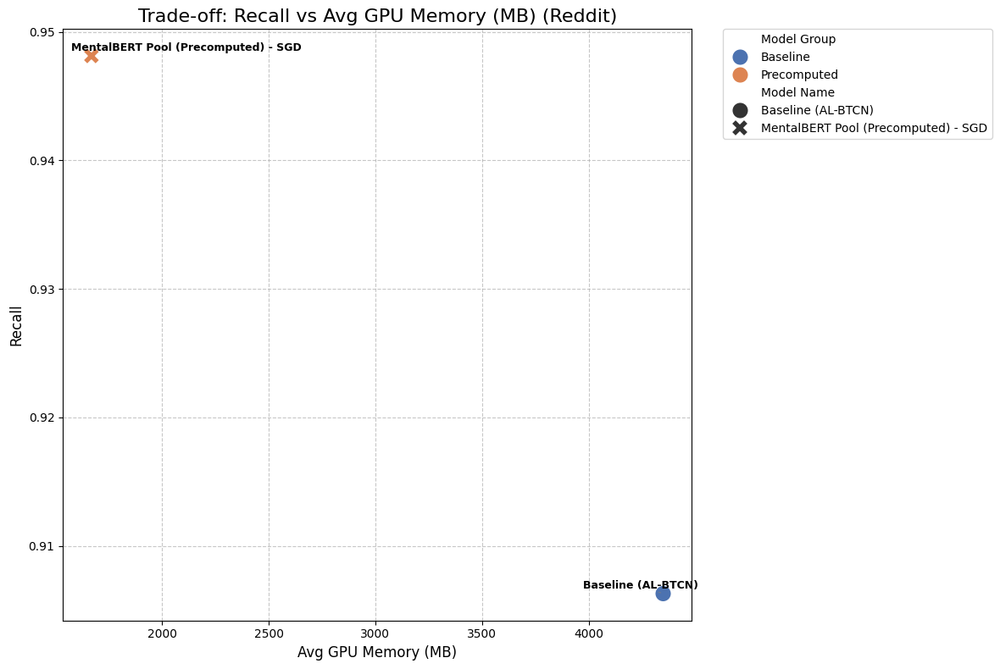

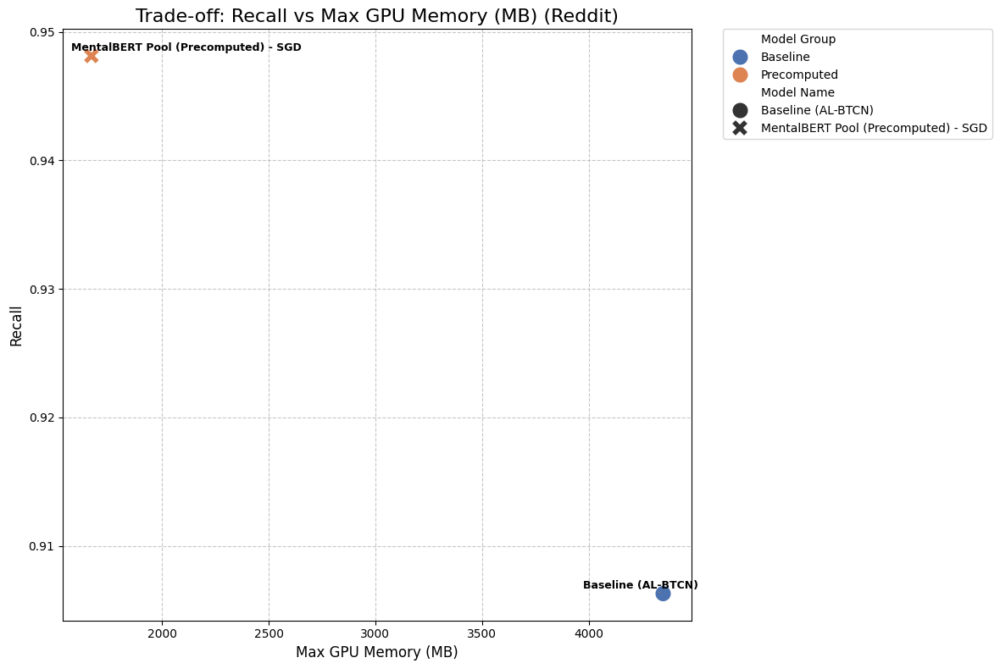

=== Trade-off Analysis for Twitter ===


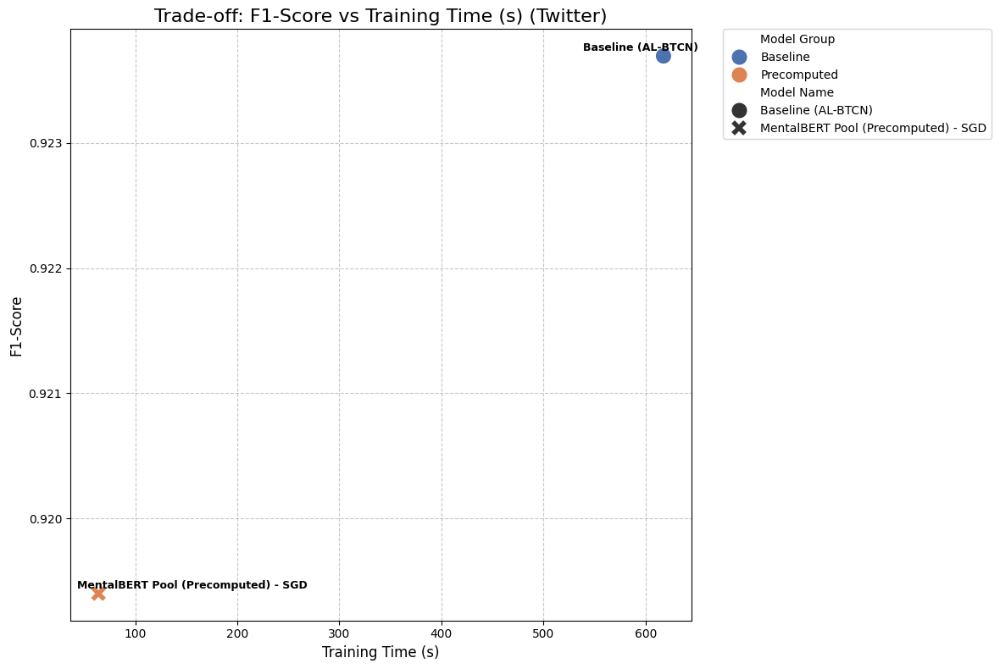

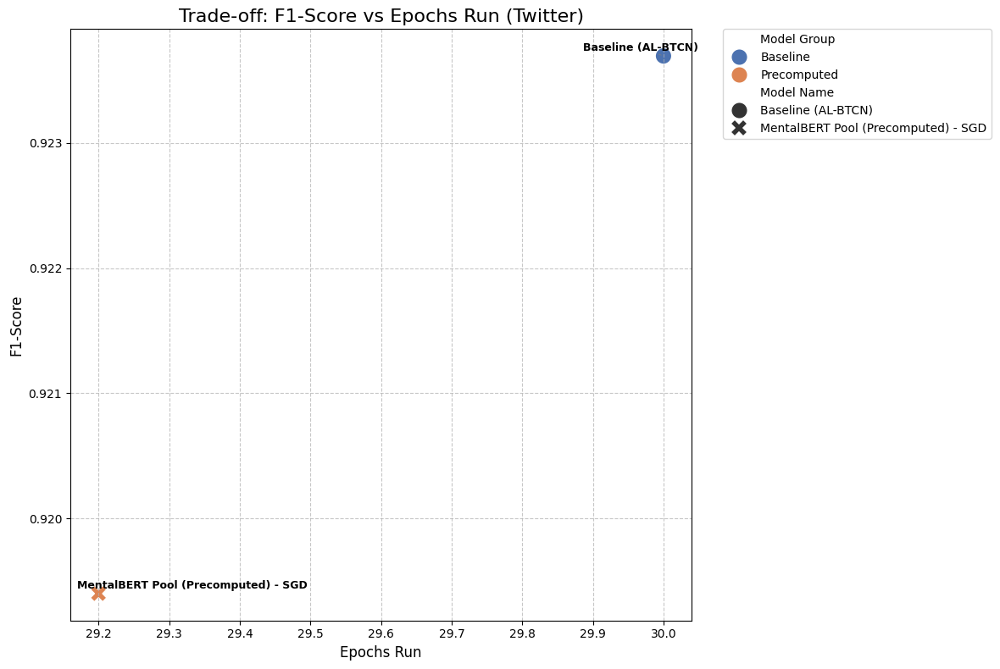

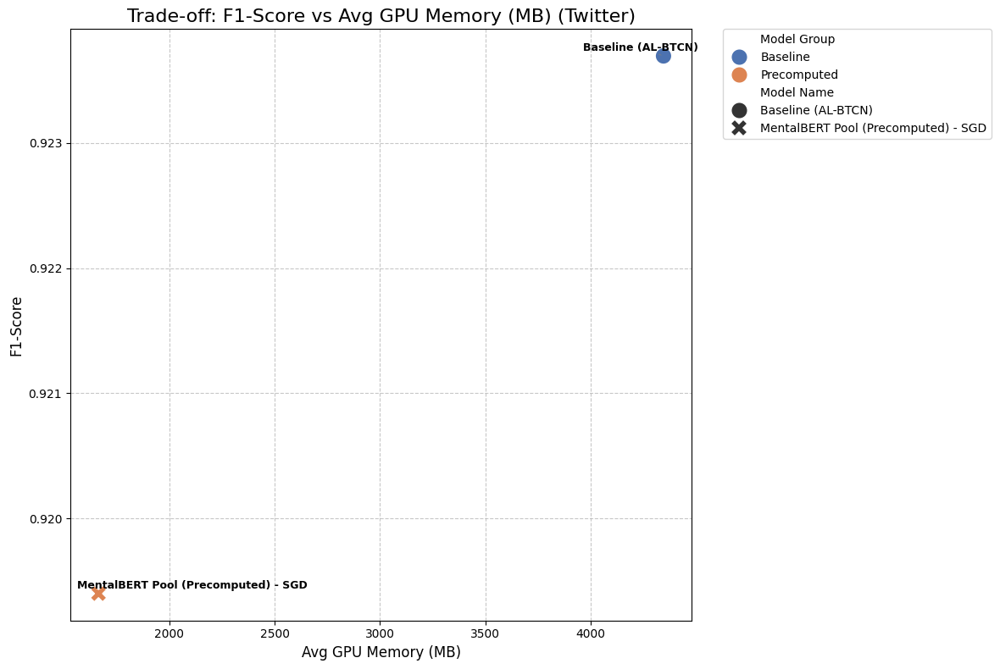

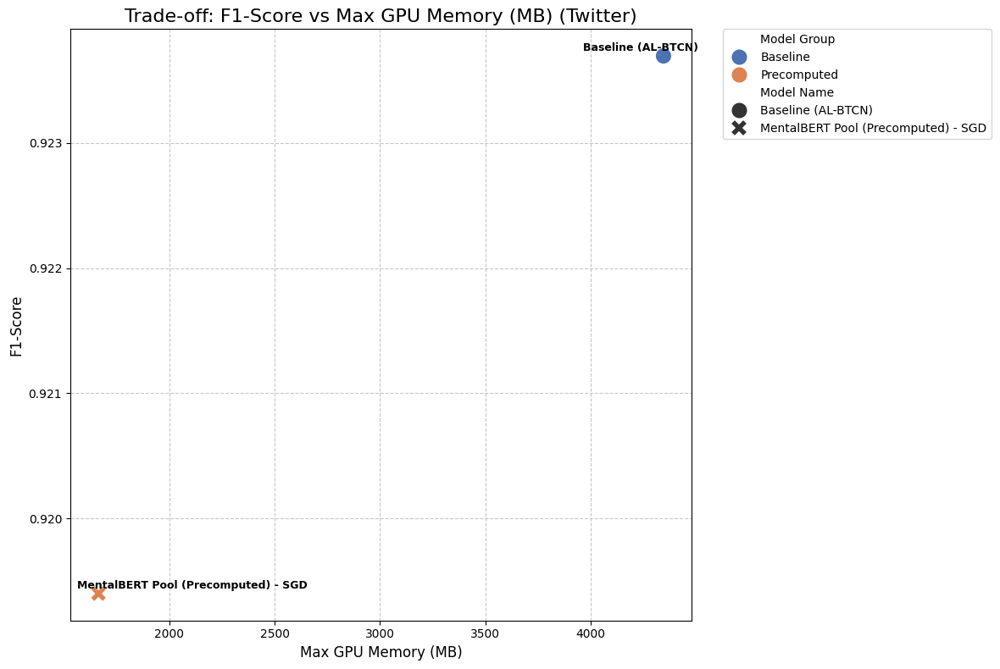

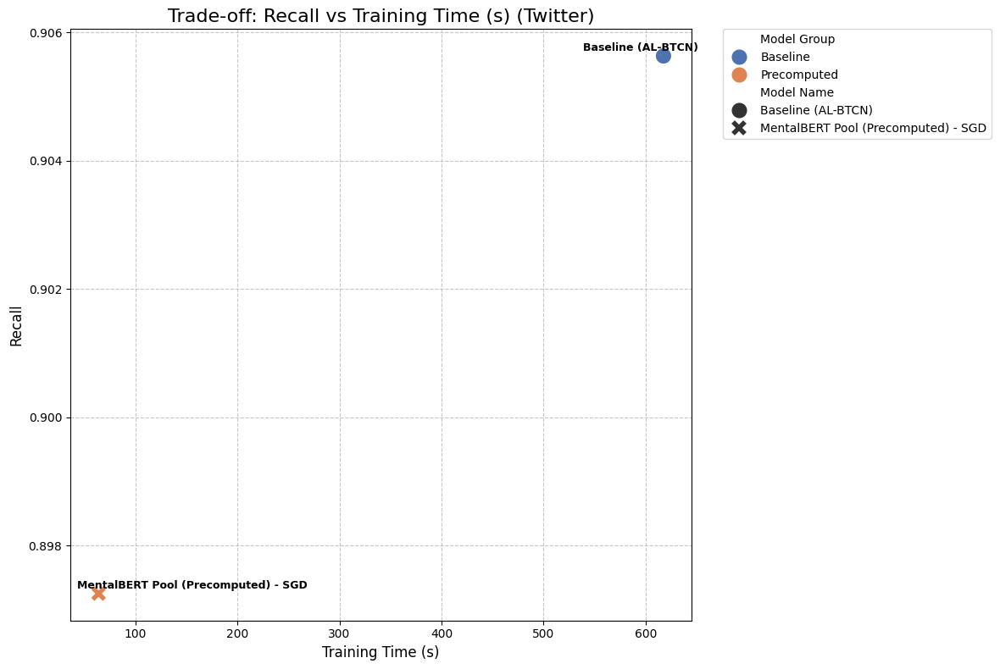

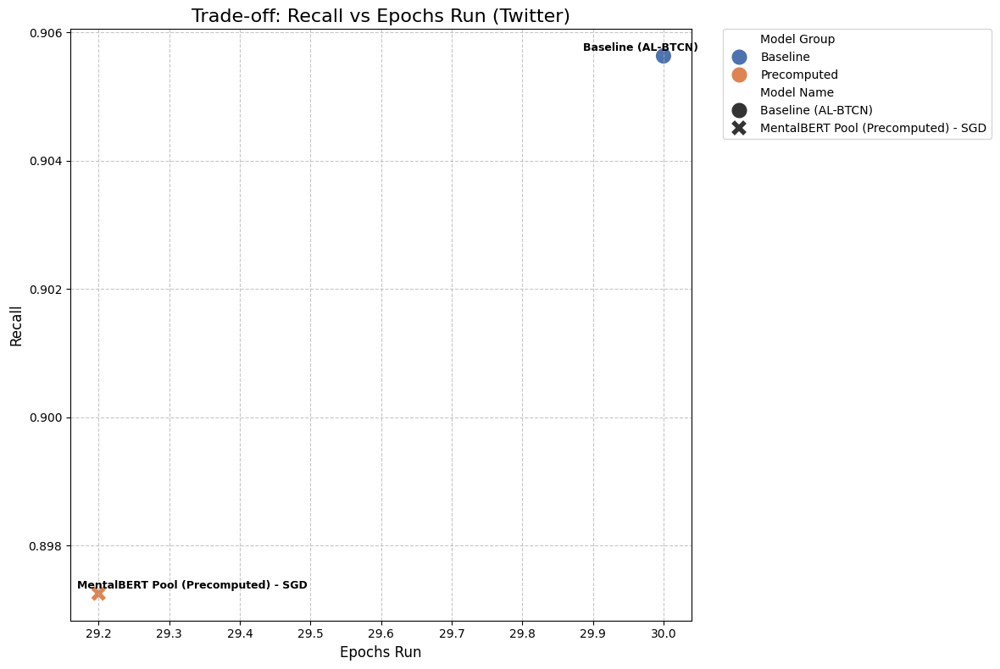

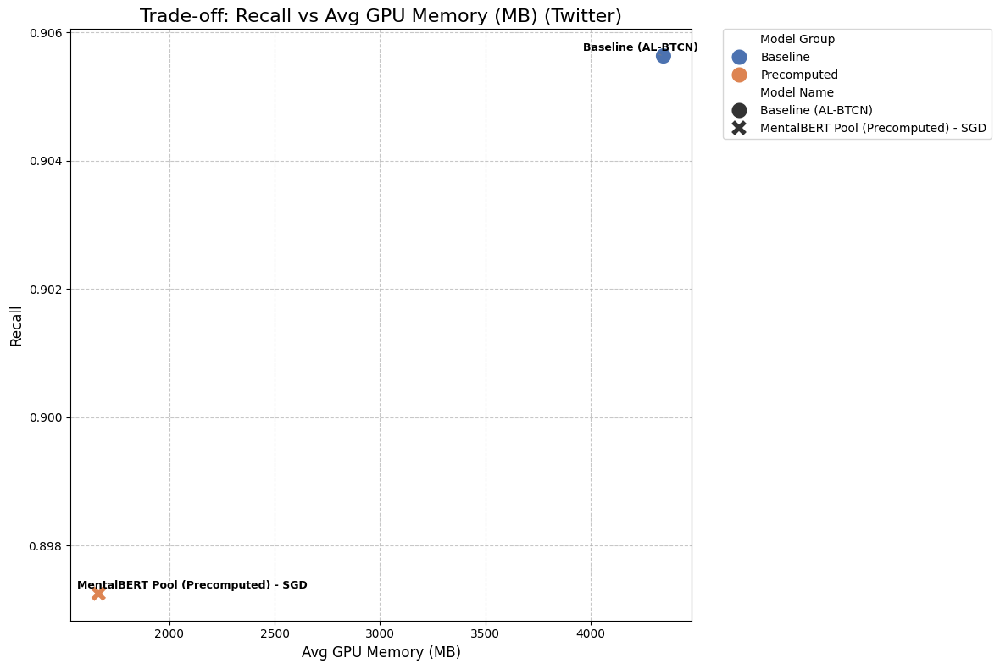

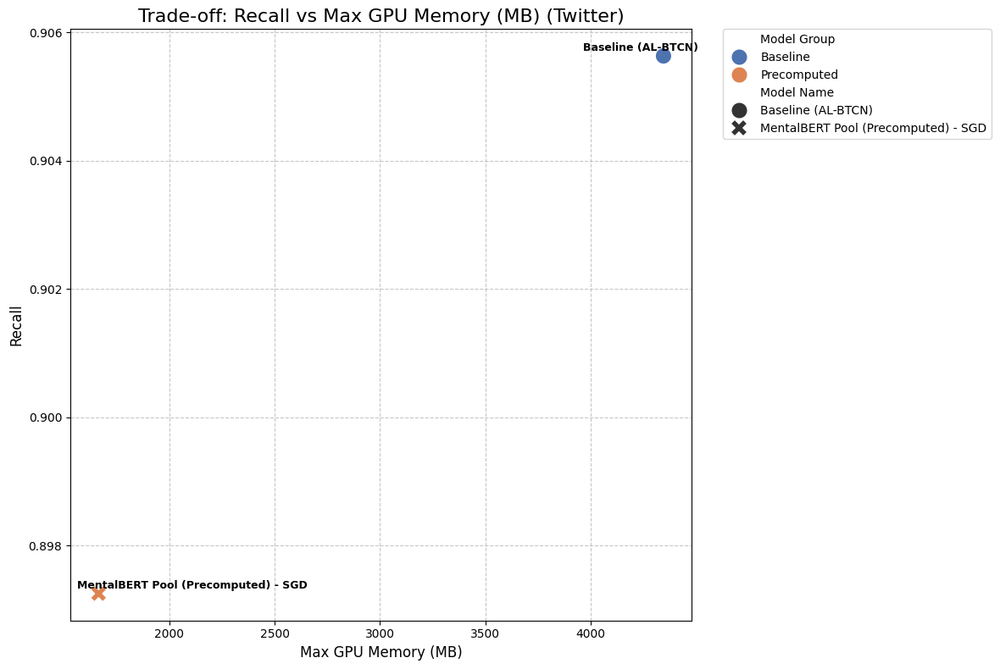

=== Trade-off Analysis for RedditSNS ===


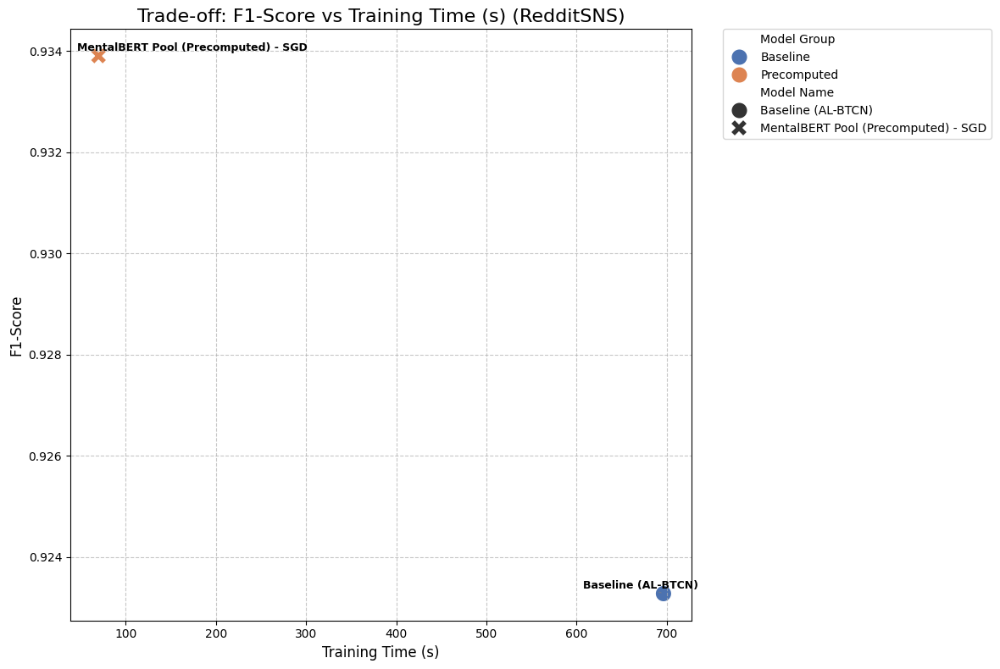

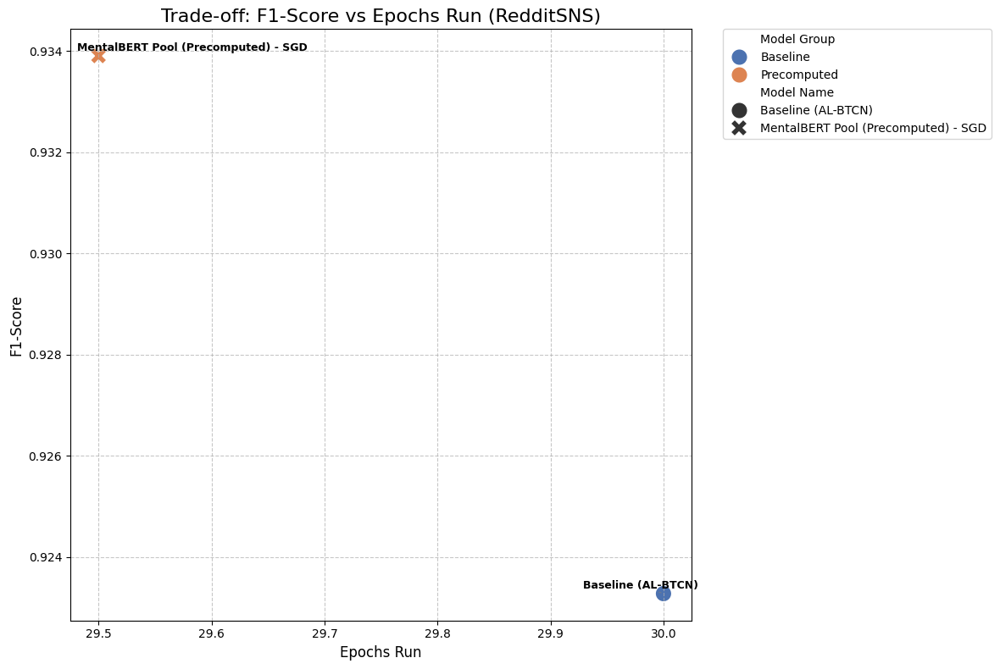

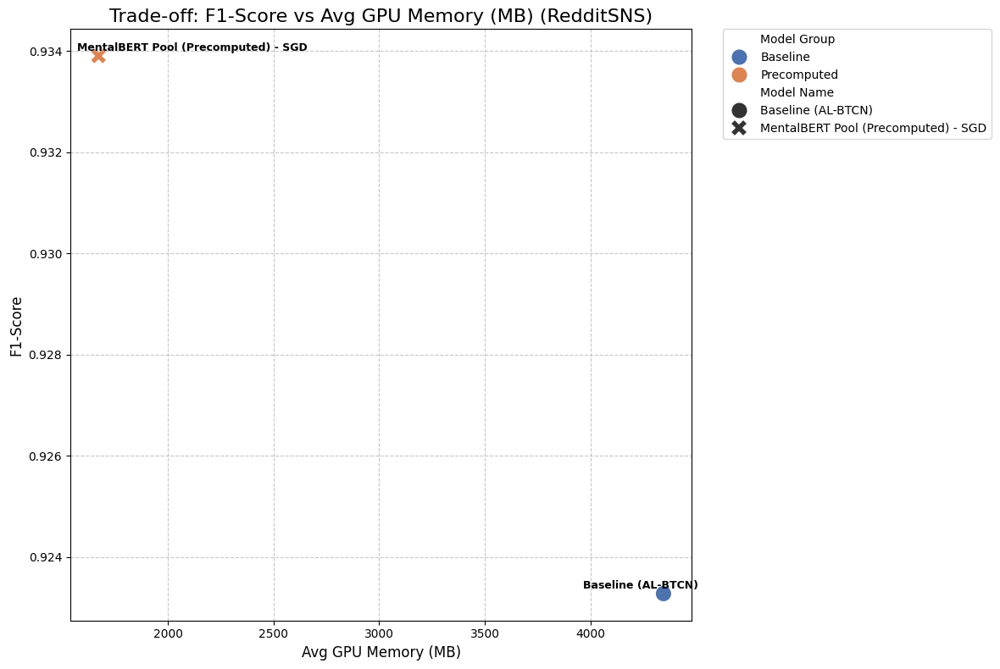

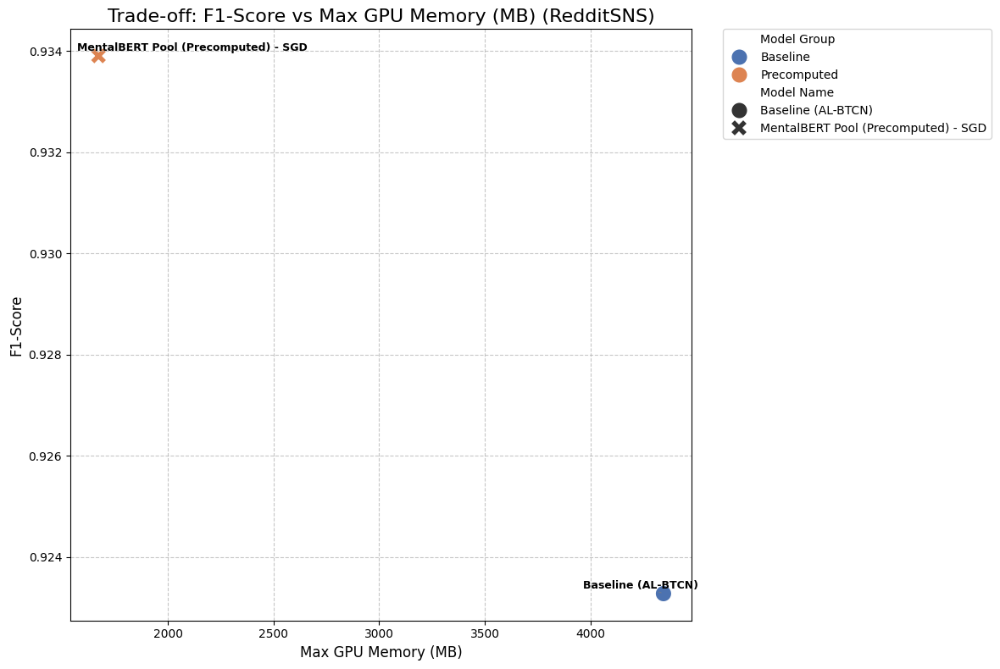

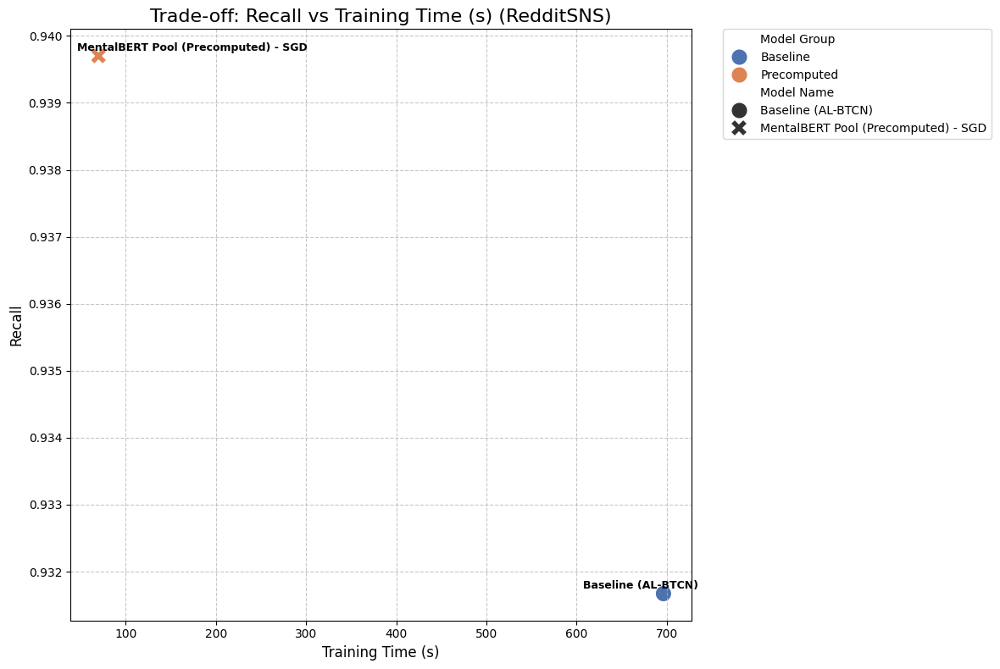

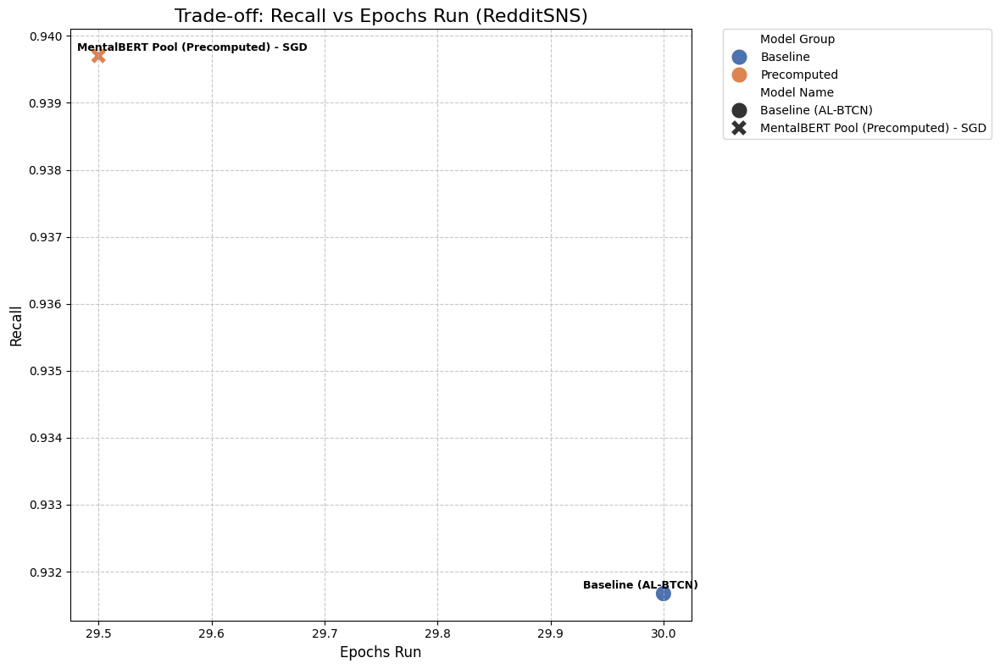

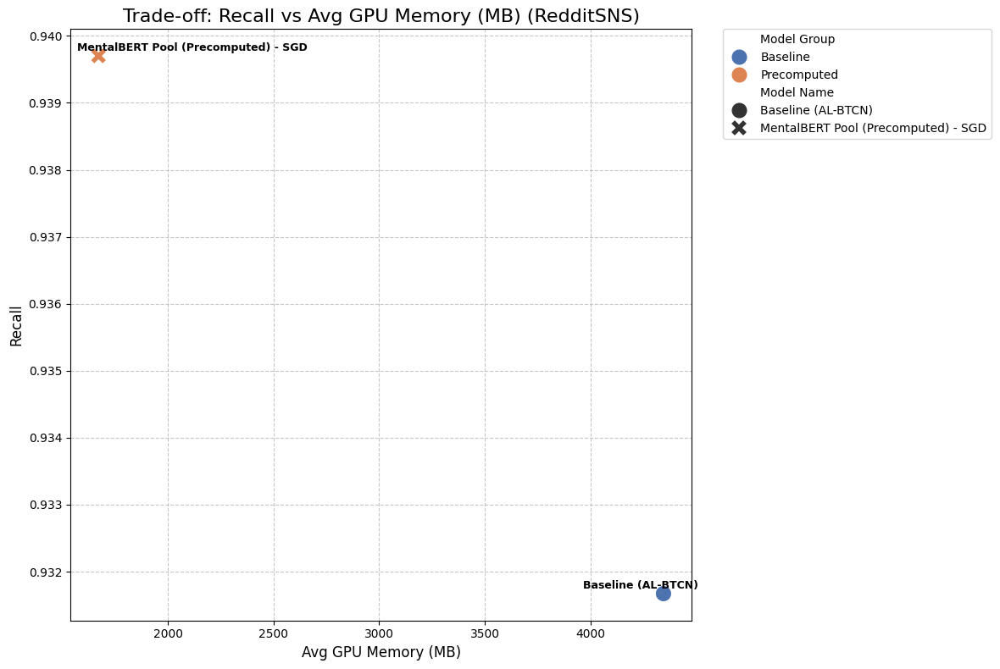

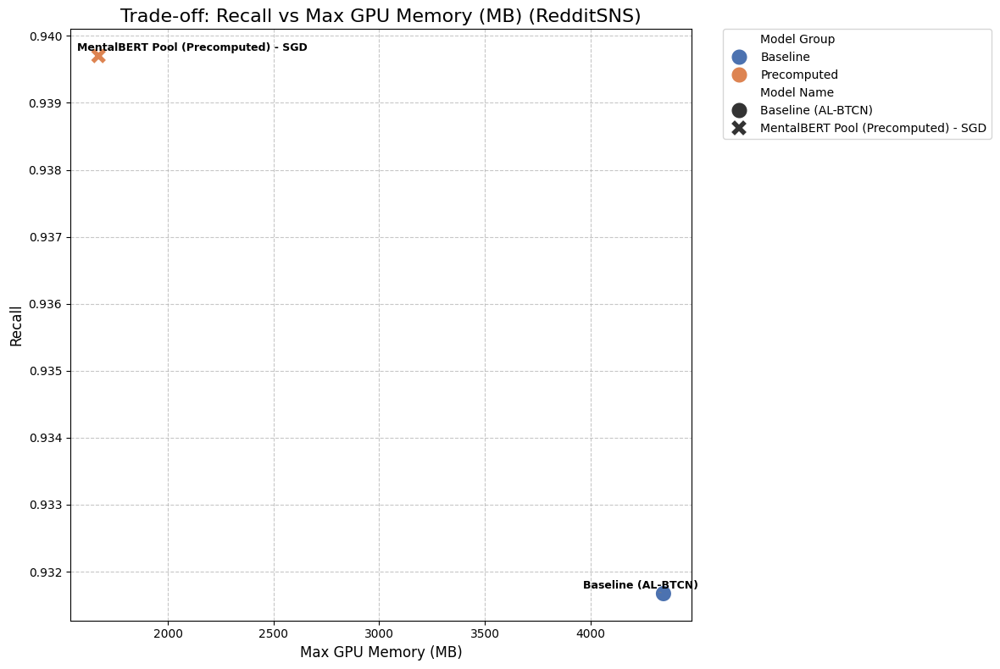

=== Trade-off Analysis for Twitter2 ===


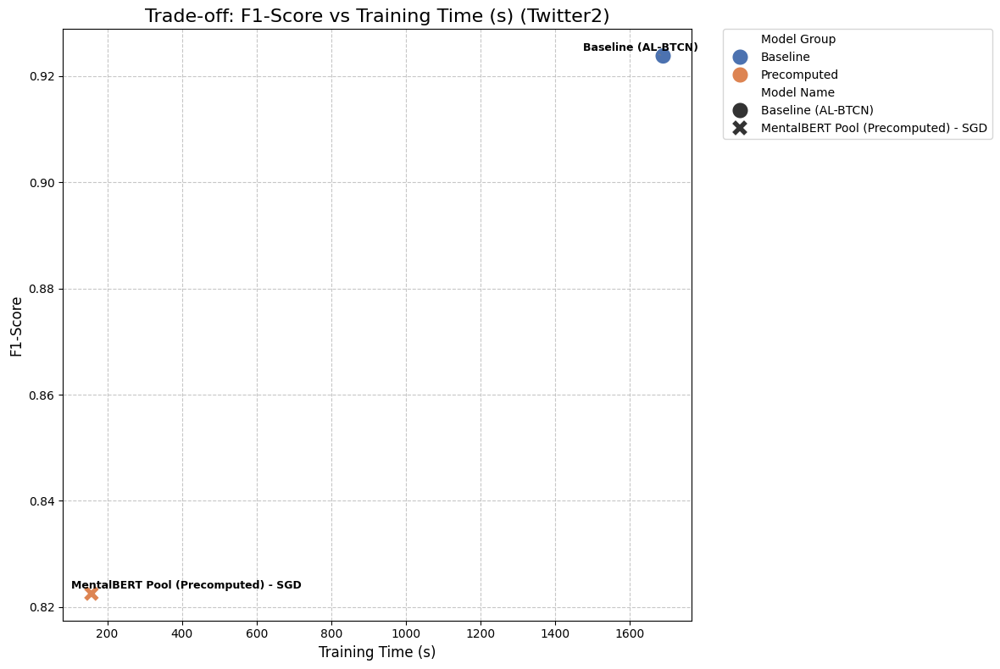

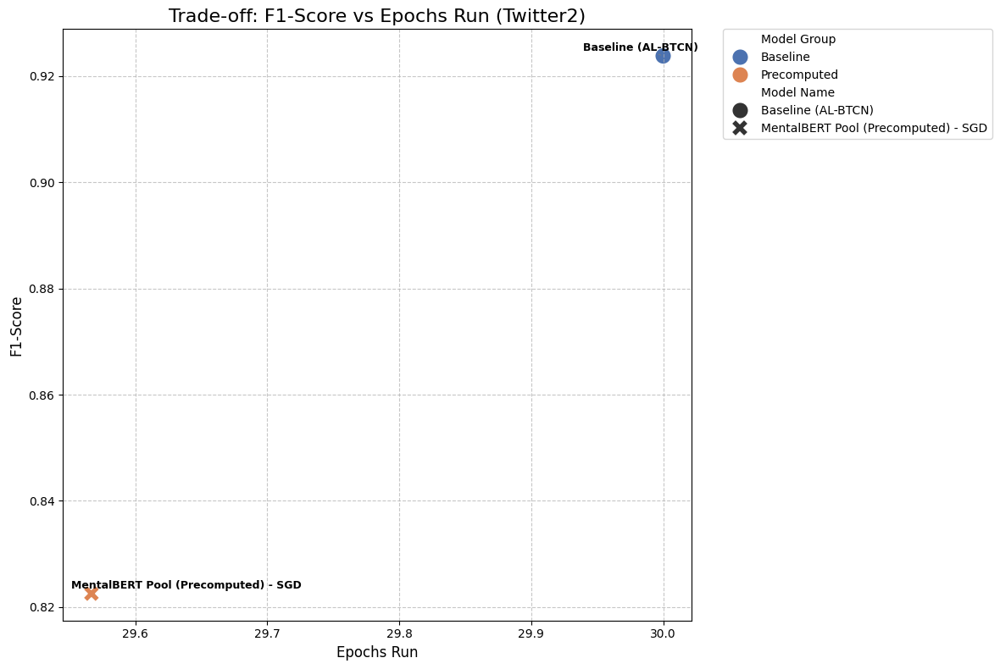

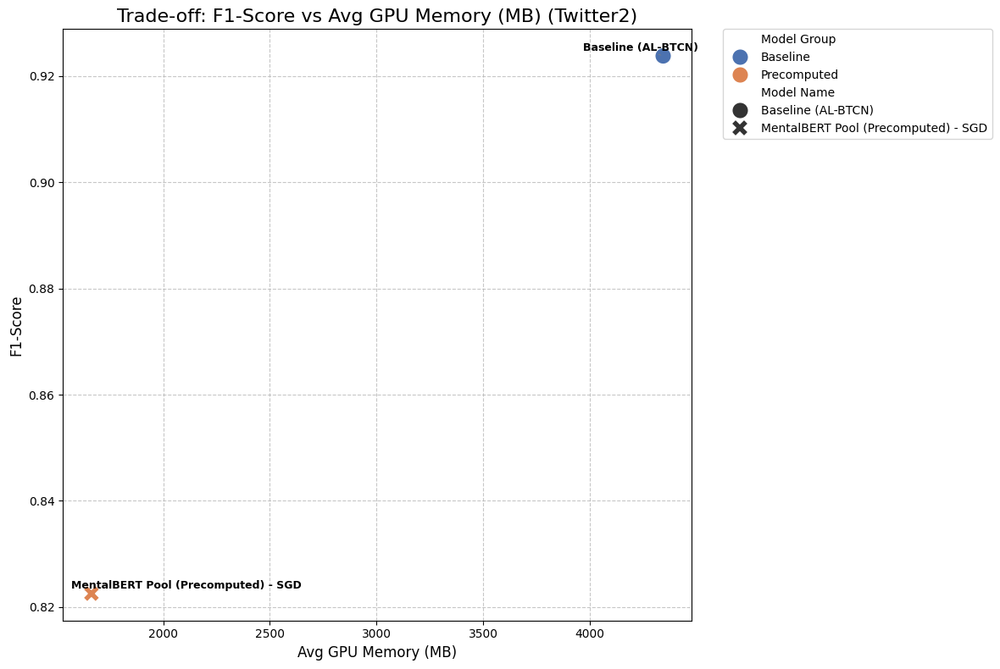

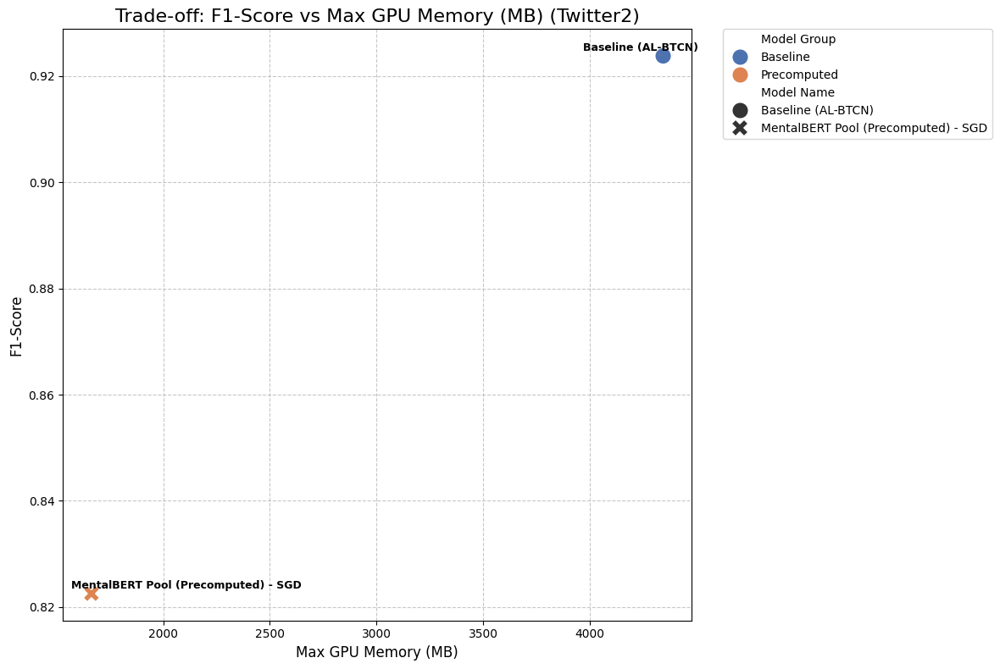

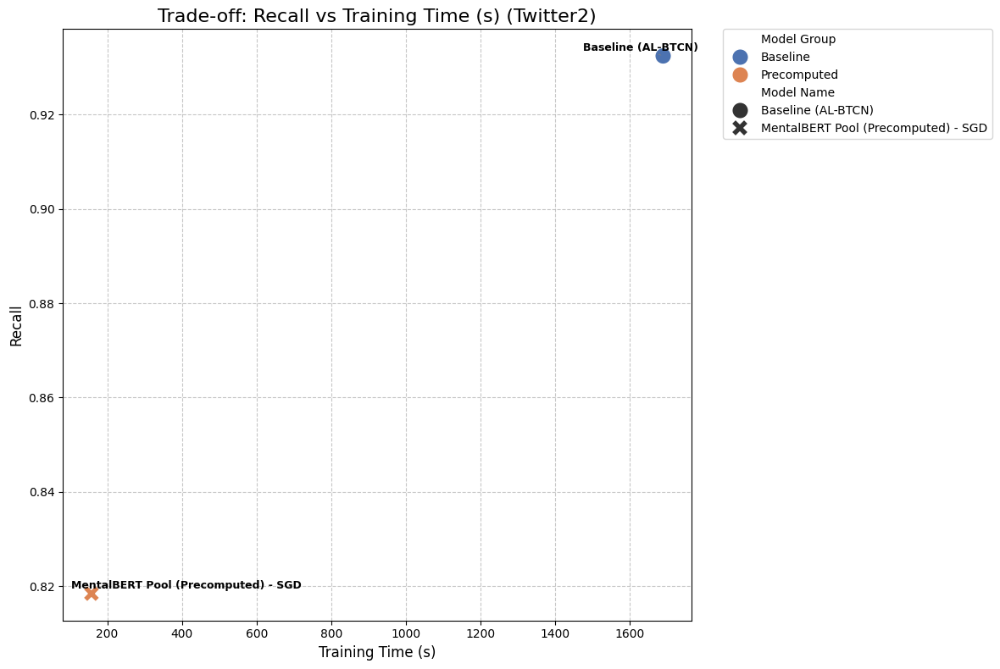

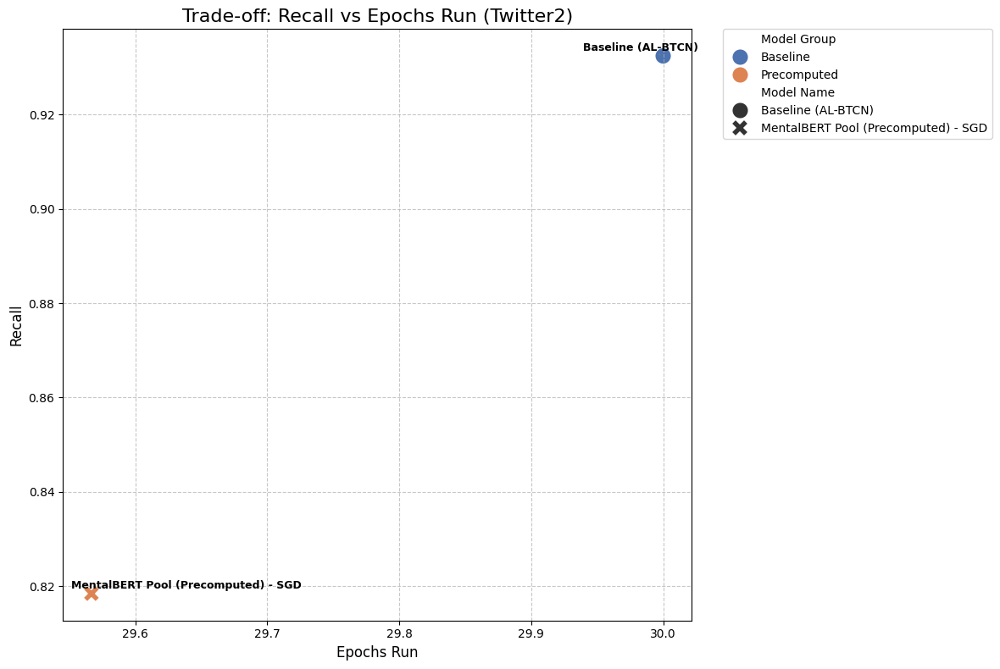

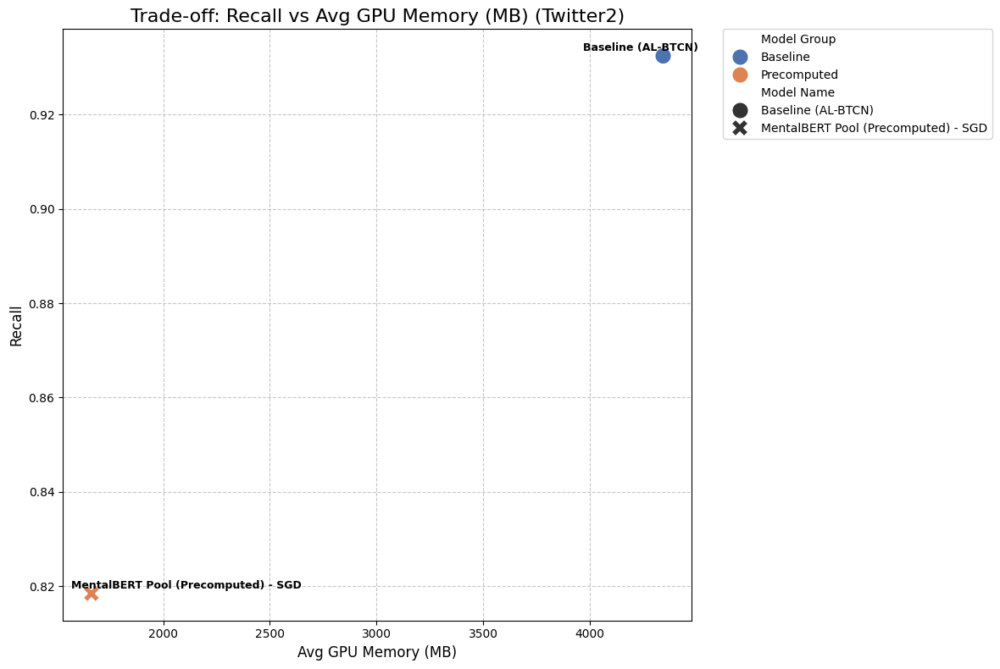

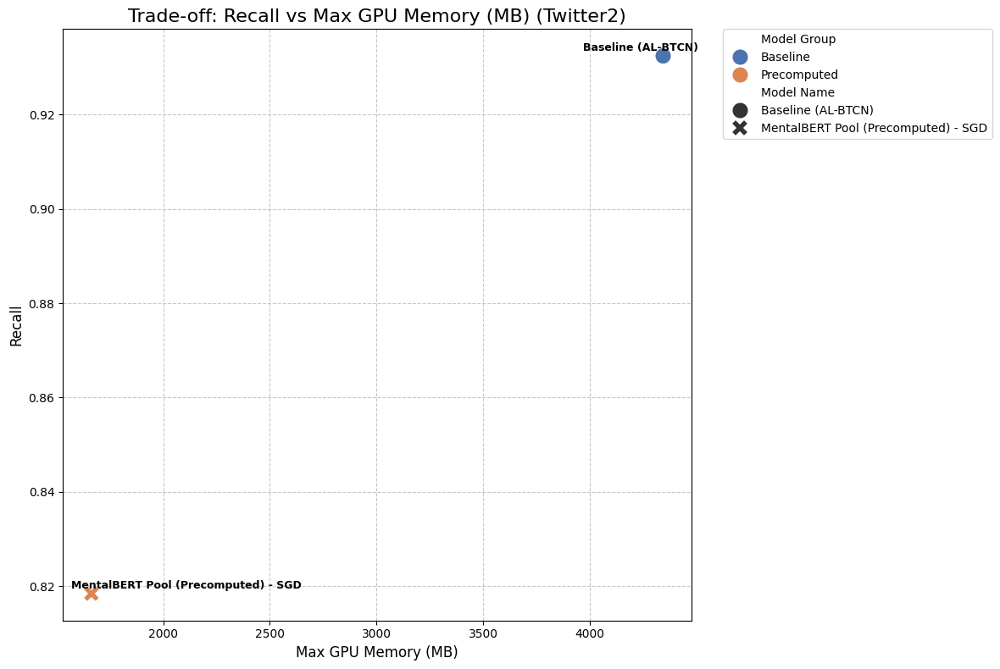

In [43]:
# Performance vs Efficiency Trade-off Analysis

# Define metrics for trade-off analysis
performance_metrics = ['F1-Score', 'Recall']
efficiency_metrics = ['Training Time (s)', 'Epochs Run', 'Avg GPU Memory (MB)', 'Max GPU Memory (MB)']

def plot_tradeoff(df, dataset_name, perf_metric, eff_metric):
    """
    Plots Performance vs Efficiency Trade-off using a scatter plot of means.
    """
    data = df[df['Dataset'] == dataset_name]
    if data.empty: return
    if perf_metric not in data.columns or eff_metric not in data.columns: return

    # Calculate means for each model
    summary = data.groupby('Model Name')[[perf_metric, eff_metric]].mean().reset_index()
    
    # Add Model Group info for coloring
    # We take the first occurrence of Model Group for each Model Name
    groups = data.groupby('Model Name')['Model Group'].first().reset_index()
    summary = pd.merge(summary, groups, on='Model Name')

    plt.figure(figsize=(12, 8))
    
    # Create scatter plot
    sns.scatterplot(
        data=summary,
        x=eff_metric,
        y=perf_metric,
        hue='Model Group',
        style='Model Name',
        s=200, # Marker size
        palette='deep'
    )
    
    # Annotate each point with Model Name
    texts = []
    for i, row in summary.iterrows():
        texts.append(plt.text(
            row[eff_metric], 
            row[perf_metric], 
            row['Model Name'], 
            fontsize=9,
            fontweight='bold'
        ))
    
    # Adjust text to avoid overlap
    try:
        from adjustText import adjust_text
        adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5))
    except ImportError:
        print("Warning: adjustText not installed. Labels may overlap. Run `pip install adjustText`.")

    plt.title(f'Trade-off: {perf_metric} vs {eff_metric} ({dataset_name})', fontsize=16)
    plt.xlabel(eff_metric, fontsize=12)
    plt.ylabel(perf_metric, fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Move legend outside
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    
    plt.tight_layout()
    plt.show()

# Generate Trade-off Plots
datasets = full_df_v2['Dataset'].unique()

for dataset in datasets:
    print(f"=== Trade-off Analysis for {dataset} ===")
    for perf in performance_metrics:
        for eff in efficiency_metrics:
            plot_tradeoff(full_df_v2, dataset, perf, eff)


In [44]:
# Calculate and Display Improvements
import pandas as pd
# Define Models
baseline_model = 'Baseline (AL-BTCN)'
proposed_models = [
    'MentalBERT Pool (Fine-Tuning)',
    'MentalBERT Pool (Precomputed) - Adam',
    'MentalBERT Pool (Precomputed) - SGD'
]

# Define Metrics
perf_metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC']
eff_metrics = ['Training Time (s)', 'Max GPU Memory (MB)', 'Avg GPU Memory (MB)', 'Epochs Run', 'Avg Time/Epoch (s)']

all_metrics = perf_metrics + eff_metrics

# Function to format change
def format_change(val, is_percentage=False):
    sign = "+" if val > 0 else ""
    if is_percentage:
        return f"{sign}{val:.2f}%"
    return f"{sign}{val:.4f}"

# 1. Per Dataset Improvement
print("=== Improvement per Dataset (Proposed vs Baseline) ===")
datasets = full_df_v2['Dataset'].unique()

for dataset in datasets:
    print(f"\nDataset: {dataset}")
    d_df = full_df_v2[full_df_v2['Dataset'] == dataset]
    means = d_df.groupby('Model Name')[all_metrics].mean()
    
    if baseline_model not in means.index:
        print(f"Baseline model not found in {dataset}")
        continue
        
    base_vals = means.loc[baseline_model]
    
    for proposed in proposed_models:
        if proposed not in means.index: continue
        
        print(f"  Comparison: {proposed} vs Baseline")
        prop_vals = means.loc[proposed]
        
        # Performance Metrics
        print("    Performance (Absolute Diff | Relative % Change):")
        for m in perf_metrics:
            if m in means.columns:
                diff = prop_vals[m] - base_vals[m]
                pct = (diff / base_vals[m]) * 100
                print(f"      {m:<15}: {format_change(diff)} ({format_change(pct, True)})")
        
        # Efficiency Metrics
        print("    Efficiency (Absolute Diff | Relative % Change | Ratio):")
        for m in eff_metrics:
            if m in means.columns:
                diff = prop_vals[m] - base_vals[m]
                pct = (diff / base_vals[m]) * 100
                ratio = prop_vals[m] / base_vals[m] if base_vals[m] != 0 else 0
                print(f"      {m:<20}: {format_change(diff)} ({format_change(pct, True)}) [Ratio: {ratio:.2f}x]")

# 2. Overall Improvement
print("\n" + "="*40)
print("=== Overall Improvement (Average across Datasets) ===")

# Calculate average metrics across all datasets for each model
# We use macro-average (average of dataset means) to treat each dataset equally
dataset_means = full_df_v2.groupby(['Dataset', 'Model Name'])[all_metrics].mean().reset_index()
overall_means = dataset_means.groupby('Model Name')[all_metrics].mean()

if baseline_model in overall_means.index:
    base_vals = overall_means.loc[baseline_model]
    
    for proposed in proposed_models:
        if proposed not in overall_means.index: continue
        
        print(f"\nComparison: {proposed} vs Baseline")
        prop_vals = overall_means.loc[proposed]
        
        print("  Performance (Absolute Diff | Relative % Change):")
        for m in perf_metrics:
            if m in overall_means.columns:
                diff = prop_vals[m] - base_vals[m]
                pct = (diff / base_vals[m]) * 100
                print(f"    {m:<15}: {format_change(diff)} ({format_change(pct, True)})")
                
        print("  Efficiency (Absolute Diff | Relative % Change | Ratio):")
        for m in eff_metrics:
            if m in overall_means.columns:
                diff = prop_vals[m] - base_vals[m]
                pct = (diff / base_vals[m]) * 100
                ratio = prop_vals[m] / base_vals[m] if base_vals[m] != 0 else 0
                print(f"    {m:<20}: {format_change(diff)} ({format_change(pct, True)}) [Ratio: {ratio:.2f}x]")

=== Improvement per Dataset (Proposed vs Baseline) ===

Dataset: Reddit
  Comparison: MentalBERT Pool (Precomputed) - SGD vs Baseline
    Performance (Absolute Diff | Relative % Change):
      Accuracy       : +0.0114 (+1.29%)
      Precision      : -0.0113 (-1.30%)
      Recall         : +0.0419 (+4.62%)
      F1-Score       : +0.0138 (+1.55%)
      ROC-AUC        : -0.0110 (-1.15%)
    Efficiency (Absolute Diff | Relative % Change | Ratio):
      Training Time (s)   : -798.9131 (-90.71%) [Ratio: 0.09x]
      Max GPU Memory (MB) : -2679.8000 (-61.62%) [Ratio: 0.38x]
      Avg GPU Memory (MB) : -2679.8000 (-61.62%) [Ratio: 0.38x]
      Epochs Run          : -0.6000 (-2.00%) [Ratio: 0.98x]
      Avg Time/Epoch (s)  : -26.5744 (-90.52%) [Ratio: 0.09x]

Dataset: Twitter
  Comparison: MentalBERT Pool (Precomputed) - SGD vs Baseline
    Performance (Absolute Diff | Relative % Change):
      Accuracy       : -0.0040 (-0.43%)
      Precision      : -0.0018 (-0.19%)
      Recall         : -0.0

In [45]:
# exclude twitter2
# Calculate and Display Improvements
import pandas as pd

# Filter data to exclude Twitter2
df_analysis = full_df_v2[full_df_v2['Dataset'] != 'Twitter2']

# Define Models
baseline_model = 'Baseline (AL-BTCN)'
proposed_models = [
    'MentalBERT Pool (Fine-Tuning)',
    'MentalBERT Pool (Precomputed) - Adam',
    'MentalBERT Pool (Precomputed) - SGD'
]

# Define Metrics
perf_metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'ROC-AUC']
eff_metrics = ['Training Time (s)', 'Max GPU Memory (MB)', 'Avg GPU Memory (MB)', 'Epochs Run', 'Avg Time/Epoch (s)']

all_metrics = perf_metrics + eff_metrics

# Function to format change
def format_change(val, is_percentage=False):
    sign = "+" if val > 0 else ""
    if is_percentage:
        return f"{sign}{val:.2f}%"
    return f"{sign}{val:.4f}"

# 1. Per Dataset Improvement
print("=== Improvement per Dataset (Proposed vs Baseline) ===")
datasets = df_analysis['Dataset'].unique()

for dataset in datasets:
    print(f"\nDataset: {dataset}")
    d_df = df_analysis[df_analysis['Dataset'] == dataset]
    means = d_df.groupby('Model Name')[all_metrics].mean()
    
    if baseline_model not in means.index:
        print(f"Baseline model not found in {dataset}")
        continue
        
    base_vals = means.loc[baseline_model]
    
    for proposed in proposed_models:
        if proposed not in means.index: continue
        
        print(f"  Comparison: {proposed} vs Baseline")
        prop_vals = means.loc[proposed]
        
        # Performance Metrics
        print("    Performance (Absolute Diff | Relative % Change):")
        for m in perf_metrics:
            if m in means.columns:
                diff = prop_vals[m] - base_vals[m]
                pct = (diff / base_vals[m]) * 100
                print(f"      {m:<15}: {format_change(diff)} ({format_change(pct, True)})")
        
        # Efficiency Metrics
        print("    Efficiency (Absolute Diff | Relative % Change | Ratio):")
        for m in eff_metrics:
            if m in means.columns:
                diff = prop_vals[m] - base_vals[m]
                pct = (diff / base_vals[m]) * 100
                ratio = prop_vals[m] / base_vals[m] if base_vals[m] != 0 else 0
                print(f"      {m:<20}: {format_change(diff)} ({format_change(pct, True)}) [Ratio: {ratio:.2f}x]")

# 2. Overall Improvement
print("\n" + "="*40)
print("=== Overall Improvement (Average across Datasets) ===")

# Calculate average metrics across all datasets for each model
# We use macro-average (average of dataset means) to treat each dataset equally
dataset_means = df_analysis.groupby(['Dataset', 'Model Name'])[all_metrics].mean().reset_index()
overall_means = dataset_means.groupby('Model Name')[all_metrics].mean()

if baseline_model in overall_means.index:
    base_vals = overall_means.loc[baseline_model]
    
    for proposed in proposed_models:
        if proposed not in overall_means.index: continue
        
        print(f"\nComparison: {proposed} vs Baseline")
        prop_vals = overall_means.loc[proposed]
        
        print("  Performance (Absolute Diff | Relative % Change):")
        for m in perf_metrics:
            if m in overall_means.columns:
                diff = prop_vals[m] - base_vals[m]
                pct = (diff / base_vals[m]) * 100
                print(f"    {m:<15}: {format_change(diff)} ({format_change(pct, True)})")
                
        print("  Efficiency (Absolute Diff | Relative % Change | Ratio):")
        for m in eff_metrics:
            if m in overall_means.columns:
                diff = prop_vals[m] - base_vals[m]
                pct = (diff / base_vals[m]) * 100
                ratio = prop_vals[m] / base_vals[m] if base_vals[m] != 0 else 0
                print(f"    {m:<20}: {format_change(diff)} ({format_change(pct, True)}) [Ratio: {ratio:.2f}x]")

=== Improvement per Dataset (Proposed vs Baseline) ===

Dataset: Reddit
  Comparison: MentalBERT Pool (Precomputed) - SGD vs Baseline
    Performance (Absolute Diff | Relative % Change):
      Accuracy       : +0.0114 (+1.29%)
      Precision      : -0.0113 (-1.30%)
      Recall         : +0.0419 (+4.62%)
      F1-Score       : +0.0138 (+1.55%)
      ROC-AUC        : -0.0110 (-1.15%)
    Efficiency (Absolute Diff | Relative % Change | Ratio):
      Training Time (s)   : -798.9131 (-90.71%) [Ratio: 0.09x]
      Max GPU Memory (MB) : -2679.8000 (-61.62%) [Ratio: 0.38x]
      Avg GPU Memory (MB) : -2679.8000 (-61.62%) [Ratio: 0.38x]
      Epochs Run          : -0.6000 (-2.00%) [Ratio: 0.98x]
      Avg Time/Epoch (s)  : -26.5744 (-90.52%) [Ratio: 0.09x]

Dataset: Twitter
  Comparison: MentalBERT Pool (Precomputed) - SGD vs Baseline
    Performance (Absolute Diff | Relative % Change):
      Accuracy       : -0.0040 (-0.43%)
      Precision      : -0.0018 (-0.19%)
      Recall         : -0.0

Starting Overfitting & Generalization Analysis...

>>> Processing Dataset: Reddit


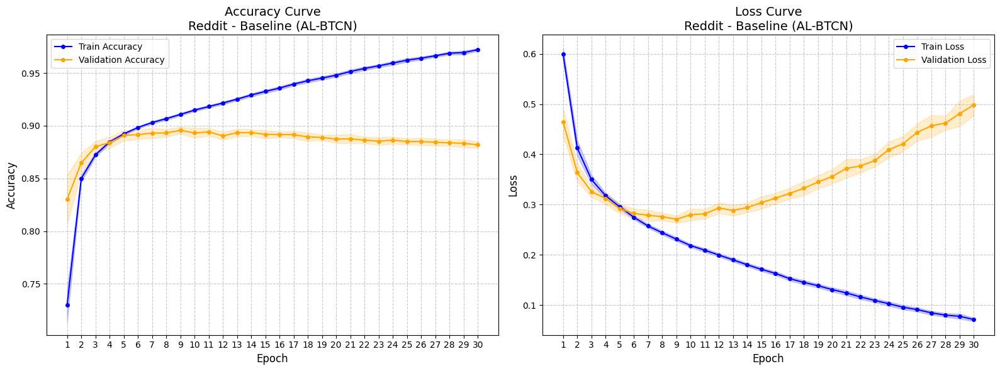

Analysis for Reddit - Baseline (AL-BTCN):
  Min Validation Loss: 0.2711 at Epoch 9
  Final Validation Loss: 0.4983 at Epoch 30
  Observation: Potential Overfitting detected (Validation Loss increased > 5% from minimum).
  Generalization Gap (Train - Val Accuracy) at Epoch 30: 0.0904
------------------------------------------------------------
  Folder not found for model: tcn_model_fine_tune_mb_pool
  Folder not found for model: tcn_model_mb_precompute_pool_adam


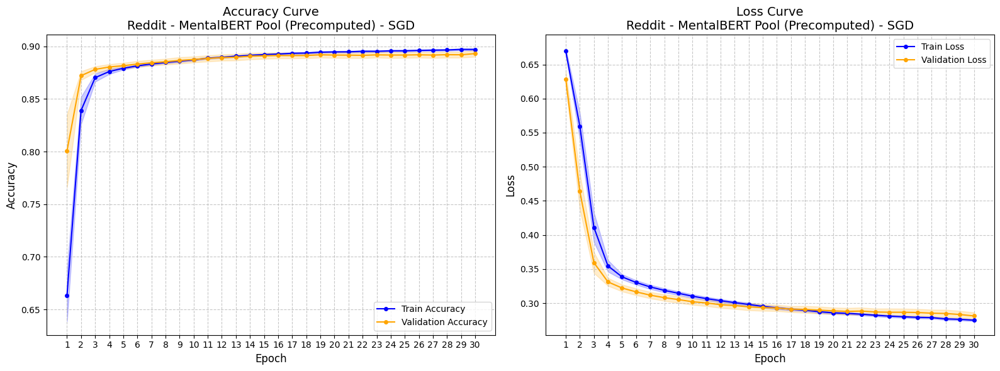

Analysis for Reddit - MentalBERT Pool (Precomputed) - SGD:
  Min Validation Loss: 0.2812 at Epoch 30
  Final Validation Loss: 0.2812 at Epoch 30
  Observation: No significant overfitting detected based on average loss.
  Generalization Gap (Train - Val Accuracy) at Epoch 30: 0.0039
------------------------------------------------------------

>>> Processing Dataset: Twitter


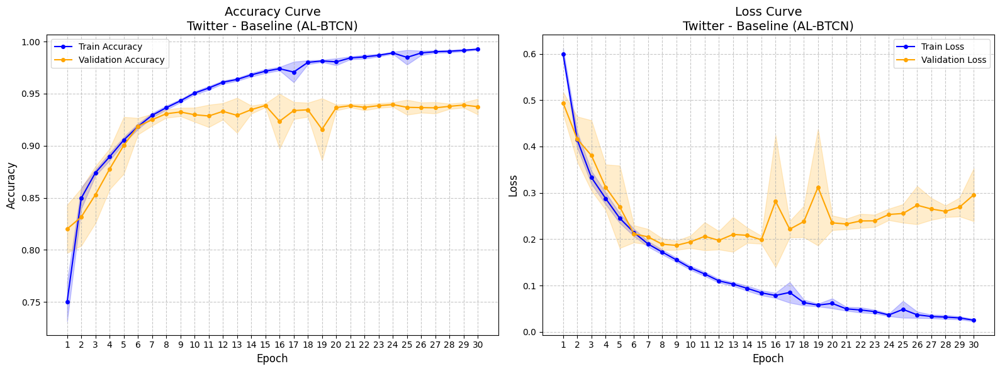

Analysis for Twitter - Baseline (AL-BTCN):
  Min Validation Loss: 0.1867 at Epoch 9
  Final Validation Loss: 0.2959 at Epoch 30
  Observation: Potential Overfitting detected (Validation Loss increased > 5% from minimum).
  Generalization Gap (Train - Val Accuracy) at Epoch 30: 0.0552
------------------------------------------------------------
  Folder not found for model: tcn_model_fine_tune_mb_pool
  Folder not found for model: tcn_model_mb_precompute_pool_adam


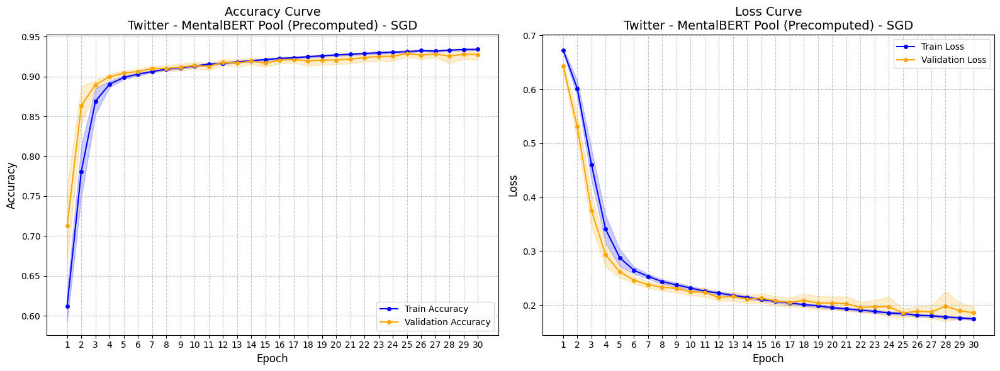

Analysis for Twitter - MentalBERT Pool (Precomputed) - SGD:
  Min Validation Loss: 0.1854 at Epoch 25
  Final Validation Loss: 0.1856 at Epoch 30
  Observation: No significant overfitting detected based on average loss.
  Generalization Gap (Train - Val Accuracy) at Epoch 30: 0.0064
------------------------------------------------------------

>>> Processing Dataset: RedditSNS


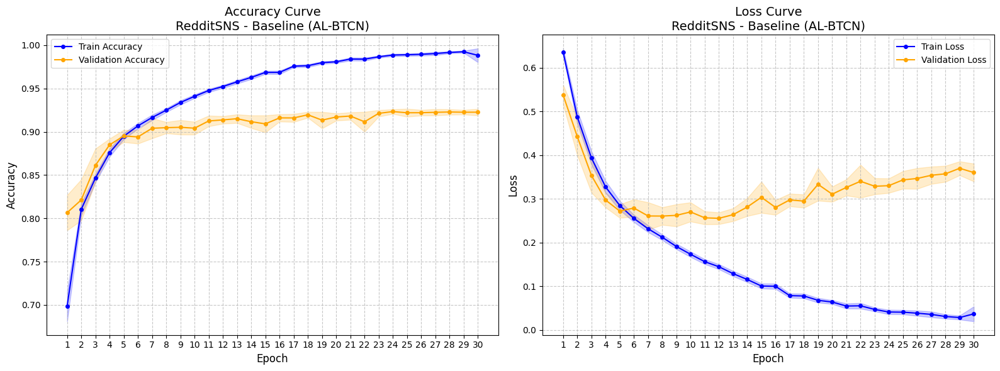

Analysis for RedditSNS - Baseline (AL-BTCN):
  Min Validation Loss: 0.2553 at Epoch 12
  Final Validation Loss: 0.3601 at Epoch 30
  Observation: Potential Overfitting detected (Validation Loss increased > 5% from minimum).
  Generalization Gap (Train - Val Accuracy) at Epoch 30: 0.0657
------------------------------------------------------------
  Folder not found for model: tcn_model_fine_tune_mb_pool
  Folder not found for model: tcn_model_mb_precompute_pool_adam


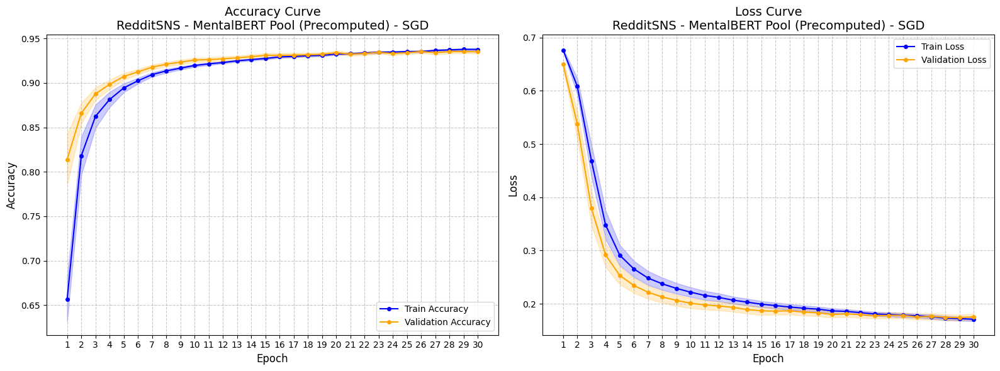

Analysis for RedditSNS - MentalBERT Pool (Precomputed) - SGD:
  Min Validation Loss: 0.1741 at Epoch 29
  Final Validation Loss: 0.1755 at Epoch 30
  Observation: No significant overfitting detected based on average loss.
  Generalization Gap (Train - Val Accuracy) at Epoch 30: 0.0027
------------------------------------------------------------

>>> Processing Dataset: Twitter2


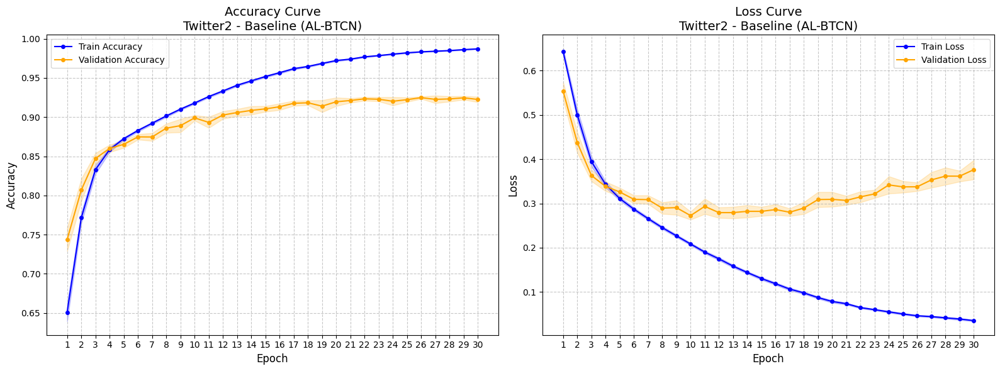

Analysis for Twitter2 - Baseline (AL-BTCN):
  Min Validation Loss: 0.2725 at Epoch 10
  Final Validation Loss: 0.3762 at Epoch 30
  Observation: Potential Overfitting detected (Validation Loss increased > 5% from minimum).
  Generalization Gap (Train - Val Accuracy) at Epoch 30: 0.0645
------------------------------------------------------------
  Folder not found for model: tcn_model_fine_tune_mb_pool
  Folder not found for model: tcn_model_mb_precompute_pool_adam


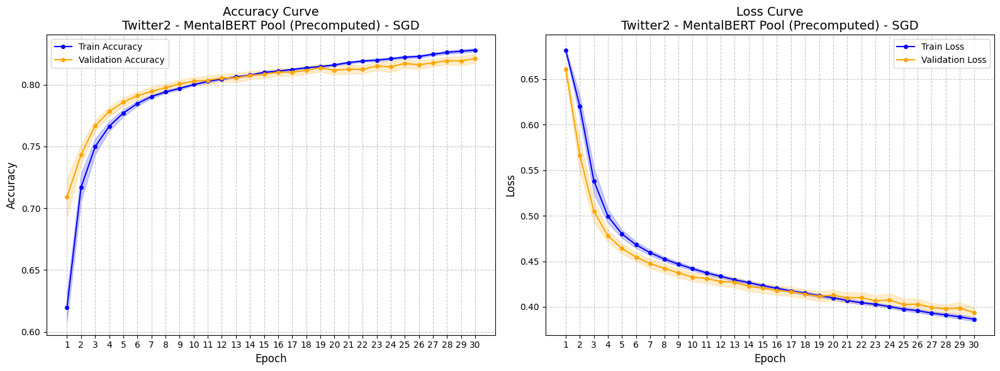

Analysis for Twitter2 - MentalBERT Pool (Precomputed) - SGD:
  Min Validation Loss: 0.3935 at Epoch 30
  Final Validation Loss: 0.3935 at Epoch 30
  Observation: No significant overfitting detected based on average loss.
  Generalization Gap (Train - Val Accuracy) at Epoch 30: 0.0068
------------------------------------------------------------


In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob

# ==========================================
# Configuration
# ==========================================

# Define Base Paths
base_path_30seeds = r'c:\Files\Degree\FYP\FYP_ver5\Results\30seeds_results'

# Define Datasets and their locations
datasets_map = {
    'Reddit': os.path.join(base_path_30seeds, 'Reddit'),
    'Twitter': os.path.join(base_path_30seeds, 'Twitter'),
    'RedditSNS': os.path.join(base_path_30seeds, 'RedditSNS'),
    'Twitter2': os.path.join(base_path_30seeds, 'Twitter2')
}

# Define Models to Analyze (Keywords to match folder suffixes)
target_models = [
    'baseline_algo',
    'tcn_model_fine_tune_mb_pool',
    'tcn_model_mb_precompute_pool_adam',
    'tcn_model_mb_precompute_pool_sgd'
]

# Map keywords to Display Names
model_display_names = {
    'baseline_algo': 'Baseline (AL-BTCN)',
    'tcn_model_fine_tune_mb_pool': 'MentalBERT Pool (Fine-Tuning)',
    'tcn_model_mb_precompute_pool_adam': 'MentalBERT Pool (Precomputed) - Adam',
    'tcn_model_mb_precompute_pool_sgd': 'MentalBERT Pool (Precomputed) - SGD'
}

# ==========================================
# Helper Functions
# ==========================================

def get_model_folder(dataset_path, model_keyword):
    """
    Finds the folder starting with '30S' and ending with the model_keyword.
    """
    if not os.path.exists(dataset_path):
        return None
        
    for folder in os.listdir(dataset_path):
        # Filter for 30 Seeds folders
        if not folder.startswith('30S'):
            continue
            
        # Check if folder ends with the model keyword
        # We strip potential trailing slashes or whitespace
        clean_folder = folder.strip()
        
        # Exact suffix match to avoid confusion (e.g. pool vs pool_ln)
        if clean_folder.endswith(model_keyword):
            return os.path.join(dataset_path, folder)
            
    return None

def load_and_process_history(folder_path):
    """
    Loads training history, normalizes columns, and aggregates by epoch.
    """
    # Find the excel file
    files = glob.glob(os.path.join(folder_path, "*_training_history.xlsx"))
    if not files:
        print(f"  No history file found in {os.path.basename(folder_path)}")
        return None
        
    file_path = files[0]
    # print(f"  Loading {os.path.basename(file_path)}...")
    
    try:
        # Read all sheets
        sheets = pd.read_excel(file_path, sheet_name=None)
        df_list = []
        for _, df in sheets.items():
            df_list.append(df)
        
        if not df_list:
            return None
            
        full_df = pd.concat(df_list, ignore_index=True)
        
        # Normalize Columns
        full_df.columns = [c.lower().strip().replace(' ', '_') for c in full_df.columns]
        
        # Column Mapping
        col_map = {
            'acc': 'accuracy',
            'train_acc': 'accuracy',
            'train_accuracy': 'accuracy',
            'train_loss': 'loss',
            'val_acc': 'val_accuracy',
            'validation_accuracy': 'val_accuracy',
            'validation_loss': 'val_loss'
        }
        full_df.rename(columns=col_map, inplace=True)
        
        # Ensure Epoch column exists
        if 'epoch' not in full_df.columns:
            # If no epoch column, we assume rows are ordered per run.
            # But with concatenated sheets, this is risky.
            # We hope 'epoch' is present.
            print("  'epoch' column missing. Skipping.")
            return None
            
        # Filter Epochs <= 30
        full_df = full_df[full_df['epoch'] <= 30]
        
        return full_df
        
    except Exception as e:
        print(f"  Error reading file: {e}")
        return None

def plot_learning_curves(df, dataset_name, model_name):
    """
    Plots Accuracy and Loss curves with Confidence Intervals.
    """
    # Group by Epoch
    # We calculate mean, std, and count (n) for each epoch
    # This implements per-epoch averaging
    
    metrics = ['accuracy', 'val_accuracy', 'loss', 'val_loss']
    
    # Check if metrics exist
    for m in metrics:
        if m not in df.columns:
            print(f"  Metric '{m}' not found in data.")
            return

    grouped = df.groupby('epoch')[metrics].agg(['mean', 'std', 'count'])
    
    epochs = grouped.index
    
    # Create Figure
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # 1. Accuracy Plot
    ax = axes[0]
    
    # Train Acc
    mean = grouped['accuracy']['mean']
    std = grouped['accuracy']['std']
    n = grouped['accuracy']['count']
    ci = 1.96 * std / np.sqrt(n)
    
    ax.plot(epochs, mean, label='Train Accuracy', color='blue', marker='o', markersize=4)
    ax.fill_between(epochs, mean - ci, mean + ci, color='blue', alpha=0.2)
    
    # Val Acc
    mean_val = grouped['val_accuracy']['mean']
    std_val = grouped['val_accuracy']['std']
    n_val = grouped['val_accuracy']['count']
    ci_val = 1.96 * std_val / np.sqrt(n_val)
    
    ax.plot(epochs, mean_val, label='Validation Accuracy', color='orange', marker='o', markersize=4)
    ax.fill_between(epochs, mean_val - ci_val, mean_val + ci_val, color='orange', alpha=0.2)
    
    ax.set_title(f'Accuracy Curve\n{dataset_name} - {model_name}', fontsize=14)
    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('Accuracy', fontsize=12)
    ax.set_xticks(np.arange(1, 31, 1))
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7)
    
    # 2. Loss Plot
    ax = axes[1]
    
    # Train Loss
    mean = grouped['loss']['mean']
    std = grouped['loss']['std']
    n = grouped['loss']['count']
    ci = 1.96 * std / np.sqrt(n)
    
    ax.plot(epochs, mean, label='Train Loss', color='blue', marker='o', markersize=4)
    ax.fill_between(epochs, mean - ci, mean + ci, color='blue', alpha=0.2)
    
    # Val Loss
    mean_val = grouped['val_loss']['mean']
    std_val = grouped['val_loss']['std']
    n_val = grouped['val_loss']['count']
    ci_val = 1.96 * std_val / np.sqrt(n_val)
    
    ax.plot(epochs, mean_val, label='Validation Loss', color='orange', marker='o', markersize=4)
    ax.fill_between(epochs, mean_val - ci_val, mean_val + ci_val, color='orange', alpha=0.2)
    
    ax.set_title(f'Loss Curve\n{dataset_name} - {model_name}', fontsize=14)
    ax.set_xlabel('Epoch', fontsize=12)
    ax.set_ylabel('Loss', fontsize=12)
    ax.set_xticks(np.arange(1, 31, 1))
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7)
    
    plt.tight_layout()
    plt.show()
    
    # Analysis Text
    print(f"Analysis for {dataset_name} - {model_name}:")
    # Check for Overfitting: Val Loss increases while Train Loss decreases
    # Simple heuristic: Compare min val loss epoch vs final epoch
    min_val_loss_idx = grouped['val_loss']['mean'].idxmin()
    min_val_loss = grouped['val_loss']['mean'].min()
    final_epoch = epochs.max()
    final_val_loss = grouped['val_loss']['mean'].loc[final_epoch]
    
    print(f"  Min Validation Loss: {min_val_loss:.4f} at Epoch {min_val_loss_idx}")
    print(f"  Final Validation Loss: {final_val_loss:.4f} at Epoch {final_epoch}")
    
    if final_val_loss > min_val_loss * 1.05: # 5% threshold
        print("  Observation: Potential Overfitting detected (Validation Loss increased > 5% from minimum).")
    else:
        print("  Observation: No significant overfitting detected based on average loss.")
        
    # Check Generalization Gap
    train_acc_final = grouped['accuracy']['mean'].loc[final_epoch]
    val_acc_final = grouped['val_accuracy']['mean'].loc[final_epoch]
    gap = train_acc_final - val_acc_final
    print(f"  Generalization Gap (Train - Val Accuracy) at Epoch {final_epoch}: {gap:.4f}")
    print("-" * 60)


# ==========================================
# Main Execution
# ==========================================

print("Starting Overfitting & Generalization Analysis...")
print("=" * 60)

for dataset_name, dataset_path in datasets_map.items():
    print(f"\n>>> Processing Dataset: {dataset_name}")
    
    for model_keyword in target_models:
        folder_path = get_model_folder(dataset_path, model_keyword)
        
        if folder_path:
            # print(f"Found folder: {os.path.basename(folder_path)}")
            df = load_and_process_history(folder_path)
            
            if df is not None and not df.empty:
                display_name = model_display_names.get(model_keyword, model_keyword)
                plot_learning_curves(df, dataset_name, display_name)
            else:
                print(f"  No valid data found for {model_keyword}")
        else:
            print(f"  Folder not found for model: {model_keyword}")

Starting Comprehensive Overfitting & Generalization Analysis...

>>> Processing Dataset: Reddit


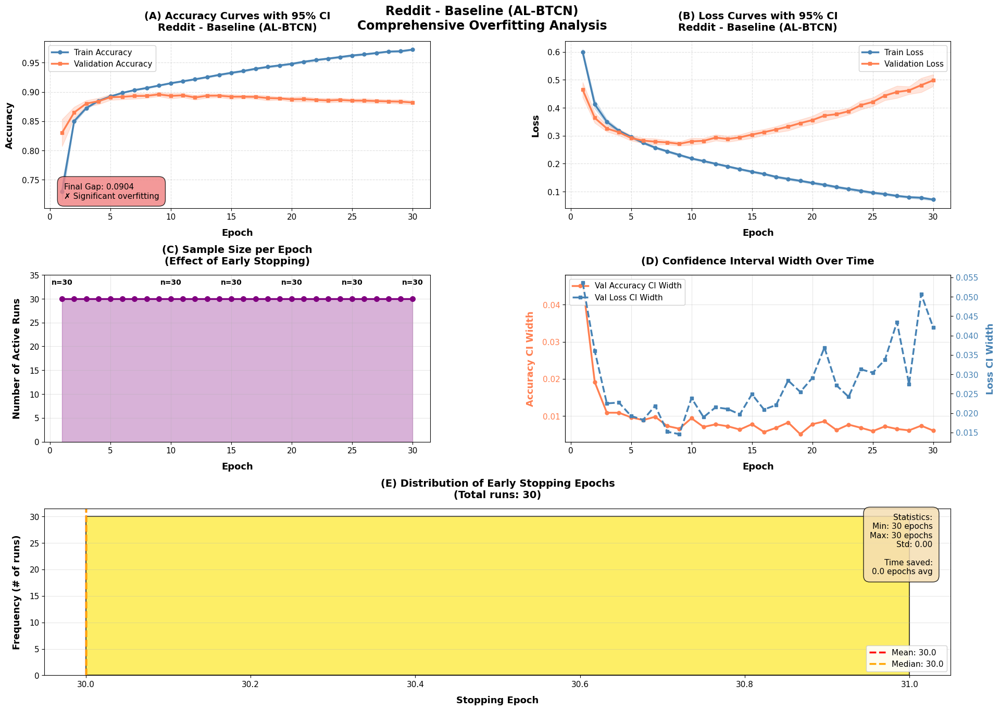


ANALYSIS: Reddit - Baseline (AL-BTCN)
Min Validation Loss: 0.2711 at Epoch 9
Final Validation Loss: 0.4983 at Epoch 30
⚠ WARNING: Validation loss increased >5% from minimum (potential overfitting)

Generalization Gap (Train - Val Acc): 0.0904
✗ Poor generalization (gap >= 5%)

Early Stopping Statistics:
  Mean stopping epoch: 30.0
  Median stopping epoch: 30.0
  Range: 30-30 epochs
  Std: 0.00
  Epochs saved (avg): 0.0

  Folder not found for model: tcn_model_fine_tune_mb_pool
  Folder not found for model: tcn_model_mb_precompute_pool_adam


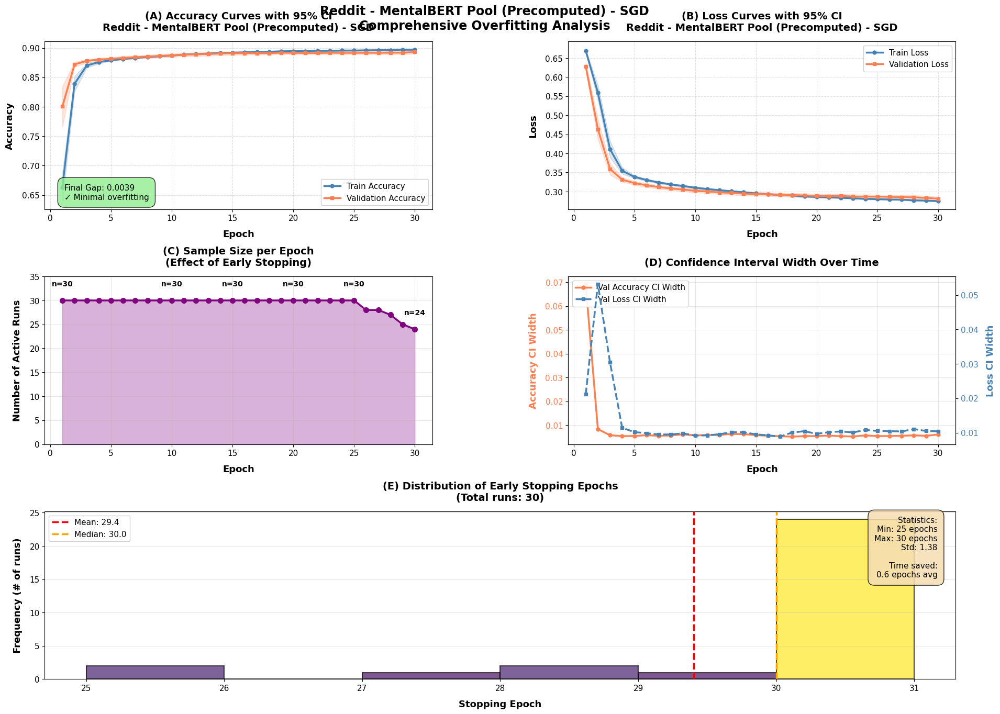


ANALYSIS: Reddit - MentalBERT Pool (Precomputed) - SGD
Min Validation Loss: 0.2812 at Epoch 30
Final Validation Loss: 0.2812 at Epoch 30
✓ No significant overfitting detected

Generalization Gap (Train - Val Acc): 0.0039
✓ Excellent generalization (gap < 2%)

Early Stopping Statistics:
  Mean stopping epoch: 29.4
  Median stopping epoch: 30.0
  Range: 25-30 epochs
  Std: 1.38
  Epochs saved (avg): 0.6


>>> Processing Dataset: Twitter


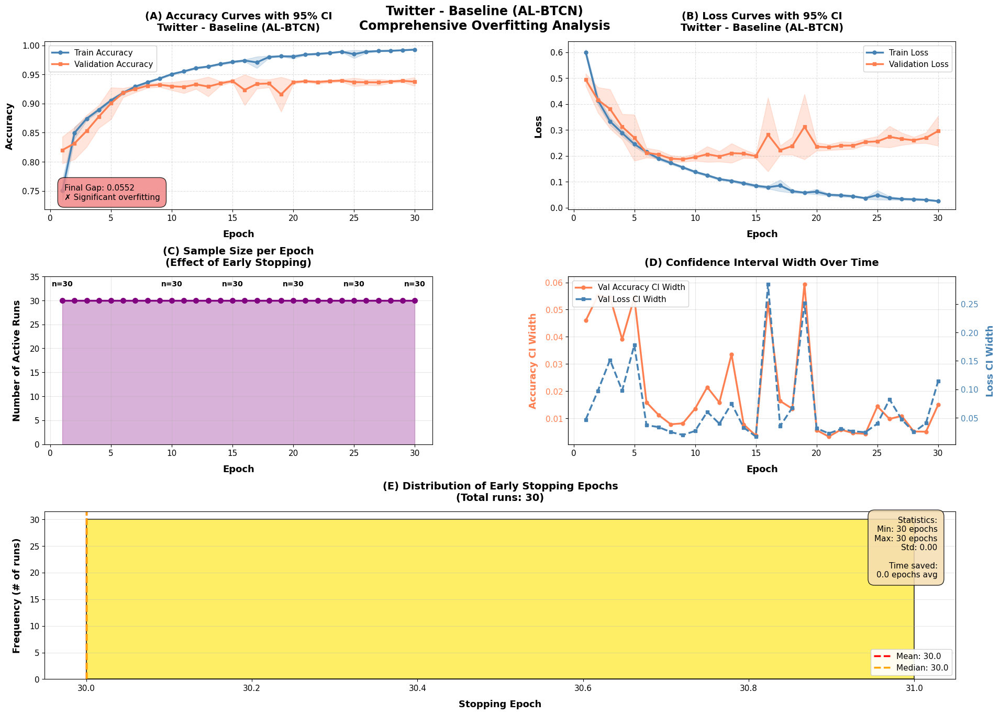


ANALYSIS: Twitter - Baseline (AL-BTCN)
Min Validation Loss: 0.1867 at Epoch 9
Final Validation Loss: 0.2959 at Epoch 30
⚠ WARNING: Validation loss increased >5% from minimum (potential overfitting)

Generalization Gap (Train - Val Acc): 0.0552
✗ Poor generalization (gap >= 5%)

Early Stopping Statistics:
  Mean stopping epoch: 30.0
  Median stopping epoch: 30.0
  Range: 30-30 epochs
  Std: 0.00
  Epochs saved (avg): 0.0

  Folder not found for model: tcn_model_fine_tune_mb_pool
  Folder not found for model: tcn_model_mb_precompute_pool_adam


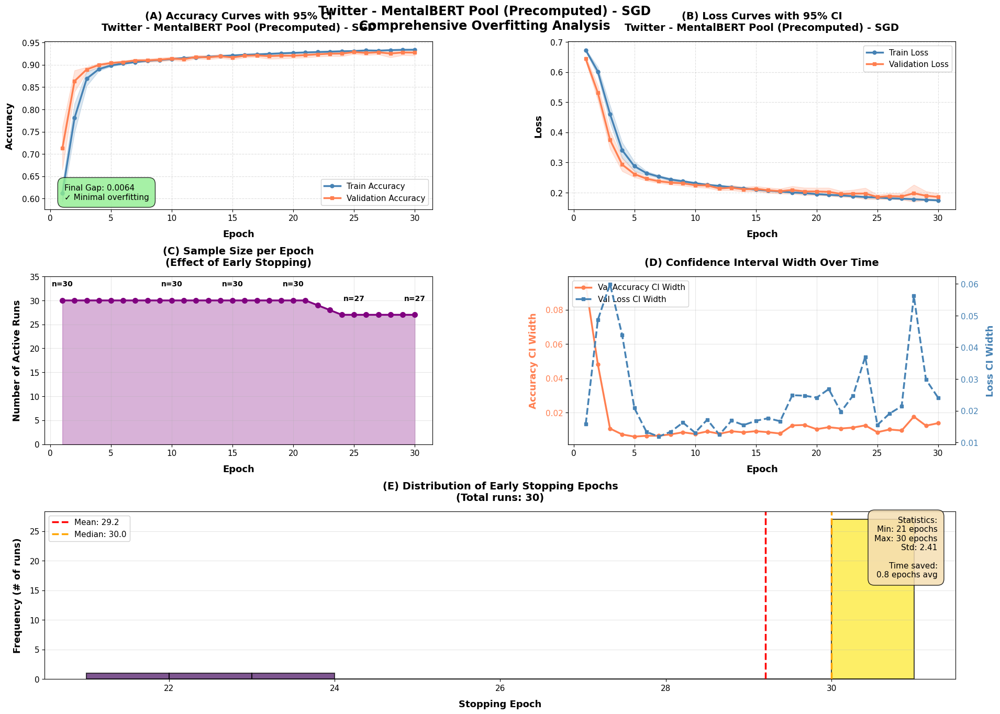


ANALYSIS: Twitter - MentalBERT Pool (Precomputed) - SGD
Min Validation Loss: 0.1854 at Epoch 25
Final Validation Loss: 0.1856 at Epoch 30
✓ No significant overfitting detected

Generalization Gap (Train - Val Acc): 0.0064
✓ Excellent generalization (gap < 2%)

Early Stopping Statistics:
  Mean stopping epoch: 29.2
  Median stopping epoch: 30.0
  Range: 21-30 epochs
  Std: 2.41
  Epochs saved (avg): 0.8


>>> Processing Dataset: RedditSNS


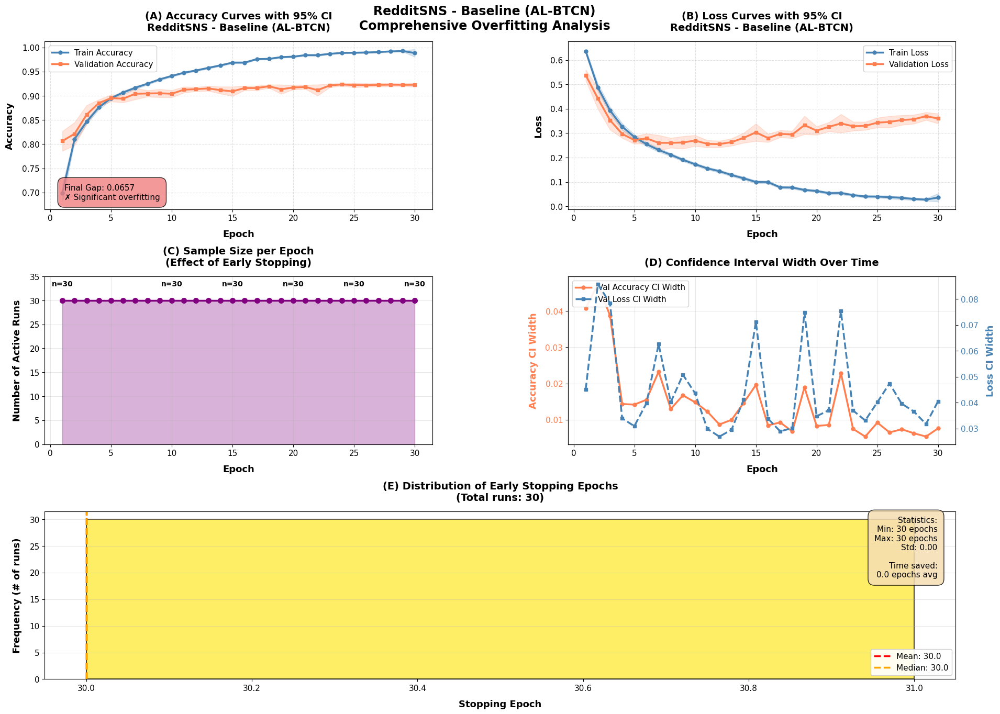


ANALYSIS: RedditSNS - Baseline (AL-BTCN)
Min Validation Loss: 0.2553 at Epoch 12
Final Validation Loss: 0.3601 at Epoch 30
⚠ WARNING: Validation loss increased >5% from minimum (potential overfitting)

Generalization Gap (Train - Val Acc): 0.0657
✗ Poor generalization (gap >= 5%)

Early Stopping Statistics:
  Mean stopping epoch: 30.0
  Median stopping epoch: 30.0
  Range: 30-30 epochs
  Std: 0.00
  Epochs saved (avg): 0.0

  Folder not found for model: tcn_model_fine_tune_mb_pool
  Folder not found for model: tcn_model_mb_precompute_pool_adam


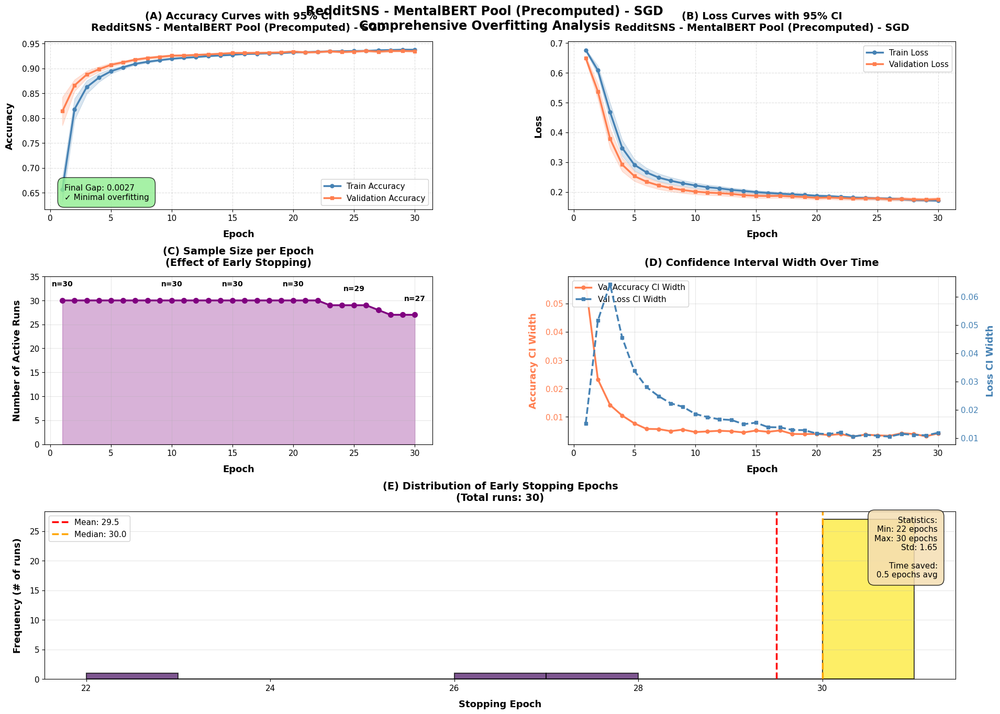


ANALYSIS: RedditSNS - MentalBERT Pool (Precomputed) - SGD
Min Validation Loss: 0.1741 at Epoch 29
Final Validation Loss: 0.1755 at Epoch 30
✓ No significant overfitting detected

Generalization Gap (Train - Val Acc): 0.0027
✓ Excellent generalization (gap < 2%)

Early Stopping Statistics:
  Mean stopping epoch: 29.5
  Median stopping epoch: 30.0
  Range: 22-30 epochs
  Std: 1.65
  Epochs saved (avg): 0.5


>>> Processing Dataset: Twitter2


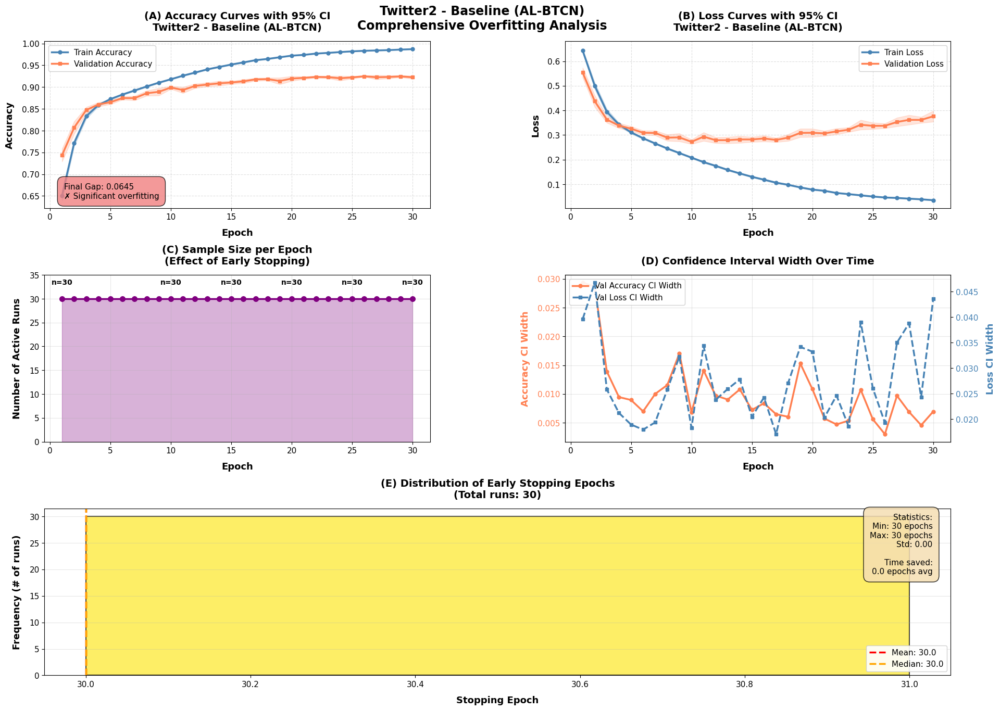


ANALYSIS: Twitter2 - Baseline (AL-BTCN)
Min Validation Loss: 0.2725 at Epoch 10
Final Validation Loss: 0.3762 at Epoch 30
⚠ WARNING: Validation loss increased >5% from minimum (potential overfitting)

Generalization Gap (Train - Val Acc): 0.0645
✗ Poor generalization (gap >= 5%)

Early Stopping Statistics:
  Mean stopping epoch: 30.0
  Median stopping epoch: 30.0
  Range: 30-30 epochs
  Std: 0.00
  Epochs saved (avg): 0.0

  Folder not found for model: tcn_model_fine_tune_mb_pool
  Folder not found for model: tcn_model_mb_precompute_pool_adam


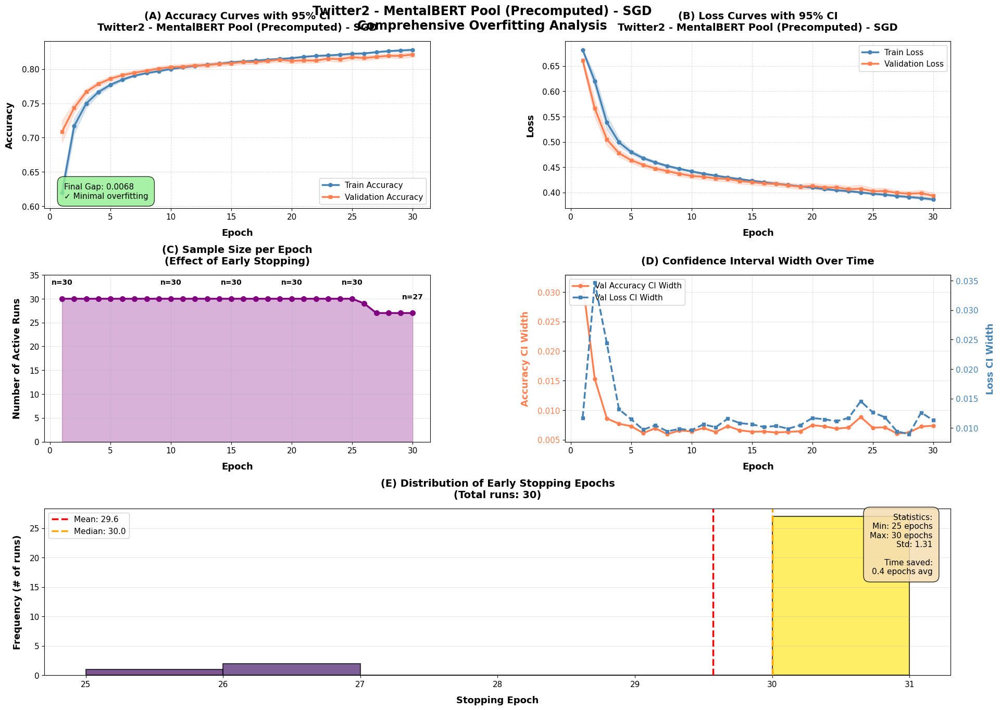


ANALYSIS: Twitter2 - MentalBERT Pool (Precomputed) - SGD
Min Validation Loss: 0.3935 at Epoch 30
Final Validation Loss: 0.3935 at Epoch 30
✓ No significant overfitting detected

Generalization Gap (Train - Val Acc): 0.0068
✓ Excellent generalization (gap < 2%)

Early Stopping Statistics:
  Mean stopping epoch: 29.6
  Median stopping epoch: 30.0
  Range: 25-30 epochs
  Std: 1.31
  Epochs saved (avg): 0.4


Analysis Complete!


In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob
from scipy import stats

# ==========================================
# Configuration
# ==========================================

# Define Base Paths
base_path_30seeds = r'c:\Files\Degree\FYP\FYP_ver5\Results\30seeds_results'

# Define Datasets and their locations
datasets_map = {
    'Reddit': os.path.join(base_path_30seeds, 'Reddit'),
    'Twitter': os.path.join(base_path_30seeds, 'Twitter'),
    'RedditSNS': os.path.join(base_path_30seeds, 'RedditSNS'),
    'Twitter2': os.path.join(base_path_30seeds, 'Twitter2')
}

# Define Models to Analyze
target_models = [
    'baseline_algo',
    'tcn_model_fine_tune_mb_pool',
    'tcn_model_mb_precompute_pool_adam',
    'tcn_model_mb_precompute_pool_sgd'
]

# Map keywords to Display Names
model_display_names = {
    'baseline_algo': 'Baseline (AL-BTCN)',
    'tcn_model_fine_tune_mb_pool': 'MentalBERT Pool (Fine-Tuning)',
    'tcn_model_mb_precompute_pool_adam': 'MentalBERT Pool (Precomputed) - Adam',
    'tcn_model_mb_precompute_pool_sgd': 'MentalBERT Pool (Precomputed) - SGD'
}

# ==========================================
# Helper Functions
# ==========================================

def get_model_folder(dataset_path, model_keyword):
    """
    Finds the folder starting with '30S' and ending with the model_keyword.
    """
    if not os.path.exists(dataset_path):
        return None
        
    for folder in os.listdir(dataset_path):
        if not folder.startswith('30S'):
            continue
            
        clean_folder = folder.strip()
        
        if clean_folder.endswith(model_keyword):
            return os.path.join(dataset_path, folder)
            
    return None


def load_and_process_history(folder_path):
    """
    Loads training history, normalizes columns, and aggregates by epoch.
    Returns: DataFrame with columns [epoch, seed, fold, accuracy, val_accuracy, loss, val_loss]
    """
    files = glob.glob(os.path.join(folder_path, "*_training_history.xlsx"))
    if not files:
        print(f"  No history file found in {os.path.basename(folder_path)}")
        return None
        
    file_path = files[0]
    
    try:
        # Read all sheets (each sheet = one seed×fold combination)
        sheets = pd.read_excel(file_path, sheet_name=None)
        df_list = []
        
        for sheet_name, df in sheets.items():
            # Try to extract seed and fold from sheet name
            # Expected format: "Seed_X_Fold_Y" or similar
            try:
                parts = sheet_name.split('_')
                seed = int([p for p in parts if p.isdigit()][0])
                fold = int([p for p in parts if p.isdigit()][1]) if len([p for p in parts if p.isdigit()]) > 1 else 0
            except:
                # If parsing fails, assign incrementally
                seed = len(df_list) // 5
                fold = len(df_list) % 5
            
            df['seed'] = seed
            df['fold'] = fold
            df_list.append(df)
        
        if not df_list:
            return None
            
        full_df = pd.concat(df_list, ignore_index=True)
        
        # Normalize Columns
        full_df.columns = [c.lower().strip().replace(' ', '_') for c in full_df.columns]
        
        # Column Mapping
        col_map = {
            'acc': 'accuracy',
            'train_acc': 'accuracy',
            'train_accuracy': 'accuracy',
            'train_loss': 'loss',
            'val_acc': 'val_accuracy',
            'validation_accuracy': 'val_accuracy',
            'validation_loss': 'val_loss'
        }
        full_df.rename(columns=col_map, inplace=True)
        
        # Ensure required columns exist
        required_cols = ['epoch', 'accuracy', 'val_accuracy', 'loss', 'val_loss']
        for col in required_cols:
            if col not in full_df.columns:
                print(f"  Missing required column: {col}")
                return None
        
        # Filter Epochs <= 30
        full_df = full_df[full_df['epoch'] <= 30]
        
        return full_df
        
    except Exception as e:
        print(f"  Error reading file: {e}")
        return None


def plot_learning_curves_comprehensive(df, dataset_name, model_name):
    """
    Enhanced plot with better padding and spacing.
    """
    metrics = ['accuracy', 'val_accuracy', 'loss', 'val_loss']
    
    # Check if metrics exist
    for m in metrics:
        if m not in df.columns:
            print(f"  Metric '{m}' not found in data.")
            return

    # Group by Epoch for per-epoch averaging
    grouped = df.groupby('epoch')[metrics].agg(['mean', 'std', 'count'])
    
    epochs = grouped.index
    
    # Create comprehensive figure with MORE PADDING
    fig = plt.figure(figsize=(20, 14))  # Increased figure size
    gs = fig.add_gridspec(3, 2, hspace=0.4, wspace=0.35,  # Increased spacing
                          left=0.08, right=0.95,  # More left/right padding
                          top=0.93, bottom=0.06)  # More top/bottom padding
    
    # ========================================
    # Plot 1: Accuracy with CI
    # ========================================
    ax1 = fig.add_subplot(gs[0, 0])
    
    # Train Accuracy
    mean_train = grouped['accuracy']['mean']
    std_train = grouped['accuracy']['std']
    n_train = grouped['accuracy']['count']
    se_train = std_train / np.sqrt(n_train)
    ci_train = 1.96 * se_train
    
    ax1.plot(epochs, mean_train, label='Train Accuracy', 
            color='steelblue', linewidth=2.5, marker='o', markersize=5)
    ax1.fill_between(epochs, mean_train - ci_train, mean_train + ci_train, 
                     color='steelblue', alpha=0.2)
    
    # Val Accuracy
    mean_val = grouped['val_accuracy']['mean']
    std_val = grouped['val_accuracy']['std']
    n_val = grouped['val_accuracy']['count']
    se_val = std_val / np.sqrt(n_val)
    ci_val = 1.96 * se_val
    
    ax1.plot(epochs, mean_val, label='Validation Accuracy', 
            color='coral', linewidth=2.5, marker='s', markersize=5)
    ax1.fill_between(epochs, mean_val - ci_val, mean_val + ci_val, 
                     color='coral', alpha=0.2)
    
    ax1.set_title(f'(A) Accuracy Curves with 95% CI\n{dataset_name} - {model_name}', 
                 fontsize=14, fontweight='bold', pad=15)  # Added pad
    ax1.set_xlabel('Epoch', fontsize=13, fontweight='bold', labelpad=10)  # Added labelpad
    ax1.set_ylabel('Accuracy', fontsize=13, fontweight='bold', labelpad=10)
    ax1.legend(fontsize=11, framealpha=0.9)
    ax1.grid(True, linestyle='--', alpha=0.4)
    ax1.tick_params(axis='both', labelsize=11)  # Larger tick labels
    
    # Add generalization gap annotation
    final_epoch = epochs.max()
    final_gap = mean_train.loc[final_epoch] - mean_val.loc[final_epoch]
    
    textstr = f'Final Gap: {final_gap:.4f}\n'
    if final_gap < 0.02:
        textstr += '✓ Minimal overfitting'
        box_color = 'lightgreen'
    elif final_gap < 0.05:
        textstr += '⚠ Moderate overfitting'
        box_color = 'yellow'
    else:
        textstr += '✗ Significant overfitting'
        box_color = 'lightcoral'
    
    ax1.text(0.05, 0.05, textstr, transform=ax1.transAxes, 
            fontsize=11, verticalalignment='bottom',
            bbox=dict(boxstyle='round', facecolor=box_color, alpha=0.8, pad=0.8))
    
    # ========================================
    # Plot 2: Loss with CI
    # ========================================
    ax2 = fig.add_subplot(gs[0, 1])
    
    # Train Loss
    mean_train = grouped['loss']['mean']
    std_train = grouped['loss']['std']
    n_train = grouped['loss']['count']
    se_train = std_train / np.sqrt(n_train)
    ci_train = 1.96 * se_train
    
    ax2.plot(epochs, mean_train, label='Train Loss', 
            color='steelblue', linewidth=2.5, marker='o', markersize=5)
    ax2.fill_between(epochs, mean_train - ci_train, mean_train + ci_train, 
                     color='steelblue', alpha=0.2)
    
    # Val Loss
    mean_val = grouped['val_loss']['mean']
    std_val = grouped['val_loss']['std']
    n_val = grouped['val_loss']['count']
    se_val = std_val / np.sqrt(n_val)
    ci_val = 1.96 * se_val
    
    ax2.plot(epochs, mean_val, label='Validation Loss', 
            color='coral', linewidth=2.5, marker='s', markersize=5)
    ax2.fill_between(epochs, mean_val - ci_val, mean_val + ci_val, 
                     color='coral', alpha=0.2)
    
    ax2.set_title(f'(B) Loss Curves with 95% CI\n{dataset_name} - {model_name}', 
                 fontsize=14, fontweight='bold', pad=15)
    ax2.set_xlabel('Epoch', fontsize=13, fontweight='bold', labelpad=10)
    ax2.set_ylabel('Loss', fontsize=13, fontweight='bold', labelpad=10)
    ax2.legend(fontsize=11, framealpha=0.9)
    ax2.grid(True, linestyle='--', alpha=0.4)
    ax2.tick_params(axis='both', labelsize=11)
    
    # ========================================
    # Plot 3: Sample Size per Epoch
    # ========================================
    ax3 = fig.add_subplot(gs[1, 0])
    
    sample_sizes = grouped['accuracy']['count']
    
    ax3.plot(epochs, sample_sizes, marker='o', linewidth=2.5, 
            color='purple', markersize=7)
    ax3.fill_between(epochs, 0, sample_sizes, alpha=0.3, color='purple')
    
    ax3.set_xlabel('Epoch', fontsize=13, fontweight='bold', labelpad=10)
    ax3.set_ylabel('Number of Active Runs', fontsize=13, fontweight='bold', labelpad=10)
    ax3.set_title('(C) Sample Size per Epoch\n(Effect of Early Stopping)', 
                 fontsize=14, fontweight='bold', pad=15)
    ax3.grid(alpha=0.3)
    ax3.set_ylim([0, sample_sizes.max() + 5])
    ax3.tick_params(axis='both', labelsize=11)
    
    # Annotate key epochs with better positioning
    for epoch in [1, 10, 15, 20, 25, 30]:
        if epoch in sample_sizes.index and epoch <= epochs.max():
            n = sample_sizes.loc[epoch]
            ax3.annotate(f'n={int(n)}', xy=(epoch, n), 
                        xytext=(epoch, n + 3),  # More offset
                        fontsize=10, ha='center', fontweight='bold')
    
    # ========================================
    # Plot 4: CI Width Over Time
    # ========================================
    ax4 = fig.add_subplot(gs[1, 1])
    
    ci_width_acc = 2 * 1.96 * (grouped['val_accuracy']['std'] / np.sqrt(grouped['val_accuracy']['count']))
    ci_width_loss = 2 * 1.96 * (grouped['val_loss']['std'] / np.sqrt(grouped['val_loss']['count']))
    
    ax4_twin = ax4.twinx()
    
    line1 = ax4.plot(epochs, ci_width_acc, label='Val Accuracy CI Width', 
                    color='coral', linewidth=2.5, marker='o', markersize=5)
    line2 = ax4_twin.plot(epochs, ci_width_loss, label='Val Loss CI Width', 
                         color='steelblue', linewidth=2.5, marker='s', linestyle='--', markersize=5)
    
    ax4.set_xlabel('Epoch', fontsize=13, fontweight='bold', labelpad=10)
    ax4.set_ylabel('Accuracy CI Width', fontsize=13, fontweight='bold', color='coral', labelpad=10)
    ax4_twin.set_ylabel('Loss CI Width', fontsize=13, fontweight='bold', color='steelblue', labelpad=10)
    ax4.set_title('(D) Confidence Interval Width Over Time', fontsize=14, fontweight='bold', pad=15)
    ax4.tick_params(axis='y', labelcolor='coral', labelsize=11)
    ax4_twin.tick_params(axis='y', labelcolor='steelblue', labelsize=11)
    ax4.tick_params(axis='x', labelsize=11)
    ax4.grid(alpha=0.3)
    
    lines = line1 + line2
    labels = [l.get_label() for l in lines]
    ax4.legend(lines, labels, loc='upper left', fontsize=11, framealpha=0.9)
    
    # ========================================
    # Plot 5: Early Stopping Distribution
    # ========================================
    ax5 = fig.add_subplot(gs[2, :])
    
    # Calculate stopping epoch for each run
    stop_epochs = df.groupby(['seed', 'fold'])['epoch'].max().values
    
    bins = range(int(stop_epochs.min()), int(stop_epochs.max()) + 2)
    counts, edges, patches = ax5.hist(stop_epochs, bins=bins, 
                                     alpha=0.7, color='teal', edgecolor='black', linewidth=1.5)
    
    # Color by frequency
    max_count = max(counts)
    for count, patch in zip(counts, patches):
        patch.set_facecolor(plt.cm.viridis(count / max_count))
    
    mean_stop = np.mean(stop_epochs)
    median_stop = np.median(stop_epochs)
    
    ax5.axvline(mean_stop, color='red', linestyle='--', linewidth=2.5, 
               label=f'Mean: {mean_stop:.1f}')
    ax5.axvline(median_stop, color='orange', linestyle='--', linewidth=2.5, 
               label=f'Median: {median_stop:.1f}')
    
    ax5.set_xlabel('Stopping Epoch', fontsize=13, fontweight='bold', labelpad=10)
    ax5.set_ylabel('Frequency (# of runs)', fontsize=13, fontweight='bold', labelpad=10)
    ax5.set_title(f'(E) Distribution of Early Stopping Epochs\n(Total runs: {len(stop_epochs)})', 
                 fontsize=14, fontweight='bold', pad=15)
    ax5.legend(fontsize=11, framealpha=0.9)
    ax5.grid(alpha=0.3, axis='y')
    ax5.tick_params(axis='both', labelsize=11)
    
    # Statistics box with better positioning
    textstr = f'Statistics:\n'
    textstr += f'Min: {int(stop_epochs.min())} epochs\n'
    textstr += f'Max: {int(stop_epochs.max())} epochs\n'
    textstr += f'Std: {np.std(stop_epochs):.2f}\n'
    textstr += f'\nTime saved:\n{30 - mean_stop:.1f} epochs avg'
    
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.85, pad=0.8)
    ax5.text(0.98, 0.97, textstr, transform=ax5.transAxes, fontsize=11,
            verticalalignment='top', horizontalalignment='right', bbox=props)
    
    plt.suptitle(f'{dataset_name} - {model_name}\nComprehensive Overfitting Analysis',
                fontsize=17, fontweight='bold', y=0.98)  # Adjusted y position
    
    # Save figure with tight layout
    safe_name = f"{dataset_name}_{model_name}".replace(' ', '_').replace('(', '').replace(')', '')
    plt.savefig(f'learning_curves_{safe_name}.png', dpi=300, bbox_inches='tight', pad_inches=0.3)  # Added pad_inches
    plt.show()
    
    # ========================================
    # Print Analysis
    # ========================================
    print(f"\n{'='*70}")
    print(f"ANALYSIS: {dataset_name} - {model_name}")
    print(f"{'='*70}")
    
    # Overfitting check
    min_val_loss_epoch = grouped['val_loss']['mean'].idxmin()
    min_val_loss = grouped['val_loss']['mean'].min()
    final_val_loss = grouped['val_loss']['mean'].loc[final_epoch]
    
    print(f"Min Validation Loss: {min_val_loss:.4f} at Epoch {min_val_loss_epoch}")
    print(f"Final Validation Loss: {final_val_loss:.4f} at Epoch {final_epoch}")
    
    if final_val_loss > min_val_loss * 1.05:
        print("⚠ WARNING: Validation loss increased >5% from minimum (potential overfitting)")
    else:
        print("✓ No significant overfitting detected")
    
    # Generalization gap
    train_acc_final = grouped['accuracy']['mean'].loc[final_epoch]
    val_acc_final = grouped['val_accuracy']['mean'].loc[final_epoch]
    gap = train_acc_final - val_acc_final
    
    print(f"\nGeneralization Gap (Train - Val Acc): {gap:.4f}")
    
    if gap < 0.02:
        print("✓ Excellent generalization (gap < 2%)")
    elif gap < 0.05:
        print("⚠ Acceptable generalization (gap < 5%)")
    else:
        print("✗ Poor generalization (gap >= 5%)")
    
    # Early stopping stats
    print(f"\nEarly Stopping Statistics:")
    print(f"  Mean stopping epoch: {mean_stop:.1f}")
    print(f"  Median stopping epoch: {median_stop:.1f}")
    print(f"  Range: {int(stop_epochs.min())}-{int(stop_epochs.max())} epochs")
    print(f"  Std: {np.std(stop_epochs):.2f}")
    print(f"  Epochs saved (avg): {30 - mean_stop:.1f}")
    
    print(f"{'='*70}\n")


# ==========================================
# Main Execution
# ==========================================

print("Starting Comprehensive Overfitting & Generalization Analysis...")
print("=" * 70)

for dataset_name, dataset_path in datasets_map.items():
    print(f"\n>>> Processing Dataset: {dataset_name}")
    
    for model_keyword in target_models:
        folder_path = get_model_folder(dataset_path, model_keyword)
        
        if folder_path:
            df = load_and_process_history(folder_path)
            
            if df is not None and not df.empty:
                display_name = model_display_names.get(model_keyword, model_keyword)
                plot_learning_curves_comprehensive(df, dataset_name, display_name)
            else:
                print(f"  No valid data found for {model_keyword}")
        else:
            print(f"  Folder not found for model: {model_keyword}")

print("\n" + "=" * 70)
print("Analysis Complete!")
print("=" * 70)


Statistical Analysis: Reddit - Accuracy

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: 0.0114
95% Confidence Interval: (0.0092, 0.0136)
Cohen's d: 1.9645
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=10.7601, p-value=0.0000
Result (T-Test): Reject H0 (Significant Improvement) - greater
Wilcoxon Test: statistic=465.0000, p-value=0.0000
Result (Wilcoxon): Reject H0 (Significant Improvement) - greater
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=10.7601, p-value=0.0000
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=0.0000, p-value=0.0000
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

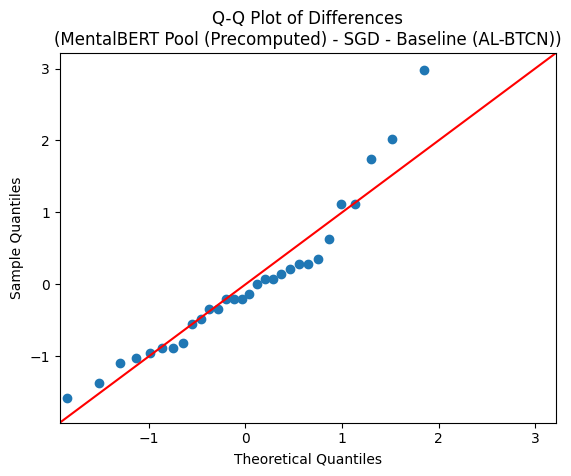


Statistical Analysis: Reddit - Precision

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: -0.0113
95% Confidence Interval: (-0.0162, -0.0064)
Cohen's d: -0.8645
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=-4.7353, p-value=1.0000
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=46.0000, p-value=1.0000
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-4.7353, p-value=0.0001
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=46.0000, p-value=0.0000
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

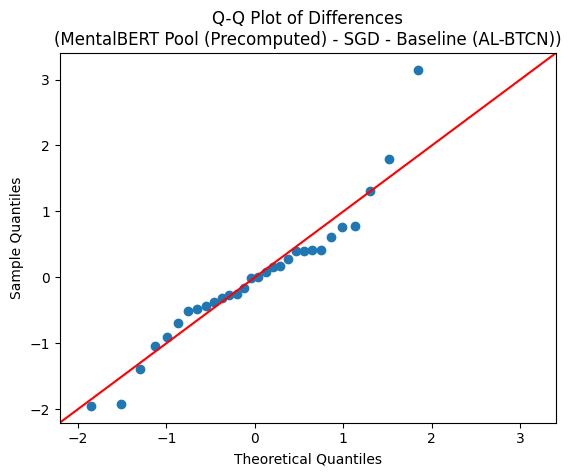


Statistical Analysis: Reddit - Recall

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: 0.0419
95% Confidence Interval: (0.0325, 0.0512)
Cohen's d: 1.6689
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=9.1411, p-value=0.0000
Result (T-Test): Reject H0 (Significant Improvement) - greater
Wilcoxon Test: statistic=432.0000, p-value=0.0000
Result (Wilcoxon): Reject H0 (Significant Improvement) - greater
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=9.1411, p-value=0.0000
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=3.0000, p-value=0.0000
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

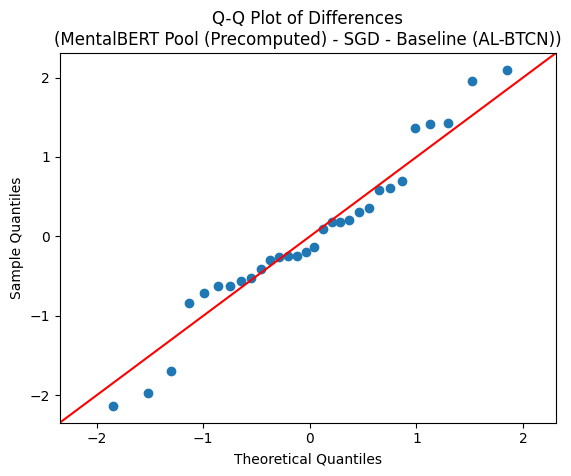


Statistical Analysis: Reddit - F1-Score

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: 0.0138
95% Confidence Interval: (0.0112, 0.0163)
Cohen's d: 1.9903
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=10.9013, p-value=0.0000
Result (T-Test): Reject H0 (Significant Improvement) - greater
Wilcoxon Test: statistic=465.0000, p-value=0.0000
Result (Wilcoxon): Reject H0 (Significant Improvement) - greater
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=10.9013, p-value=0.0000
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=0.0000, p-value=0.0000
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

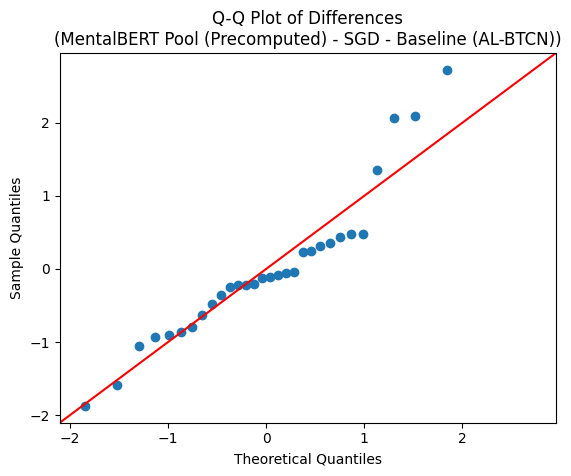


Statistical Analysis: Twitter - Accuracy

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: -0.0040
95% Confidence Interval: (-0.0116, 0.0036)
Cohen's d: -0.1976
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=-1.0824, p-value=0.8560
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=93.5000, p-value=0.9979
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-1.0824, p-value=0.2880
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=93.5000, p-value=0.0042
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

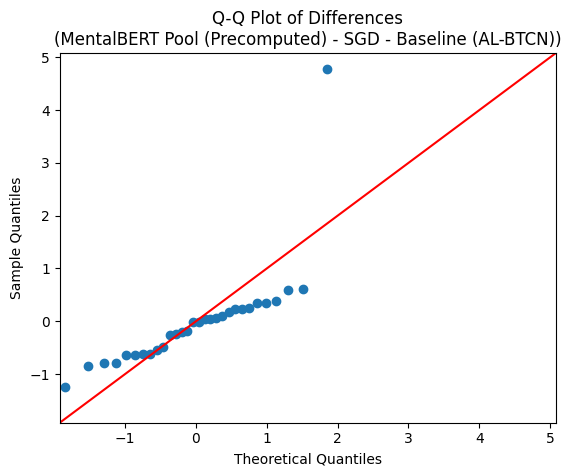


Statistical Analysis: Twitter - Precision

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: -0.0018
95% Confidence Interval: (-0.0125, 0.0089)
Cohen's d: -0.0629
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=-0.3447, p-value=0.6336
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=227.0000, p-value=0.5484
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-0.3447, p-value=0.7328
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=227.0000, p-value=0.9193
Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)


<Figure size 600x400 with 0 Axes>

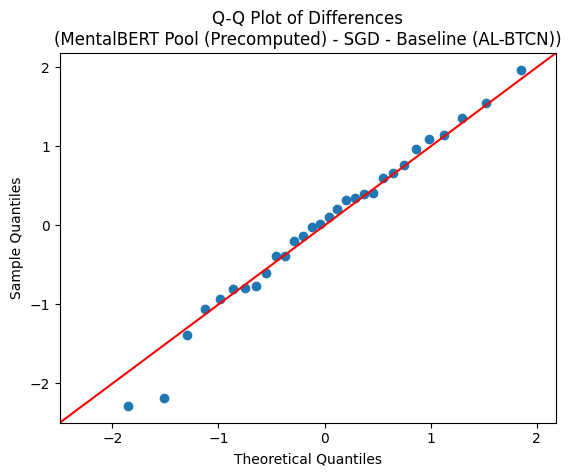


Statistical Analysis: Twitter - Recall

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: -0.0084
95% Confidence Interval: (-0.0306, 0.0138)
Cohen's d: -0.1411
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=-0.7727, p-value=0.7770
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=106.0000, p-value=0.9920
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-0.7727, p-value=0.4459
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=106.0000, p-value=0.0159
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

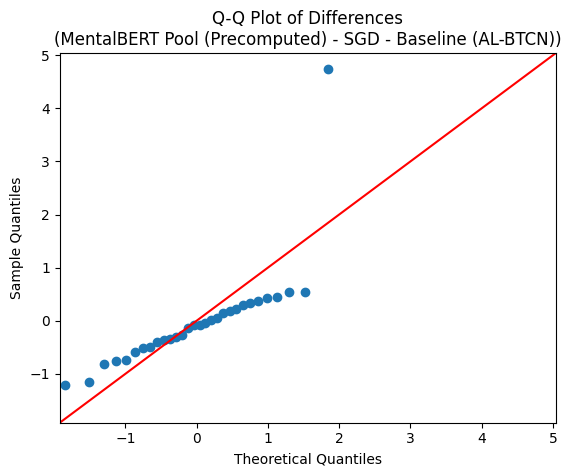


Statistical Analysis: Twitter - F1-Score

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: -0.0043
95% Confidence Interval: (-0.0155, 0.0069)
Cohen's d: -0.1431
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=-0.7835, p-value=0.7802
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=88.0000, p-value=0.9990
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-0.7835, p-value=0.4397
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=88.0000, p-value=0.0022
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

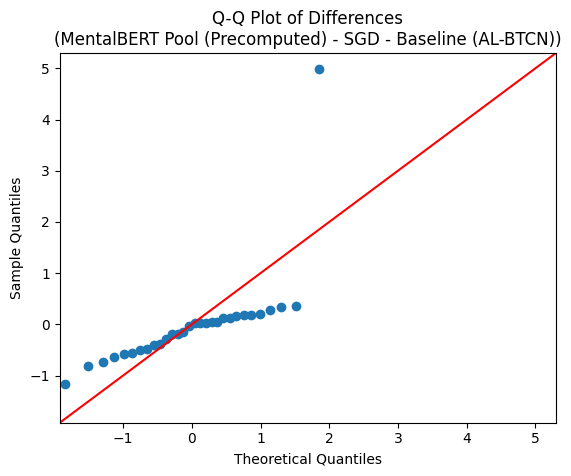


Statistical Analysis: RedditSNS - Accuracy

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: 0.0099
95% Confidence Interval: (0.0065, 0.0132)
Cohen's d: 1.0997
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=6.0233, p-value=0.0000
Result (T-Test): Reject H0 (Significant Improvement) - greater
Wilcoxon Test: statistic=394.0000, p-value=0.0000
Result (Wilcoxon): Reject H0 (Significant Improvement) - greater
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=6.0233, p-value=0.0000
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=12.0000, p-value=0.0000
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

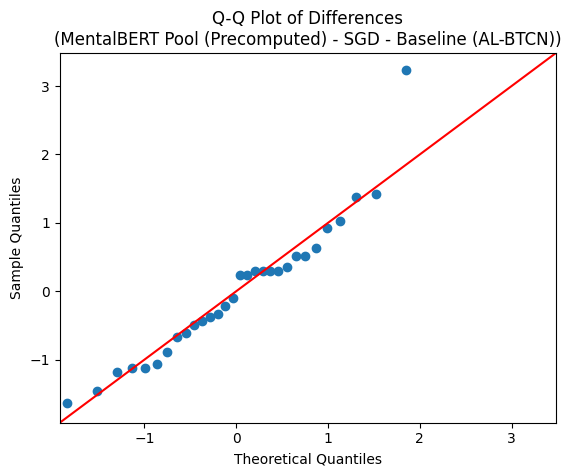


Statistical Analysis: RedditSNS - Precision

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: 0.0125
95% Confidence Interval: (0.0039, 0.0212)
Cohen's d: 0.5414
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=2.9654, p-value=0.0030
Result (T-Test): Reject H0 (Significant Improvement) - greater
Wilcoxon Test: statistic=351.0000, p-value=0.0068
Result (Wilcoxon): Reject H0 (Significant Improvement) - greater
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=2.9654, p-value=0.0060
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=114.0000, p-value=0.0137
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

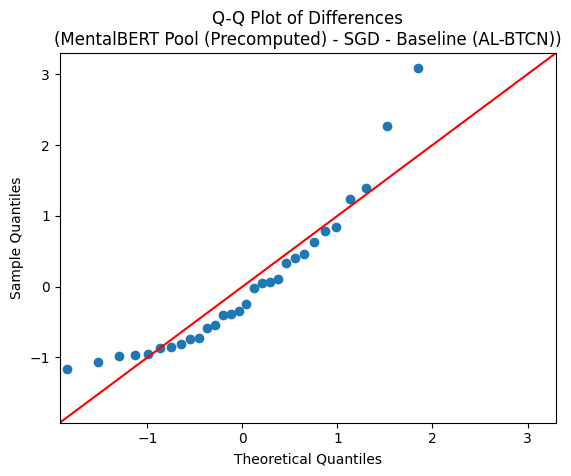


Statistical Analysis: RedditSNS - Recall

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: 0.0080
95% Confidence Interval: (-0.0002, 0.0162)
Cohen's d: 0.3649
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=1.9987, p-value=0.0275
Result (T-Test): Reject H0 (Significant Improvement) - greater
Wilcoxon Test: statistic=341.0000, p-value=0.0124
Result (Wilcoxon): Reject H0 (Significant Improvement) - greater
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=1.9987, p-value=0.0551
Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)
Wilcoxon Test (Two-Sided): statistic=124.0000, p-value=0.0248
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

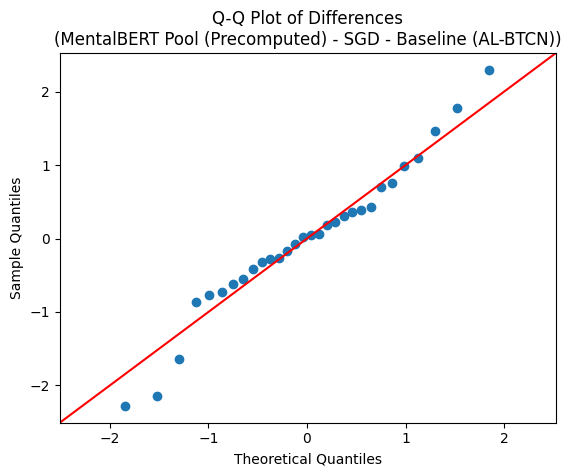


Statistical Analysis: RedditSNS - F1-Score

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: 0.0106
95% Confidence Interval: (0.0075, 0.0138)
Cohen's d: 1.2607
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=6.9052, p-value=0.0000
Result (T-Test): Reject H0 (Significant Improvement) - greater
Wilcoxon Test: statistic=454.0000, p-value=0.0000
Result (Wilcoxon): Reject H0 (Significant Improvement) - greater
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=6.9052, p-value=0.0000
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=11.0000, p-value=0.0000
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

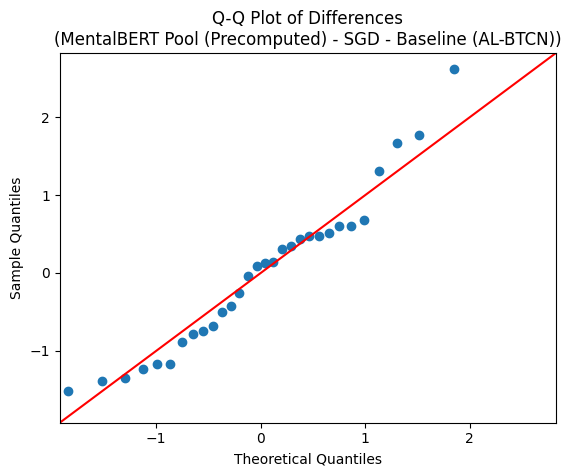


Statistical Analysis: Twitter2 - Accuracy

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: -0.0997
95% Confidence Interval: (-0.1046, -0.0948)
Cohen's d: -7.6413
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=-41.8529, p-value=1.0000
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=0.0000, p-value=1.0000
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-41.8529, p-value=0.0000
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=0.0000, p-value=0.0000
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

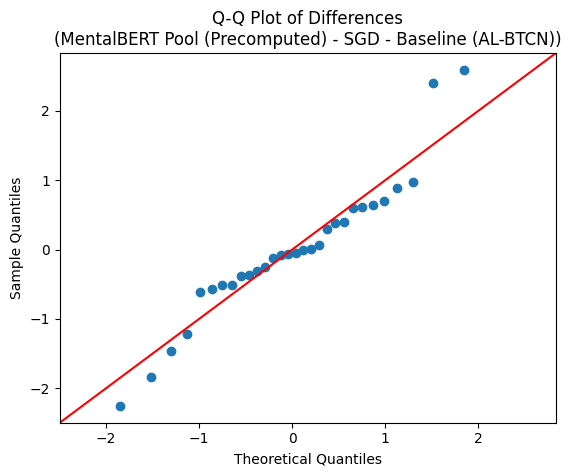


Statistical Analysis: Twitter2 - Precision

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: -0.0869
95% Confidence Interval: (-0.1002, -0.0736)
Cohen's d: -2.4357
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=-13.3409, p-value=1.0000
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=0.0000, p-value=1.0000
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-13.3409, p-value=0.0000
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=0.0000, p-value=0.0000
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

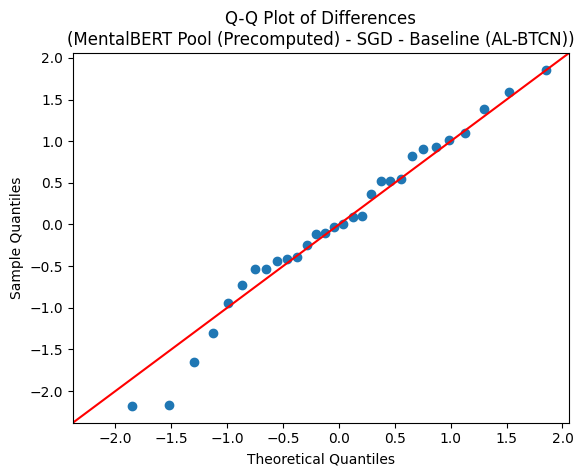


Statistical Analysis: Twitter2 - Recall

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: -0.1140
95% Confidence Interval: (-0.1287, -0.0993)
Cohen's d: -2.9055
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=-15.9139, p-value=1.0000
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=0.0000, p-value=1.0000
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-15.9139, p-value=0.0000
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=0.0000, p-value=0.0000
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

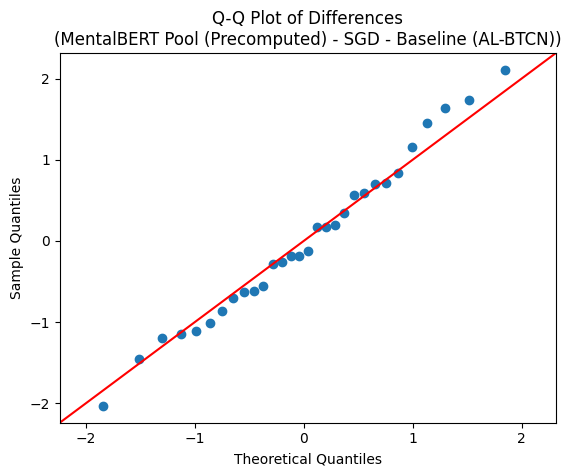


Statistical Analysis: Twitter2 - F1-Score

Comparison: Baseline (AL-BTCN) vs MentalBERT Pool (Precomputed) - SGD
Number of Seeds: 30
Mean Difference: -0.1012
95% Confidence Interval: (-0.1055, -0.0970)
Cohen's d: -8.8843
Alternative Hypothesis: Model greater than Baseline
Paired T-Test: t-statistic=-48.6612, p-value=1.0000
Result (T-Test): Fail to reject H0
Wilcoxon Test: statistic=0.0000, p-value=1.0000
Result (Wilcoxon): Fail to reject H0
--------------------
Alternative Hypothesis: Model != Baseline (Two-Sided)
Paired T-Test (Two-Sided): t-statistic=-48.6612, p-value=0.0000
Result (T-Test Two-Sided): Reject H0 (Significant Difference)
Wilcoxon Test (Two-Sided): statistic=0.0000, p-value=0.0000
Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)


<Figure size 600x400 with 0 Axes>

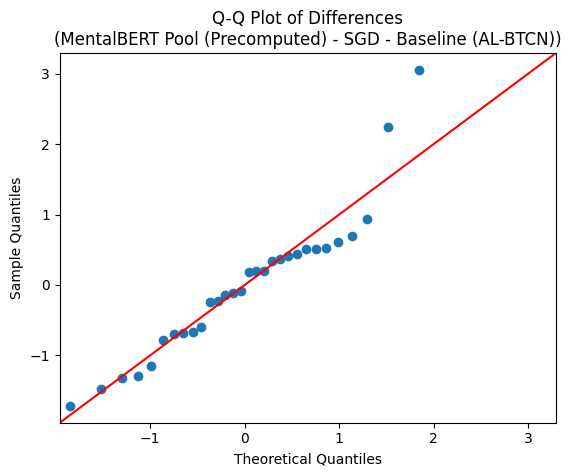

Results saved to c:\Files\Degree\FYP\FYP_ver5\Results\30seeds_results\statistical_analysis_results_final.xlsx
   Dataset     Metric      Baseline Model  \
0   Reddit   Accuracy  Baseline (AL-BTCN)   
1   Reddit  Precision  Baseline (AL-BTCN)   
2   Reddit     Recall  Baseline (AL-BTCN)   
3   Reddit   F1-Score  Baseline (AL-BTCN)   
4  Twitter   Accuracy  Baseline (AL-BTCN)   

                      Comparison Model  Mean Difference  \
0  MentalBERT Pool (Precomputed) - SGD         0.011401   
1  MentalBERT Pool (Precomputed) - SGD        -0.011299   
2  MentalBERT Pool (Precomputed) - SGD         0.041853   
3  MentalBERT Pool (Precomputed) - SGD         0.013757   
4  MentalBERT Pool (Precomputed) - SGD        -0.004020   

   T-Test (1-sided) p-val              T-Test (1-sided) Result  \
0            6.102708e-12  Reject H0 (Significant Improvement)   
1            9.999735e-01                    Fail to reject H0   
2            2.430164e-10  Reject H0 (Significant Improvement)   


In [48]:
import scipy.stats as stats
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

def perform_statistical_analysis(df, dataset_name, metric, baseline_model, results_list=None):
    print(f"\n{'='*20}\nStatistical Analysis: {dataset_name} - {metric}\n{'='*20}")
    
    # Filter data
    data = df[df['Dataset'] == dataset_name]
    if data.empty:
        print(f"No data for {dataset_name}")
        return

    # 1. Average for each seed first
    # Group by Model and Seed to get the mean of the metric for that seed (across folds)
    if 'Seed' in data.columns:
        # Ensure Seed is string to avoid type mismatch (e.g. 1 vs "1")
        data = data.copy()
        data['Seed'] = data['Seed'].astype(str)
        
        seed_avg = data.groupby(['Model Name', 'Seed'])[metric].mean().reset_index()
        pivot_df = seed_avg.pivot(index='Seed', columns='Model Name', values=metric)
    else:
        # If no Seed column, assume data is already aggregated or just use index if appropriate, 
        # but the logic below relies on paired samples (seeds).
        # If 'Seed' is missing, we might be looking at fold-level data directly?
        # Based on previous cells, 'Seed' should exist.
        print("Warning: 'Seed' column not found. Using raw data (might not be paired correctly if not aligned).")
        pivot_df = data.pivot(columns='Model Name', values=metric) # This might fail if index is not unique/aligned

    if baseline_model not in pivot_df.columns:
        print(f"Baseline model '{baseline_model}' not found in data.")
        return
    
    baseline_vals = pivot_df[baseline_model]
    
    other_models = [c for c in pivot_df.columns if c != baseline_model]
    alpha = 0.05
    
    # Determine if higher is better
    higher_is_better = 'Time' not in metric and 'Memory' not in metric and 'Epochs' not in metric
    alt_hyp = 'greater' if higher_is_better else 'less'
    
    for model in other_models:
        model_vals = pivot_df[model]
        # Ensure we have paired data (same seeds)
        # Drop NA if any seed is missing for one of the pair
        pair_df = pd.concat([baseline_vals, model_vals], axis=1).dropna()
        if len(pair_df) < 2:
            print(f"Not enough data points for comparison: {baseline_model} vs {model}")
            print(f"  - Common Seeds: {pair_df.index.tolist()}")
            print(f"  - Baseline Seeds ({len(baseline_vals.dropna())}): {baseline_vals.dropna().index.tolist()}")
            print(f"  - Model Seeds ({len(model_vals.dropna())}): {model_vals.dropna().index.tolist()}")
            continue
            
        diff = pair_df[model] - pair_df[baseline_model]
        n = len(diff)
        mean_diff = diff.mean()
        std_diff = diff.std(ddof=1)
        
        print(f"\nComparison: {baseline_model} vs {model}")
        print(f"Number of Seeds: {n}")
        print(f"Mean Difference: {mean_diff:.4f}")
        
        # Confidence Interval (95%)
        ci = (0.0, 0.0)
        if std_diff != 0:
            se = std_diff / np.sqrt(n)
            ci = stats.t.interval(1 - alpha, df=n-1, loc=mean_diff, scale=se)
            print(f"95% Confidence Interval: ({ci[0]:.4f}, {ci[1]:.4f})")
        else:
            print("95% Confidence Interval: (0.0000, 0.0000) [Zero Variance]")
        
        # Cohen's d (for paired samples)
        # d = mean_diff / std_diff
        if std_diff != 0:
            cohens_d = mean_diff / std_diff
        else:
            cohens_d = 0
        print(f"Cohen's d: {cohens_d:.4f}")
        
        # --- One-Sided Test (Improvement) ---
        print(f"Alternative Hypothesis: Model {alt_hyp} than Baseline")

        # Paired T-Test
        t_stat, p_val_t = stats.ttest_rel(pair_df[model], pair_df[baseline_model], alternative=alt_hyp)
        print(f"Paired T-Test: t-statistic={t_stat:.4f}, p-value={p_val_t:.4f}")
        
        t_test_result = "Reject H0 (Significant Improvement)" if p_val_t < alpha else "Fail to reject H0"
        if p_val_t < alpha:
            print(f"Result (T-Test): {t_test_result} - {alt_hyp}")
        else:
            print(f"Result (T-Test): {t_test_result}")
        
        # Wilcoxon Signed-Rank Test
        w_stat, p_val_w = np.nan, np.nan
        wilcoxon_result = "N/A"
        try:
            # Wilcoxon requires differences to be symmetric and non-zero for exact p-values, 
            # but handles ties/zeros with approximation.
            w_stat, p_val_w = stats.wilcoxon(pair_df[model], pair_df[baseline_model], alternative=alt_hyp)
            print(f"Wilcoxon Test: statistic={w_stat:.4f}, p-value={p_val_w:.4f}")
            wilcoxon_result = "Reject H0 (Significant Improvement)" if p_val_w < alpha else "Fail to reject H0"
            if p_val_w < alpha:
                print(f"Result (Wilcoxon): {wilcoxon_result} - {alt_hyp}")
            else:
                print(f"Result (Wilcoxon): {wilcoxon_result}")
        except Exception as e:
            print(f"Wilcoxon Test Failed: {e}")

        # --- Two-Sided Test (Any Difference) ---
        print("-" * 20)
        print(f"Alternative Hypothesis: Model != Baseline (Two-Sided)")

        # Paired T-Test (Two-Sided)
        t_stat_2, p_val_t_2 = stats.ttest_rel(pair_df[model], pair_df[baseline_model], alternative='two-sided')
        print(f"Paired T-Test (Two-Sided): t-statistic={t_stat_2:.4f}, p-value={p_val_t_2:.4f}")
        
        t_test_result_2 = "Reject H0 (Significant Difference)" if p_val_t_2 < alpha else "Fail to reject H0"
        if p_val_t_2 < alpha:
            print("Result (T-Test Two-Sided): Reject H0 (Significant Difference)")
        else:
            print("Result (T-Test Two-Sided): Fail to reject H0 (No Significant Difference)")

        # Wilcoxon Signed-Rank Test (Two-Sided)
        w_stat_2, p_val_w_2 = np.nan, np.nan
        wilcoxon_result_2 = "N/A"
        try:
            w_stat_2, p_val_w_2 = stats.wilcoxon(pair_df[model], pair_df[baseline_model], alternative='two-sided')
            print(f"Wilcoxon Test (Two-Sided): statistic={w_stat_2:.4f}, p-value={p_val_w_2:.4f}")
            wilcoxon_result_2 = "Reject H0 (Significant Difference)" if p_val_w_2 < alpha else "Fail to reject H0"
            if p_val_w_2 < alpha:
                print("Result (Wilcoxon Two-Sided): Reject H0 (Significant Difference)")
            else:
                print("Result (Wilcoxon Two-Sided): Fail to reject H0 (No Significant Difference)")
        except Exception as e:
            print(f"Wilcoxon Test (Two-Sided) Failed: {e}")

        # Q-Q Plot
        plt.figure(figsize=(6, 4))
        sm.qqplot(diff, line='45', fit=True)
        plt.title(f'Q-Q Plot of Differences\n({model} - {baseline_model})')
        plt.show()

        if results_list is not None:
            results_list.append({
                'Dataset': dataset_name,
                'Metric': metric,
                'Baseline Model': baseline_model,
                'Comparison Model': model,
                'Mean Difference': mean_diff,
                'T-Test (1-sided) p-val': p_val_t,
                'T-Test (1-sided) Result': t_test_result,
                'T-Test (2-sided) p-val': p_val_t_2,
                'T-Test (2-sided) Result': t_test_result_2,
                'CI Lower': ci[0],
                'CI Upper': ci[1],
                'Cohens d': cohens_d,
                'Wilcoxon (1-sided) p-val': p_val_w,
                'Wilcoxon (1-sided) Result': wilcoxon_result,
                'Wilcoxon (2-sided) p-val': p_val_w_2,
                'Wilcoxon (2-sided) Result': wilcoxon_result_2,
                'Num Seeds': n
            })

# Run Analysis
metrics_to_analyze = ['Accuracy', 'Precision', 'Recall', 'F1-Score'] # Add others if needed
baseline_name = 'Baseline (AL-BTCN)'
all_stats_results = []

datasets = ['Reddit', 'Twitter', 'RedditSNS', 'Twitter2']

for dataset in datasets:
    for metric in metrics_to_analyze:
        perform_statistical_analysis(full_df_v2, dataset, metric, baseline_name, all_stats_results)

# Save to Excel
if all_stats_results:
    results_df = pd.DataFrame(all_stats_results)
    # base_path_30seeds is defined in the first cell
    output_file = os.path.join(base_path_30seeds, 'statistical_analysis_results_final.xlsx')
    results_df.to_excel(output_file, index=False)
    print(f"Results saved to {output_file}")
    print(results_df.head())